# Beyond Talent: Unveiling the Hidden Factors Behind an Actor's Success
## CMU Movies Summary Corpus
- Authors: Zaynab, Lylia, Ali, Christian, Yassin
---
---

## Table of Contents
- [1. Actors dataset creation](##1.-Actors-dataset-creation )
- [2. Zaynab's part](##2.-Zaynab's-part)
- [3. Lylia's part](##3.-Lylia's-part)
- [4. Ali's part](##4.-Ali's-part)
- [5. Cristians's part](##5.-Christian's-part)
- [6. Network Analysis](##6.-Network-Analysis)

---
## Library import

In [72]:
import ast
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import networkx as nx
import seaborn as sns
import numpy as np
import pandas as pd
from operator import itemgetter
import matplotlib.pyplot as plt
import collections
from community import community_louvain
from networkx.algorithms.community.centrality import girvan_newman
import itertools
from collections import Counter
from scipy.stats import f_oneway
from sklearn.ensemble import RandomForestClassifier
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes
from scipy.stats import f_oneway
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

---
## 1. Actors dataset creation 

### Loading datasets

* ### CMU Movies

In [3]:
movie_columns = [
    'WikipediaMovieID', 'FreebaseMovieID', 'MovieName', 'ReleaseDate', 
    'BoxOfficeRevenue', 'Runtime', 'Languages', 'Countries', 'Genres'
]


movie_metadata = pd.read_csv('./data/MovieSummaries/movie.metadata.tsv', sep='\t', names=movie_columns)

movie_metadata.head(3)

,WikipediaMovieID,FreebaseMovieID,MovieName,ReleaseDate,BoxOfficeRevenue,Runtime,Languages,Countries,Genres
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp..."
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,"{""/m/05f_3"": ""Norwegian Language""}","{""/m/05b4w"": ""Norway""}","{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D..."


In [4]:
movie_metadata.isna().mean()

WikipediaMovieID    0.000000
FreebaseMovieID     0.000000
MovieName           0.000000
ReleaseDate         0.084437
BoxOfficeRevenue    0.897224
Runtime             0.250180
Languages           0.000000
Countries           0.000000
Genres              0.000000
dtype: float64

In [6]:
character_columns = [
    'WikipediaMovieID', 'FreebaseMovieID', 'ReleaseDate', 'CharacterName',
    'ActorDOB', 'ActorGender', 'ActorHeight', 'ActorEthnicity', 
    'ActorName', 'ActorAgeAtRelease', 'FreebaseCharacterActorMapID',
    'FreebaseCharacterID', 'FreebaseActorID'
]

character_metadata = pd.read_csv('./data/MovieSummaries/character.metadata.tsv', sep='\t', names=character_columns)

character_metadata

,WikipediaMovieID,FreebaseMovieID,ReleaseDate,CharacterName,ActorDOB,ActorGender,ActorHeight,ActorEthnicity,ActorName,ActorAgeAtRelease,FreebaseCharacterActorMapID,FreebaseCharacterID,FreebaseActorID
0,975900,/m/03vyhn,2001-08-24,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,/m/0bgcj3x,/m/03wcfv7
1,975900,/m/03vyhn,2001-08-24,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,/m/0bgchn4,/m/0346l4
2,975900,/m/03vyhn,2001-08-24,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,/m/0bgchn_,/m/01vw26l
3,975900,/m/03vyhn,2001-08-24,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,/m/0bgchnq,/m/034hyc
4,975900,/m/03vyhn,2001-08-24,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,/m/0bgchp9,/m/01y9xg
...,...,...,...,...,...,...,...,...,...,...,...,...,...
450664,913762,/m/03pcrp,1992-05-21,Elensh,1970-05,F,NaN,NaN,Dorothy Elias-Fahn,NaN,/m/0kr406c,/m/0kr406h,/m/0b_vcv
450665,913762,/m/03pcrp,1992-05-21,Hibiki,1965-04-12,M,NaN,NaN,Jonathan Fahn,27.0,/m/0kr405_,/m/0kr4090,/m/0bx7_j
450666,28308153,/m/0cp05t9,1957,NaN,1941-11-18,M,1.730,/m/02w7gg,David Hemmings,15.0,/m/0g8ngmc,NaN,/m/022g44
450667,28308153,/m/0cp05t9,1957,NaN,NaN,NaN,NaN,NaN,Roberta Paterson,NaN,/m/0g8ngmj,NaN,/m/0g8ngmm


In [8]:
character_metadata.isna().mean()

WikipediaMovieID               0.000000
FreebaseMovieID                0.000000
ReleaseDate                    0.022178
CharacterName                  0.572205
ActorDOB                       0.235528
ActorGender                    0.101203
ActorHeight                    0.656457
ActorEthnicity                 0.764665
ActorName                      0.002725
ActorAgeAtRelease              0.350841
FreebaseCharacterActorMapID    0.000000
FreebaseCharacterID            0.572183
FreebaseActorID                0.001808
dtype: float64

* ### Actor Height

This dataset was created using webscrapping to enrich the Height column in **character_metadata** as it has 65% nan rate. The scrapping was using API from open.AI and google_search to find heights.

In [4]:
actor_height = pd.read_csv('actor_heights.csv', sep=',')
actor_height

,actor,height
0,Wanda De Jesus,1.65
1,Natasha Henstridge,1.78
2,Ice Cube,1.73
3,Jason Statham,1.78
4,Clea DuVall,1.68
...,...,...
36992,Randy Lee,1.78
36993,Gerald Wong,1.73
36994,Darryl Quon,1.68
36995,Teagle F. Bougere,1.83


* ### Social background

We began our work using a file named "character_metadata", which contained initial actor information including an ActorName column. From this file, we extracted unique actor names to form our baseline dataset.

- **First web scrapping using Wikidata** :
We queried Wikidata to obtain several column features representing attributes of each actor, we matched the Wikidata ID’s with their corresponding target names to retrieve content about specific actors. Specifically, we focused on retrieving education, occupation, religiousBelief, place_of_birth, and languages_spoken. Initially, we intended to leverage all of these web-scraped attributes to gain a rich, multi-faceted view of the actors’ backgrounds. However, due to varying degrees of completeness and relevance, we ultimately retained only **education** and **occupation**.

- **Second web scrapping using Wikipedia** :
After extracting the key attributes from Wikidata, we proceeded to a second stage of enrichment by scraping short biography summaries from Wikipedia. Using these **biography texts**, we employed a natural language processing method based on sentence embeddings generated by the "all-MiniLM-L6-v2" model. We compiled representative phrases for each category of interest—**socioeconomic_background**, **education_level**, and **early_life_opportunities**—and converted both these phrases and the biographies into embedding vectors. By computing cosine similarities between the biography embedding and each category’s representative phrase embeddings, we identified the category whose semantics aligned most closely with the actor’s biography. This approach allowed us to infer nuanced, context-aware categorical attributes for each actor that complemented the more structured data derived from Wikidata.

- **What we deleted and what we kept** :
We decided to drop the education attribute from the first web scrapping due to better, more precise educational indicators derived from our second web scrapping process. Similarly, we discarded the occupation attribute from the first web scrapping since we had a more complete and similar data source already extracted from IMDb.
All features derived solely from the second web scrapping and NLP process, were retained in the final dataset, providing more contextually rich and precise information about the actors’ social and educational environments.

**In the end, we kept only the columns derived from the second web scrapping step, saving them as "socialBackground_data.csv".**

--> Can look into **./webScrapping/social_backgrounf_webScrapping.ipynb** for code details.

In [5]:
social_background = pd.read_csv('socialBackground_data.csv', sep=',')
social_background

,actor_name,socioeconomic_background,education_level,early_life_opportunities
0,Henk Rigters,Privileged,HighlyEducated,FacedSignificantAdversity
1,Tadeusz Borowski,Underprivileged,InformallyEducated,FacedSignificantAdversity
2,Jörg Hube,Privileged,HighlyEducated,PrivilegedStart
3,Bud,Underprivileged,InformallyEducated,Ordinary
4,Peter Sweeney,Underprivileged,FormallyEducated,PrivilegedStart
...,...,...,...,...
134073,Violet Bronte,Privileged,FormallyEducated,PrivilegedStart
134074,Sonny Byrkett,MiddleIncome,FormallyEducated,PrivilegedStart
134075,Susan Byrkett,Privileged,HighlyEducated,PrivilegedStart
134076,Hal Cleaveland,Privileged,HighlyEducated,FacedSignificantAdversity


* ###  Datasets from IMDB

In [6]:
imdb_names = pd.read_csv("./data/IMDB/name.basics.tsv.gz", sep="\t")
imdb_names

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","tt0050419,tt0072308,tt0053137,tt0027125"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","tt0037382,tt0075213,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,music_department,producer","tt0057345,tt0049189,tt0056404,tt0054452"
3,nm0000004,John Belushi,1949,1982,"actor,writer,music_department","tt0072562,tt0077975,tt0080455,tt0078723"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0050986,tt0069467,tt0083922,tt0050976"
...,...,...,...,...,...,...
13926614,nm9993714,Romeo del Rosario,\N,\N,"animation_department,art_department","tt11657662,tt14069590,tt2455546"
13926615,nm9993716,Essias Loberg,\N,\N,\N,\N
13926616,nm9993717,Harikrishnan Rajan,\N,\N,cinematographer,tt8736744
13926617,nm9993718,Aayush Nair,\N,\N,cinematographer,tt8736744


In [7]:
imdb_basics_raw = pd.read_csv("./data/IMDB/title.basics.tsv.gz", sep="\t")
imdb_basics_raw

C:\Users\Yass La Menace\AppData\Local\Temp\ipykernel_4780\2465378119.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  imdb_basics_raw = pd.read_csv("./data/IMDB/title.basics.tsv.gz", sep="\t")


,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short"
2,tt0000003,short,Poor Pierrot,Pauvre Pierrot,0,1892,\N,5,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short"
...,...,...,...,...,...,...,...,...,...
11217428,tt9916848,tvEpisode,Episode #3.17,Episode #3.17,0,2009,\N,\N,"Action,Drama,Family"
11217429,tt9916850,tvEpisode,Episode #3.19,Episode #3.19,0,2010,\N,\N,"Action,Drama,Family"
11217430,tt9916852,tvEpisode,Episode #3.20,Episode #3.20,0,2010,\N,\N,"Action,Drama,Family"
11217431,tt9916856,short,The Wind,The Wind,0,2015,\N,27,Short


In [8]:
imdb_ratings = pd.read_csv("./data/IMDB/title.ratings.tsv.gz", sep="\t")
imdb_ratings

,tconst,averageRating,numVotes
0,tt0000001,5.7,2096
1,tt0000002,5.6,282
2,tt0000003,6.5,2115
3,tt0000004,5.4,182
4,tt0000005,6.2,2845
...,...,...,...
1495756,tt9916730,7.0,12
1495757,tt9916766,7.1,24
1495758,tt9916778,7.2,37
1495759,tt9916840,6.9,11


## Processing the data

In [9]:
## Filter out only movies
imdb_basics = imdb_basics_raw[imdb_basics_raw['titleType']=='movie']
imdb_basics

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
8,tt0000009,movie,Miss Jerry,Miss Jerry,0,1894,\N,45,Romance
144,tt0000147,movie,The Corbett-Fitzsimmons Fight,The Corbett-Fitzsimmons Fight,0,1897,\N,100,"Documentary,News,Sport"
498,tt0000502,movie,Bohemios,Bohemios,0,1905,\N,100,\N
570,tt0000574,movie,The Story of the Kelly Gang,The Story of the Kelly Gang,0,1906,\N,70,"Action,Adventure,Biography"
587,tt0000591,movie,The Prodigal Son,L'enfant prodigue,0,1907,\N,90,Drama
...,...,...,...,...,...,...,...,...,...
11217324,tt9916622,movie,Rodolpho Teóphilo - O Legado de um Pioneiro,Rodolpho Teóphilo - O Legado de um Pioneiro,0,2015,\N,57,Documentary
11217351,tt9916680,movie,De la ilusión al desconcierto: cine colombiano...,De la ilusión al desconcierto: cine colombiano...,0,2007,\N,100,Documentary
11217363,tt9916706,movie,Dankyavar Danka,Dankyavar Danka,0,2013,\N,\N,Comedy
11217373,tt9916730,movie,6 Gunn,6 Gunn,0,2017,\N,116,Drama


In [10]:
# Filter out only movies
imdb_basics = imdb_basics[imdb_basics['titleType']=='movie'] 
# Drop columns that are not needed
imdb_basics = imdb_basics.drop(columns=['titleType','originalTitle','isAdult','endYear']) 

imdb_basics.replace('\\N', np.nan, inplace=True) 
imdb_basics = imdb_basics.dropna(subset=['primaryTitle'])

imdb_basics.rename(columns={'primaryTitle': 'MovieName',
                            'startYear':'YearOfRelease',
                            'runtimeMinutes':'Runtime',
                            'genres':'Genres'}, inplace=True)

imdb_basics['Runtime'] = imdb_basics['Runtime'].astype(float)

imdb_basics

,tconst,MovieName,YearOfRelease,Runtime,Genres
8,tt0000009,Miss Jerry,1894,45.0,Romance
144,tt0000147,The Corbett-Fitzsimmons Fight,1897,100.0,"Documentary,News,Sport"
498,tt0000502,Bohemios,1905,100.0,NaN
570,tt0000574,The Story of the Kelly Gang,1906,70.0,"Action,Adventure,Biography"
587,tt0000591,The Prodigal Son,1907,90.0,Drama
...,...,...,...,...,...
11217324,tt9916622,Rodolpho Teóphilo - O Legado de um Pioneiro,2015,57.0,Documentary
11217351,tt9916680,De la ilusión al desconcierto: cine colombiano...,2007,100.0,Documentary
11217363,tt9916706,Dankyavar Danka,2013,NaN,Comedy
11217373,tt9916730,6 Gunn,2017,116.0,Drama


In [11]:
imdb = imdb_basics.merge(imdb_ratings, on="tconst", how="inner")
imdb

,tconst,MovieName,YearOfRelease,Runtime,Genres,averageRating,numVotes
0,tt0000009,Miss Jerry,1894,45.0,Romance,5.4,215
1,tt0000147,The Corbett-Fitzsimmons Fight,1897,100.0,"Documentary,News,Sport",5.2,538
2,tt0000502,Bohemios,1905,100.0,NaN,4.4,18
3,tt0000574,The Story of the Kelly Gang,1906,70.0,"Action,Adventure,Biography",6.0,936
4,tt0000591,The Prodigal Son,1907,90.0,Drama,5.7,28
...,...,...,...,...,...,...,...
319275,tt9916362,Coven,2020,92.0,"Drama,History",6.4,5936
319276,tt9916428,The Secret of China,2019,NaN,"Adventure,History,War",3.6,19
319277,tt9916538,Kuambil Lagi Hatiku,2019,123.0,Drama,8.3,9
319278,tt9916706,Dankyavar Danka,2013,NaN,Comedy,8.4,8


In [13]:
# Convert dictionaries to string
movie_metadata['Genres'] = movie_metadata['Genres'].apply(lambda x : ','.join(list(ast.literal_eval(x).values()))) 
movie_metadata['Languages'] = movie_metadata['Languages'].apply(lambda x : ','.join(list(ast.literal_eval(x).values())))
movie_metadata['Countries'] = movie_metadata['Countries'].apply(lambda x : ','.join(list(ast.literal_eval(x).values())))
movie_metadata

,WikipediaMovieID,FreebaseMovieID,MovieName,ReleaseDate,BoxOfficeRevenue,Runtime,Languages,Countries,Genres
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,English Language,United States of America,"Thriller,Science Fiction,Horror,Adventure,Supe..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,English Language,United States of America,"Mystery,Biographical film,Drama,Crime Drama"
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,Norwegian Language,Norway,"Crime Fiction,Drama"
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,English Language,United Kingdom,"Thriller,Erotic thriller,Psychological thriller"
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,German Language,Germany,Drama
...,...,...,...,...,...,...,...,...,...
81736,35228177,/m/0j7hxnt,Mermaids: The Body Found,2011-03-19,NaN,120.0,English Language,United States of America,Drama
81737,34980460,/m/0g4pl34,Knuckle,2011-01-21,NaN,96.0,English Language,"Ireland,United Kingdom","Biographical film,Drama,Documentary"
81738,9971909,/m/02pygw1,Another Nice Mess,1972-09-22,NaN,66.0,English Language,United States of America,"Satire,Comedy"
81739,913762,/m/03pcrp,The Super Dimension Fortress Macross II: Lover...,1992-05-21,NaN,150.0,Japanese Language,Japan,"Science Fiction,Japanese Movies,Adventure,Anim..."


In [14]:
# Extract the year from the 'ReleaseDate' column using a regex
movie_metadata['YearOfRelease'] = movie_metadata['ReleaseDate'].astype(str).str.extract(r'(\b\d{4}\b)')

# Drop the original 'ReleaseDate' 
movie_metadata.drop(columns=['ReleaseDate'], inplace=True)
movie_metadata

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Runtime,Languages,Countries,Genres,YearOfRelease
0,975900,/m/03vyhn,Ghosts of Mars,14010832.0,98.0,English Language,United States of America,"Thriller,Science Fiction,Horror,Adventure,Supe...",2001
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,NaN,95.0,English Language,United States of America,"Mystery,Biographical film,Drama,Crime Drama",2000
2,28463795,/m/0crgdbh,Brun bitter,NaN,83.0,Norwegian Language,Norway,"Crime Fiction,Drama",1988
3,9363483,/m/0285_cd,White Of The Eye,NaN,110.0,English Language,United Kingdom,"Thriller,Erotic thriller,Psychological thriller",1987
4,261236,/m/01mrr1,A Woman in Flames,NaN,106.0,German Language,Germany,Drama,1983
...,...,...,...,...,...,...,...,...,...
81736,35228177,/m/0j7hxnt,Mermaids: The Body Found,NaN,120.0,English Language,United States of America,Drama,2011
81737,34980460,/m/0g4pl34,Knuckle,NaN,96.0,English Language,"Ireland,United Kingdom","Biographical film,Drama,Documentary",2011
81738,9971909,/m/02pygw1,Another Nice Mess,NaN,66.0,English Language,United States of America,"Satire,Comedy",1972
81739,913762,/m/03pcrp,The Super Dimension Fortress Macross II: Lover...,NaN,150.0,Japanese Language,Japan,"Science Fiction,Japanese Movies,Adventure,Anim...",1992


### Here we are cleaning both imdb and movie_metadata dataset by keeping only one column of the columns that have the same name and year of release.

In [15]:
imdb = imdb.drop_duplicates(subset=['MovieName', 'YearOfRelease'])
movie_metadata = movie_metadata.drop_duplicates(subset=['MovieName', 'YearOfRelease'])

In [16]:
merged_movies = pd.merge(movie_metadata,imdb,how='outer',on=['MovieName','YearOfRelease'])
merged_movies

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Runtime_x,Languages,Countries,Genres_x,YearOfRelease,tconst,Runtime_y,Genres_y,averageRating,numVotes
0,29988427.0,/m/0cryrj0,!Women Art Revolution,NaN,83.0,English Language,"United States of America,Canada","LGBT,History,Documentary",2010,tt1699720,83.0,Documentary,6.8,260.0
1,30332673.0,/m/0crs0hx,#1 Cheerleader Camp,NaN,90.0,,United States of America,"Sports,Sex comedy,Comedy film,Comedy,Teen",2010,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,#1 Serial Killer,NaN,NaN,NaN,NaN,NaN,2013,tt2346170,87.0,Horror,5.6,72.0
3,NaN,NaN,#1915House,NaN,NaN,NaN,NaN,NaN,2018,tt10985348,55.0,"Horror,Thriller",3.4,20.0
4,NaN,NaN,#5,NaN,NaN,NaN,NaN,NaN,2013,tt3120962,68.0,"Biography,Comedy,Fantasy",4.7,21.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359139,12680019.0,/m/02x07kx,…All the Marbles,NaN,113.0,English Language,United States of America,"Drama,Comedy-drama,Comedy",1981,NaN,NaN,NaN,NaN,NaN
359140,27718784.0,/m/0cc744m,…and there wasn’t everafter…,NaN,21.0,English Language,India,Short Film,NaN,NaN,NaN,NaN,NaN,NaN
359141,8277007.0,/m/026yqtg,…men Olsenbanden var ikke død,NaN,89.0,Norwegian Language,Norway,"Crime Fiction,Comedy",1984,NaN,NaN,NaN,NaN,NaN
359142,33021454.0,/m/0h54w6f,₤500 Reward,NaN,NaN,"Silent film,English Language",,Silent film,1918,NaN,NaN,NaN,NaN,NaN


In [17]:
merged_movies['Genres'] = merged_movies[['Genres_x', 'Genres_y']].apply(
    lambda row: ','.join(set(filter(None, (str(row['Genres_x']) + ',' + str(row['Genres_y'])).split(',')))),
    axis=1
)

# Drop the original 'Genres_x' and 'Genres_y' columns
merged_movies.drop(columns=['Genres_x', 'Genres_y'], inplace=True)
merged_movies

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Runtime_x,Languages,Countries,YearOfRelease,tconst,Runtime_y,averageRating,numVotes,Genres
0,29988427.0,/m/0cryrj0,!Women Art Revolution,NaN,83.0,English Language,"United States of America,Canada",2010,tt1699720,83.0,6.8,260.0,"LGBT,History,Documentary"
1,30332673.0,/m/0crs0hx,#1 Cheerleader Camp,NaN,90.0,,United States of America,2010,NaN,NaN,NaN,NaN,"Comedy,Sex comedy,Sports,nan,Comedy film,Teen"
2,NaN,NaN,#1 Serial Killer,NaN,NaN,NaN,NaN,2013,tt2346170,87.0,5.6,72.0,"Horror,nan"
3,NaN,NaN,#1915House,NaN,NaN,NaN,NaN,2018,tt10985348,55.0,3.4,20.0,"Thriller,Horror,nan"
4,NaN,NaN,#5,NaN,NaN,NaN,NaN,2013,tt3120962,68.0,4.7,21.0,"Comedy,nan,Fantasy,Biography"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359139,12680019.0,/m/02x07kx,…All the Marbles,NaN,113.0,English Language,United States of America,1981,NaN,NaN,NaN,NaN,"Comedy,Comedy-drama,nan,Drama"
359140,27718784.0,/m/0cc744m,…and there wasn’t everafter…,NaN,21.0,English Language,India,NaN,NaN,NaN,NaN,NaN,"nan,Short Film"
359141,8277007.0,/m/026yqtg,…men Olsenbanden var ikke død,NaN,89.0,Norwegian Language,Norway,1984,NaN,NaN,NaN,NaN,"Comedy,nan,Crime Fiction"
359142,33021454.0,/m/0h54w6f,₤500 Reward,NaN,NaN,"Silent film,English Language",,1918,NaN,NaN,NaN,NaN,"Silent film,nan"


In [18]:
merged_movies['Genres'] = merged_movies['Genres'].apply(
    lambda x: ','.join([genre.strip() for genre in x.split(',') if genre.lower() != 'nan'])
)
merged_movies

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Runtime_x,Languages,Countries,YearOfRelease,tconst,Runtime_y,averageRating,numVotes,Genres
0,29988427.0,/m/0cryrj0,!Women Art Revolution,NaN,83.0,English Language,"United States of America,Canada",2010,tt1699720,83.0,6.8,260.0,"LGBT,History,Documentary"
1,30332673.0,/m/0crs0hx,#1 Cheerleader Camp,NaN,90.0,,United States of America,2010,NaN,NaN,NaN,NaN,"Comedy,Sex comedy,Sports,Comedy film,Teen"
2,NaN,NaN,#1 Serial Killer,NaN,NaN,NaN,NaN,2013,tt2346170,87.0,5.6,72.0,Horror
3,NaN,NaN,#1915House,NaN,NaN,NaN,NaN,2018,tt10985348,55.0,3.4,20.0,"Thriller,Horror"
4,NaN,NaN,#5,NaN,NaN,NaN,NaN,2013,tt3120962,68.0,4.7,21.0,"Comedy,Fantasy,Biography"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359139,12680019.0,/m/02x07kx,…All the Marbles,NaN,113.0,English Language,United States of America,1981,NaN,NaN,NaN,NaN,"Comedy,Comedy-drama,Drama"
359140,27718784.0,/m/0cc744m,…and there wasn’t everafter…,NaN,21.0,English Language,India,NaN,NaN,NaN,NaN,NaN,Short Film
359141,8277007.0,/m/026yqtg,…men Olsenbanden var ikke død,NaN,89.0,Norwegian Language,Norway,1984,NaN,NaN,NaN,NaN,"Comedy,Crime Fiction"
359142,33021454.0,/m/0h54w6f,₤500 Reward,NaN,NaN,"Silent film,English Language",,1918,NaN,NaN,NaN,NaN,Silent film


In [19]:
# Create a unified 'Runtime' column, prioritizing non-NaN values
merged_movies['Runtime'] = merged_movies[['Runtime_x', 'Runtime_y']].apply(
    lambda row: row['Runtime_x'] if not pd.isna(row['Runtime_x']) else row['Runtime_y'],
    axis=1
)

# Drop the original 'Runtime_x' and 'Runtime_y' columns
merged_movies.drop(columns=['Runtime_x', 'Runtime_y'], inplace=True)
merged_movies

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Languages,Countries,YearOfRelease,tconst,averageRating,numVotes,Genres,Runtime
0,29988427.0,/m/0cryrj0,!Women Art Revolution,NaN,English Language,"United States of America,Canada",2010,tt1699720,6.8,260.0,"LGBT,History,Documentary",83.0
1,30332673.0,/m/0crs0hx,#1 Cheerleader Camp,NaN,,United States of America,2010,NaN,NaN,NaN,"Comedy,Sex comedy,Sports,Comedy film,Teen",90.0
2,NaN,NaN,#1 Serial Killer,NaN,NaN,NaN,2013,tt2346170,5.6,72.0,Horror,87.0
3,NaN,NaN,#1915House,NaN,NaN,NaN,2018,tt10985348,3.4,20.0,"Thriller,Horror",55.0
4,NaN,NaN,#5,NaN,NaN,NaN,2013,tt3120962,4.7,21.0,"Comedy,Fantasy,Biography",68.0
...,...,...,...,...,...,...,...,...,...,...,...,...
359139,12680019.0,/m/02x07kx,…All the Marbles,NaN,English Language,United States of America,1981,NaN,NaN,NaN,"Comedy,Comedy-drama,Drama",113.0
359140,27718784.0,/m/0cc744m,…and there wasn’t everafter…,NaN,English Language,India,NaN,NaN,NaN,NaN,Short Film,21.0
359141,8277007.0,/m/026yqtg,…men Olsenbanden var ikke død,NaN,Norwegian Language,Norway,1984,NaN,NaN,NaN,"Comedy,Crime Fiction",89.0
359142,33021454.0,/m/0h54w6f,₤500 Reward,NaN,"Silent film,English Language",,1918,NaN,NaN,NaN,Silent film,NaN


### Here we are creating a new movie that takes wikipedia ID if existing, otherwise it takes IMDB's tconst ID. That way, each movie has one unique identifier.

In [20]:
# Convert 'WikipediaMovieID' to integer where possible
merged_movies['WikipediaMovieID'] = pd.to_numeric(merged_movies['WikipediaMovieID'], errors='coerce').astype('Int64')

# Create the 'new_id' column based on the conditions
merged_movies['new_id'] = merged_movies['WikipediaMovieID'].combine_first(merged_movies['tconst'])
merged_movies

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Languages,Countries,YearOfRelease,tconst,averageRating,numVotes,Genres,Runtime,new_id
0,29988427,/m/0cryrj0,!Women Art Revolution,NaN,English Language,"United States of America,Canada",2010,tt1699720,6.8,260.0,"LGBT,History,Documentary",83.0,29988427
1,30332673,/m/0crs0hx,#1 Cheerleader Camp,NaN,,United States of America,2010,NaN,NaN,NaN,"Comedy,Sex comedy,Sports,Comedy film,Teen",90.0,30332673
2,<NA>,NaN,#1 Serial Killer,NaN,NaN,NaN,2013,tt2346170,5.6,72.0,Horror,87.0,tt2346170
3,<NA>,NaN,#1915House,NaN,NaN,NaN,2018,tt10985348,3.4,20.0,"Thriller,Horror",55.0,tt10985348
4,<NA>,NaN,#5,NaN,NaN,NaN,2013,tt3120962,4.7,21.0,"Comedy,Fantasy,Biography",68.0,tt3120962
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359139,12680019,/m/02x07kx,…All the Marbles,NaN,English Language,United States of America,1981,NaN,NaN,NaN,"Comedy,Comedy-drama,Drama",113.0,12680019
359140,27718784,/m/0cc744m,…and there wasn’t everafter…,NaN,English Language,India,NaN,NaN,NaN,NaN,Short Film,21.0,27718784
359141,8277007,/m/026yqtg,…men Olsenbanden var ikke død,NaN,Norwegian Language,Norway,1984,NaN,NaN,NaN,"Comedy,Crime Fiction",89.0,8277007
359142,33021454,/m/0h54w6f,₤500 Reward,NaN,"Silent film,English Language",,1918,NaN,NaN,NaN,Silent film,NaN,33021454


### Cleaning character_metadata

In [21]:
character_metadata

,WikipediaMovieID,FreebaseMovieID,ReleaseDate,CharacterName,ActorDOB,ActorGender,ActorHeight,ActorEthnicity,ActorName,ActorAgeAtRelease,FreebaseCharacterActorMapID,FreebaseCharacterID,FreebaseActorID
0,975900,/m/03vyhn,2001-08-24,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,/m/0bgcj3x,/m/03wcfv7
1,975900,/m/03vyhn,2001-08-24,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,/m/0bgchn4,/m/0346l4
2,975900,/m/03vyhn,2001-08-24,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,/m/0bgchn_,/m/01vw26l
3,975900,/m/03vyhn,2001-08-24,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,/m/0bgchnq,/m/034hyc
4,975900,/m/03vyhn,2001-08-24,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,/m/0bgchp9,/m/01y9xg
...,...,...,...,...,...,...,...,...,...,...,...,...,...
450664,913762,/m/03pcrp,1992-05-21,Elensh,1970-05,F,NaN,NaN,Dorothy Elias-Fahn,NaN,/m/0kr406c,/m/0kr406h,/m/0b_vcv
450665,913762,/m/03pcrp,1992-05-21,Hibiki,1965-04-12,M,NaN,NaN,Jonathan Fahn,27.0,/m/0kr405_,/m/0kr4090,/m/0bx7_j
450666,28308153,/m/0cp05t9,1957,NaN,1941-11-18,M,1.730,/m/02w7gg,David Hemmings,15.0,/m/0g8ngmc,NaN,/m/022g44
450667,28308153,/m/0cp05t9,1957,NaN,NaN,NaN,NaN,NaN,Roberta Paterson,NaN,/m/0g8ngmj,NaN,/m/0g8ngmm


In [22]:
character_metadata["WikipediaMovieID"].dtype

dtype('int64')

In [23]:
character_metadata.columns

Index(['WikipediaMovieID', 'FreebaseMovieID', 'ReleaseDate', 'CharacterName',
       'ActorDOB', 'ActorGender', 'ActorHeight', 'ActorEthnicity', 'ActorName',
       'ActorAgeAtRelease', 'FreebaseCharacterActorMapID',
       'FreebaseCharacterID', 'FreebaseActorID'],
      dtype='object')

In [24]:
# Extract the year from the 'ReleaseDate' column using a regex
character_metadata['ReleaseDate'] = character_metadata['ReleaseDate'].astype(str).str.extract(r'(\b\d{4}\b)')
character_metadata

,WikipediaMovieID,FreebaseMovieID,ReleaseDate,CharacterName,ActorDOB,ActorGender,ActorHeight,ActorEthnicity,ActorName,ActorAgeAtRelease,FreebaseCharacterActorMapID,FreebaseCharacterID,FreebaseActorID
0,975900,/m/03vyhn,2001,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,/m/0bgcj3x,/m/03wcfv7
1,975900,/m/03vyhn,2001,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,/m/0bgchn4,/m/0346l4
2,975900,/m/03vyhn,2001,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,/m/0bgchn_,/m/01vw26l
3,975900,/m/03vyhn,2001,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,/m/0bgchnq,/m/034hyc
4,975900,/m/03vyhn,2001,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,/m/0bgchp9,/m/01y9xg
...,...,...,...,...,...,...,...,...,...,...,...,...,...
450664,913762,/m/03pcrp,1992,Elensh,1970-05,F,NaN,NaN,Dorothy Elias-Fahn,NaN,/m/0kr406c,/m/0kr406h,/m/0b_vcv
450665,913762,/m/03pcrp,1992,Hibiki,1965-04-12,M,NaN,NaN,Jonathan Fahn,27.0,/m/0kr405_,/m/0kr4090,/m/0bx7_j
450666,28308153,/m/0cp05t9,1957,NaN,1941-11-18,M,1.730,/m/02w7gg,David Hemmings,15.0,/m/0g8ngmc,NaN,/m/022g44
450667,28308153,/m/0cp05t9,1957,NaN,NaN,NaN,NaN,NaN,Roberta Paterson,NaN,/m/0g8ngmj,NaN,/m/0g8ngmm


In [25]:
# Group by 'ActorName' and aggregate relevant columns
grouped_data = character_metadata.groupby('ActorName').agg({
    'WikipediaMovieID': list,  # Aggregate all movie IDs as a list
    'ReleaseDate': list,       # Aggregate release dates as a list
    'ActorDOB': 'first',       # Keep the first DOB (if unique per actor)
    'ActorGender': 'first',    # Keep the first gender (if consistent per actor)
    'ActorAgeAtRelease': list, # Aggregate ages at release as a list
    'CharacterName': list      # Aggregate character names as a list
}).reset_index()

# Optional: Rename columns for clarity
grouped_data.rename(columns={
    'WikipediaMovieID': 'Movies',
    'ReleaseDate': 'ReleaseDates',
    'CharacterName': 'Characters'
}, inplace=True)

grouped_data

,ActorName,Movies,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters
0,Cesarine Prinz\t,"[22643470, 22643388]","[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]"
1,Daniel Newman,[20116200],[1998],1976-05-12,M,[22.0],[Elias Riddler]
2,'Big Bill' Giddinger,[15056534],[1911],None,M,[nan],[nan]
3,'Big' Lee,[23010798],[1973],None,M,[nan],[Junkie in Casino]
4,'Chicken' Holleman,[1873017],[1972],None,None,[nan],[nan]
...,...,...,...,...,...,...,...
134073,雅-miyavi-,[18728484],[2004],1981-09-14,M,[22.0],[nan]
134074,雪乃五月,"[5148040, 2583808]","[2001, 2002]",1970-05-25,F,"[30.0, 31.0]","[nan, nan]"
134075,高山久子,"[1706423, 9411697, 18771696]","[2005, 2001, 1986]",1961-08-16,F,"[43.0, 39.0, 24.0]","[Fugai, nan, nan]"
134076,高橋美紀,[18771696],[1986],1961-09-19,F,[24.0],[nan]


In [26]:
imdb_names

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","tt0050419,tt0072308,tt0053137,tt0027125"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","tt0037382,tt0075213,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,music_department,producer","tt0057345,tt0049189,tt0056404,tt0054452"
3,nm0000004,John Belushi,1949,1982,"actor,writer,music_department","tt0072562,tt0077975,tt0080455,tt0078723"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0050986,tt0069467,tt0083922,tt0050976"
...,...,...,...,...,...,...
13926614,nm9993714,Romeo del Rosario,\N,\N,"animation_department,art_department","tt11657662,tt14069590,tt2455546"
13926615,nm9993716,Essias Loberg,\N,\N,\N,\N
13926616,nm9993717,Harikrishnan Rajan,\N,\N,cinematographer,tt8736744
13926617,nm9993718,Aayush Nair,\N,\N,cinematographer,tt8736744


In [27]:
imdb_names.replace(r'\\N', pd.NA, inplace=True, regex=True)

# Replace missing values with an empty string before splitting
imdb_names['knownForTitles'] = imdb_names['knownForTitles'].apply(
    lambda x: x.split(',') if pd.notna(x) else []
)

In [28]:
# Now explode the column
imdb_names_exploded = imdb_names.explode('knownForTitles')

# Display the result
imdb_names_exploded

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0050419
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0072308
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0053137
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0027125
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage",tt0037382
...,...,...,...,...,...,...
13926614,nm9993714,Romeo del Rosario,<NA>,<NA>,"animation_department,art_department",tt2455546
13926615,nm9993716,Essias Loberg,<NA>,<NA>,<NA>,NaN
13926616,nm9993717,Harikrishnan Rajan,<NA>,<NA>,cinematographer,tt8736744
13926617,nm9993718,Aayush Nair,<NA>,<NA>,cinematographer,tt8736744


In [29]:
# Drop rows where 'knownForTitles' is NaN
imdb_names_exploded = imdb_names_exploded.dropna(subset=['knownForTitles'])

# Verify the result
imdb_names_exploded


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0050419
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0072308
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0053137
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer",tt0027125
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage",tt0037382
...,...,...,...,...,...,...
13926614,nm9993714,Romeo del Rosario,<NA>,<NA>,"animation_department,art_department",tt11657662
13926614,nm9993714,Romeo del Rosario,<NA>,<NA>,"animation_department,art_department",tt14069590
13926614,nm9993714,Romeo del Rosario,<NA>,<NA>,"animation_department,art_department",tt2455546
13926616,nm9993717,Harikrishnan Rajan,<NA>,<NA>,cinematographer,tt8736744


In [31]:
# Group by the original unique identifier (e.g., 'nconst') and aggregate 'knownForTitles' back into lists
imdb_names_reverted = imdb_names_exploded.groupby('nconst').agg({
    'primaryName': 'first',
    'birthYear': 'first',
    'deathYear': 'first',
    'primaryProfession': 'first',
    'knownForTitles': list
}).reset_index()

# Display the result
imdb_names_reverted


,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","[tt0050419, tt0072308, tt0053137, tt0027125]"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","[tt0037382, tt0075213, tt0117057, tt0038355]"
2,nm0000003,Brigitte Bardot,1934,None,"actress,music_department,producer","[tt0057345, tt0049189, tt0056404, tt0054452]"
3,nm0000004,John Belushi,1949,1982,"actor,writer,music_department","[tt0072562, tt0077975, tt0080455, tt0078723]"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","[tt0050986, tt0069467, tt0083922, tt0050976]"
...,...,...,...,...,...,...
12355959,nm9993709,Lu Bevins,None,None,"producer,director,writer","[tt17717854, tt11772904, tt11772812, tt11697102]"
12355960,nm9993713,Sambit Mishra,None,None,"writer,producer","[tt20319332, tt10449366, tt27843798, tt15134202]"
12355961,nm9993714,Romeo del Rosario,None,None,"animation_department,art_department","[tt11657662, tt14069590, tt2455546]"
12355962,nm9993717,Harikrishnan Rajan,None,None,cinematographer,[tt8736744]


In [71]:
imdb_names_reverted.rename(columns={'primaryName': 'ActorName'}, inplace=True)
imdb_names_reverted.columns

Index(['nconst', 'ActorName', 'birthYear', 'deathYear', 'primaryProfession',
       'knownForTitles'],
      dtype='object')

In [74]:
imdb_names_reverted

,nconst,ActorName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"actor,miscellaneous,producer","[tt0050419, tt0072308, tt0053137, tt0027125]"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack,archive_footage","[tt0037382, tt0075213, tt0117057, tt0038355]"
2,nm0000003,Brigitte Bardot,1934,None,"actress,music_department,producer","[tt0057345, tt0049189, tt0056404, tt0054452]"
3,nm0000004,John Belushi,1949,1982,"actor,writer,music_department","[tt0072562, tt0077975, tt0080455, tt0078723]"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","[tt0050986, tt0069467, tt0083922, tt0050976]"
...,...,...,...,...,...,...
12355959,nm9993709,Lu Bevins,None,None,"producer,director,writer","[tt17717854, tt11772904, tt11772812, tt11697102]"
12355960,nm9993713,Sambit Mishra,None,None,"writer,producer","[tt20319332, tt10449366, tt27843798, tt15134202]"
12355961,nm9993714,Romeo del Rosario,None,None,"animation_department,art_department","[tt11657662, tt14069590, tt2455546]"
12355962,nm9993717,Harikrishnan Rajan,None,None,cinematographer,[tt8736744]


In [72]:
grouped_data

,ActorName,Movies,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters
0,Cesarine Prinz\t,"[22643470, 22643388]","[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]"
1,Daniel Newman,[20116200],[1998],1976-05-12,M,[22.0],[Elias Riddler]
2,'Big Bill' Giddinger,[15056534],[1911],None,M,[nan],[nan]
3,'Big' Lee,[23010798],[1973],None,M,[nan],[Junkie in Casino]
4,'Chicken' Holleman,[1873017],[1972],None,None,[nan],[nan]
...,...,...,...,...,...,...,...
134073,雅-miyavi-,[18728484],[2004],1981-09-14,M,[22.0],[nan]
134074,雪乃五月,"[5148040, 2583808]","[2001, 2002]",1970-05-25,F,"[30.0, 31.0]","[nan, nan]"
134075,高山久子,"[1706423, 9411697, 18771696]","[2005, 2001, 1986]",1961-08-16,F,"[43.0, 39.0, 24.0]","[Fugai, nan, nan]"
134076,高橋美紀,[18771696],[1986],1961-09-19,F,[24.0],[nan]


In [75]:
print(f'size of grouped_data: {grouped_data.shape}')
print(f'size of imdb_names_reverted: {imdb_names_reverted.shape}')

size of grouped_data: (134078, 7)
size of imdb_names_reverted: (12355964, 6)


In [78]:
# Check duplicates in grouped_data
print(grouped_data['ActorName'].value_counts().head(10))

# Check duplicates in imdb_names_reverted
print(imdb_names_reverted['ActorName'].value_counts().head(10))


ActorName
 Cesarine Prinz\t       1
Mildred Natwick         1
Mildred Miller          1
Mildred Kornman         1
Mildred Joanne Smith    1
Mildred Harris          1
Mildred Dunnock         1
Mildred Dixon           1
Mildred Davis           1
Mildred Coles           1
Name: count, dtype: int64
ActorName
Alex               410
David Smith        389
Michael Smith      385
David              346
Chris              340
Michael            337
John               330
Michael Johnson    327
John Williams      318
Chris Johnson      315
Name: count, dtype: int64


In [79]:
imdb_names_reverted = imdb_names_reverted.drop_duplicates(subset=['ActorName'])

In [81]:
# Merge imdb_names with grouped_data on ActorName
merged_char = grouped_data.merge(imdb_names_reverted, on='ActorName', how='left')

merged_char


,ActorName,Movies,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,nconst,birthYear,deathYear,primaryProfession,knownForTitles
0,Cesarine Prinz\t,"[22643470, 22643388]","[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,NaN,NaN,NaN,NaN
1,Daniel Newman,[20116200],[1998],1976-05-12,M,[22.0],[Elias Riddler],NaN,NaN,NaN,NaN,NaN
2,'Big Bill' Giddinger,[15056534],[1911],None,M,[nan],[nan],NaN,NaN,NaN,NaN,NaN
3,'Big' Lee,[23010798],[1973],None,M,[nan],[Junkie in Casino],nm2544168,1939,None,actor,[tt0069761]
4,'Chicken' Holleman,[1873017],[1972],None,None,[nan],[nan],NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
134073,雅-miyavi-,[18728484],[2004],1981-09-14,M,[22.0],[nan],NaN,NaN,NaN,NaN,NaN
134074,雪乃五月,"[5148040, 2583808]","[2001, 2002]",1970-05-25,F,"[30.0, 31.0]","[nan, nan]",NaN,NaN,NaN,NaN,NaN
134075,高山久子,"[1706423, 9411697, 18771696]","[2005, 2001, 1986]",1961-08-16,F,"[43.0, 39.0, 24.0]","[Fugai, nan, nan]",NaN,NaN,NaN,NaN,NaN
134076,高橋美紀,[18771696],[1986],1961-09-19,F,[24.0],[nan],NaN,NaN,NaN,NaN,NaN


In [82]:
print(f'size of merged_char: {merged_char.shape}')

size of merged_char: (134078, 12)


In [83]:
merged_char.isna().mean()

ActorName            0.000000
Movies               0.000000
ReleaseDates         0.000000
ActorDOB             0.565812
ActorGender          0.280672
ActorAgeAtRelease    0.000000
Characters           0.000000
nconst               0.100069
birthYear            0.516080
deathYear            0.779606
primaryProfession    0.112114
knownForTitles       0.100069
dtype: float64

In [84]:
merged_char['ActorDOB'] = merged_char['ActorDOB'].combine_first(merged_char['birthYear'])
merged_char

,ActorName,Movies,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,nconst,birthYear,deathYear,primaryProfession,knownForTitles
0,Cesarine Prinz\t,"[22643470, 22643388]","[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,NaN,NaN,NaN,NaN
1,Daniel Newman,[20116200],[1998],1976-05-12,M,[22.0],[Elias Riddler],NaN,NaN,NaN,NaN,NaN
2,'Big Bill' Giddinger,[15056534],[1911],NaN,M,[nan],[nan],NaN,NaN,NaN,NaN,NaN
3,'Big' Lee,[23010798],[1973],1939,M,[nan],[Junkie in Casino],nm2544168,1939,None,actor,[tt0069761]
4,'Chicken' Holleman,[1873017],[1972],NaN,None,[nan],[nan],NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
134073,雅-miyavi-,[18728484],[2004],1981-09-14,M,[22.0],[nan],NaN,NaN,NaN,NaN,NaN
134074,雪乃五月,"[5148040, 2583808]","[2001, 2002]",1970-05-25,F,"[30.0, 31.0]","[nan, nan]",NaN,NaN,NaN,NaN,NaN
134075,高山久子,"[1706423, 9411697, 18771696]","[2005, 2001, 1986]",1961-08-16,F,"[43.0, 39.0, 24.0]","[Fugai, nan, nan]",NaN,NaN,NaN,NaN,NaN
134076,高橋美紀,[18771696],[1986],1961-09-19,F,[24.0],[nan],NaN,NaN,NaN,NaN,NaN


### We gained 13% of additional data for ActorDOB

In [85]:
merged_char.isna().mean()

ActorName            0.000000
Movies               0.000000
ReleaseDates         0.000000
ActorDOB             0.429862
ActorGender          0.280672
ActorAgeAtRelease    0.000000
Characters           0.000000
nconst               0.100069
birthYear            0.516080
deathYear            0.779606
primaryProfession    0.112114
knownForTitles       0.100069
dtype: float64

In [86]:
merged_char.drop(columns=["birthYear","deathYear"], inplace=True)

In [87]:
merged_char.isna().mean()

ActorName            0.000000
Movies               0.000000
ReleaseDates         0.000000
ActorDOB             0.429862
ActorGender          0.280672
ActorAgeAtRelease    0.000000
Characters           0.000000
nconst               0.100069
primaryProfession    0.112114
knownForTitles       0.100069
dtype: float64

In [88]:
# Function to merge two columns containing lists
def merge_lists(col1, col2):
    # Ensure both columns are lists, replace NaNs or invalid values with empty lists
    col1 = col1 if isinstance(col1, list) else []
    col2 = col2 if isinstance(col2, list) else []
    return col1 + col2

# Merge 'Movies' and 'knownForTitles' into one column 'movieIDs'
merged_char['MoviesIDs'] = merged_char.apply(lambda row: merge_lists(row['Movies'], row['knownForTitles']), axis=1)

# Optional: Drop the original 'Movies' and 'knownForTitles' columns
# merged_char.drop(columns=['Movies', 'knownForTitles'], inplace=True)

# Display the updated DataFrame
merged_char[['ActorName', 'MoviesIDs']].sample(20)


,ActorName,MoviesIDs
62182,Johnny Aland,"[18516420, tt0089729]"
35159,Elías Serrano,"[12242917, tt1838627, tt0367875, tt0146664, tt..."
126188,Uni Parks,[16032589]
43725,Gina Montanna,[35581515]
132404,Yukihiro Haruzono,"[31954721, tt1590796, tt3317310, tt1653913, tt..."
87495,Michael Lazar,"[20844864, tt1146333]"
27721,David Chung,"[6288907, 4299492, tt0079146, tt0095937, tt009..."
133418,Zhen Ying,"[2684702, tt0223998, tt32575572]"
120289,Szu-yun Chen,"[5583712, tt0074151]"
110467,S. Kiligin,[23697301]


In [89]:
merged_char.isna().mean()

ActorName            0.000000
Movies               0.000000
ReleaseDates         0.000000
ActorDOB             0.429862
ActorGender          0.280672
ActorAgeAtRelease    0.000000
Characters           0.000000
nconst               0.100069
primaryProfession    0.112114
knownForTitles       0.100069
MoviesIDs            0.000000
dtype: float64

In [90]:
merged_char.columns

Index(['ActorName', 'Movies', 'ReleaseDates', 'ActorDOB', 'ActorGender',
       'ActorAgeAtRelease', 'Characters', 'nconst', 'primaryProfession',
       'knownForTitles', 'MoviesIDs'],
      dtype='object')

In [92]:
merged_char.drop(columns=['nconst'], inplace=True)
merged_char

,ActorName,Movies,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,knownForTitles,MoviesIDs
0,Cesarine Prinz\t,"[22643470, 22643388]","[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,NaN,"[22643470, 22643388]"
1,Daniel Newman,[20116200],[1998],1976-05-12,M,[22.0],[Elias Riddler],NaN,NaN,[20116200]
2,'Big Bill' Giddinger,[15056534],[1911],NaN,M,[nan],[nan],NaN,NaN,[15056534]
3,'Big' Lee,[23010798],[1973],1939,M,[nan],[Junkie in Casino],actor,[tt0069761],"[23010798, tt0069761]"
4,'Chicken' Holleman,[1873017],[1972],NaN,None,[nan],[nan],NaN,NaN,[1873017]
...,...,...,...,...,...,...,...,...,...,...
134073,雅-miyavi-,[18728484],[2004],1981-09-14,M,[22.0],[nan],NaN,NaN,[18728484]
134074,雪乃五月,"[5148040, 2583808]","[2001, 2002]",1970-05-25,F,"[30.0, 31.0]","[nan, nan]",NaN,NaN,"[5148040, 2583808]"
134075,高山久子,"[1706423, 9411697, 18771696]","[2005, 2001, 1986]",1961-08-16,F,"[43.0, 39.0, 24.0]","[Fugai, nan, nan]",NaN,NaN,"[1706423, 9411697, 18771696]"
134076,高橋美紀,[18771696],[1986],1961-09-19,F,[24.0],[nan],NaN,NaN,[18771696]


In [93]:
merged_char.drop(columns=['Movies','knownForTitles'], inplace=True)


### Now for each actor in merged_car we want to add a Ratings column with the ratings of each movie in Movies, and a Numvotes with their corresponding number of votes. These ratings and nujmber of votes will be looked up from the merged movies dataset in which we have an id column to correctly identify the movie and ratings column and numVotes column.

In [94]:
merged_movies

,WikipediaMovieID,FreebaseMovieID,MovieName,BoxOfficeRevenue,Languages,Countries,YearOfRelease,tconst,averageRating,numVotes,Genres,Runtime,new_id
0,29988427,/m/0cryrj0,!Women Art Revolution,NaN,English Language,"United States of America,Canada",2010,tt1699720,6.8,260.0,"LGBT,History,Documentary",83.0,29988427
1,30332673,/m/0crs0hx,#1 Cheerleader Camp,NaN,,United States of America,2010,NaN,NaN,NaN,"Comedy,Sex comedy,Sports,Comedy film,Teen",90.0,30332673
2,<NA>,NaN,#1 Serial Killer,NaN,NaN,NaN,2013,tt2346170,5.6,72.0,Horror,87.0,tt2346170
3,<NA>,NaN,#1915House,NaN,NaN,NaN,2018,tt10985348,3.4,20.0,"Thriller,Horror",55.0,tt10985348
4,<NA>,NaN,#5,NaN,NaN,NaN,2013,tt3120962,4.7,21.0,"Comedy,Fantasy,Biography",68.0,tt3120962
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359139,12680019,/m/02x07kx,…All the Marbles,NaN,English Language,United States of America,1981,NaN,NaN,NaN,"Comedy,Comedy-drama,Drama",113.0,12680019
359140,27718784,/m/0cc744m,…and there wasn’t everafter…,NaN,English Language,India,NaN,NaN,NaN,NaN,Short Film,21.0,27718784
359141,8277007,/m/026yqtg,…men Olsenbanden var ikke død,NaN,Norwegian Language,Norway,1984,NaN,NaN,NaN,"Comedy,Crime Fiction",89.0,8277007
359142,33021454,/m/0h54w6f,₤500 Reward,NaN,"Silent film,English Language",,1918,NaN,NaN,NaN,Silent film,NaN,33021454


In [95]:
merged_movies.isna().mean()

WikipediaMovieID    0.772921
FreebaseMovieID     0.772921
MovieName           0.000000
BoxOfficeRevenue    0.976636
Languages           0.772921
Countries           0.772921
YearOfRelease       0.019126
tconst              0.116187
averageRating       0.116187
numVotes            0.116187
Genres              0.000000
Runtime             0.128372
new_id              0.000000
dtype: float64

In [96]:
# Step 1: Explode 'merged_char' on'MoviesIDs'
merged_char_exploded = merged_char.explode('MoviesIDs')
merged_char_exploded


,ActorName,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,MoviesIDs
0,Cesarine Prinz\t,"[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,22643470
0,Cesarine Prinz\t,"[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,22643388
1,Daniel Newman,[1998],1976-05-12,M,[22.0],[Elias Riddler],NaN,20116200
2,'Big Bill' Giddinger,[1911],NaN,M,[nan],[nan],NaN,15056534
3,'Big' Lee,[1973],1939,M,[nan],[Junkie in Casino],actor,23010798
...,...,...,...,...,...,...,...,...
134076,高橋美紀,[1986],1961-09-19,F,[24.0],[nan],NaN,18771696
134077,高田由美,"[1999, 1997, 1993, 1996]",1961-09-21,F,"[37.0, 35.0, 31.0, 34.0]","[nan, Ayeka, nan, nan]",NaN,4174679
134077,高田由美,"[1999, 1997, 1993, 1996]",1961-09-21,F,"[37.0, 35.0, 31.0, 34.0]","[nan, Ayeka, nan, nan]",NaN,5396840
134077,高田由美,"[1999, 1997, 1993, 1996]",1961-09-21,F,"[37.0, 35.0, 31.0, 34.0]","[nan, Ayeka, nan, nan]",NaN,28657324


In [97]:
merged_char_exploded.isna().mean()

ActorName            0.000000
ReleaseDates         0.000000
ActorDOB             0.246134
ActorGender          0.167716
ActorAgeAtRelease    0.000000
Characters           0.000000
primaryProfession    0.045812
MoviesIDs            0.000000
dtype: float64

In [98]:

# Step 2: Rename 'MoviesIDs' to 'new_id' for merging
merged_char_exploded = merged_char_exploded.rename(columns={'MoviesIDs': 'new_id'})

# Step 3: Merge 'merged_char_exploded' with 'merged_movies' on 'new_id'
result = pd.merge(
    merged_char_exploded, 
    merged_movies[['Countries', 'YearOfRelease', 'averageRating', 'numVotes', 'Genres', 'Runtime', 'new_id']],
    on='new_id',
    how='left'
)

# Display the resulting DataFrame
result


,ActorName,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,averageRating,numVotes,Genres,Runtime
0,Cesarine Prinz\t,"[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,22643470,Netherlands,1926,NaN,NaN,Comedy,NaN
1,Cesarine Prinz\t,"[1926, 1922]",1883-12-20,F,"[nan, nan]","[nan, nan]",NaN,22643388,Netherlands,1922,NaN,NaN,Silent film,70.0
2,Daniel Newman,[1998],1976-05-12,M,[22.0],[Elias Riddler],NaN,20116200,"United States of America,Canada,Luxembourg",1998,NaN,NaN,"Science Fiction,Drama",120.0
3,'Big Bill' Giddinger,[1911],NaN,M,[nan],[nan],NaN,15056534,United States of America,1911,NaN,NaN,"History,Silent film,Indie,Short Film,Western",20.0
4,'Big' Lee,[1973],1939,M,[nan],[Junkie in Casino],actor,23010798,United States of America,1973,5.7,933.0,"Thriller,Crime,Drama,Crime Fiction",116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858411,高橋美紀,[1986],1961-09-19,F,[24.0],[nan],NaN,18771696,Japan,1986,NaN,NaN,"Japanese Movies,Animation",45.0
858412,高田由美,"[1999, 1997, 1993, 1996]",1961-09-21,F,"[37.0, 35.0, 31.0, 34.0]","[nan, Ayeka, nan, nan]",NaN,4174679,Japan,1999,NaN,NaN,Japanese Movies,95.0
858413,高田由美,"[1999, 1997, 1993, 1996]",1961-09-21,F,"[37.0, 35.0, 31.0, 34.0]","[nan, Ayeka, nan, nan]",NaN,5396840,Japan,1997,NaN,NaN,"Comedy,Animation,Science Fiction,Anime,Fantasy",95.0
858414,高田由美,"[1999, 1997, 1993, 1996]",1961-09-21,F,"[37.0, 35.0, 31.0, 34.0]","[nan, Ayeka, nan, nan]",NaN,28657324,Japan,1993,NaN,NaN,"Japanese Movies,Animation,Comedy",NaN


In [99]:
result.dropna(subset=['averageRating'], inplace=True)
result_grouped=result.groupby('ActorName').agg({
    'ReleaseDates': 'first',
    'ActorDOB': 'first',
    'ActorGender': 'first',
    'ActorAgeAtRelease': 'first',
    'Characters': 'first',
    'primaryProfession': 'first',
    'new_id': list,
    'Countries': list,
    'YearOfRelease': list,
    'averageRating': list,
    'numVotes': list,
    'Genres': list,
    'Runtime': list,    
}).reset_index()

result_grouped

,ActorName,ReleaseDates,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,averageRating,numVotes,Genres,Runtime
0,'Big' Lee,[1973],1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],[933.0],"[Thriller,Crime,Drama,Crime Fiction]",[116.0]
1,'Chicken' Holleman,[1972],None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],[11281.0],"[Thriller,Romance,Crime,Crime Fiction,Docudram...",[88.0]
2,'Evil' Ted Smith,[1991],None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]","[6205.0, 848.0, 1565.0]","[Comedy,Japanese Movies,Martial Arts Film,Acti...","[92.0, 92.0, 90.0]"
3,'Kecske' Molnár Levente,[2010],None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],[1173.0],"[World cinema,Buddy Picture,Drama]",[100.0]
4,'King Kong' Kashey,[1943],1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],[286.0],"[Comedy,Action,Short Film,Comedy film,Adventur...",[43.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,[1983],1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],[77.0],"[Japanese Movies,Romance,Comedy]",[101.0]
119223,關淑怡,"[1992, 1997]",1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]","[221.0, 35193.0]","[Comedy,Romance,Fantasy Comedy,Action,Chinese ...","[81.0, 99.0]"
119224,陳文媛,[2003],1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],[387.0],"[World cinema,Horror,Drama,Chinese Movies]",[90.0]
119225,陳曉東,"[1998, 2012]",1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]","[1270.0, 134.0]","[Comedy,Romance,Romantic comedy,Drama,Chinese ...","[100.0, 137.0]"


In [101]:
result_grouped.isna().mean()

ActorName            0.000000
ReleaseDates         0.000000
ActorDOB             0.406695
ActorGender          0.274552
ActorAgeAtRelease    0.000000
Characters           0.000000
primaryProfession    0.085576
new_id               0.000000
Countries            0.000000
YearOfRelease        0.000000
averageRating        0.000000
numVotes             0.000000
Genres               0.000000
Runtime              0.000000
dtype: float64

In [102]:
result_grouped.drop(columns=['ReleaseDates'], inplace=True)
result_grouped.isna().mean()

ActorName            0.000000
ActorDOB             0.406695
ActorGender          0.274552
ActorAgeAtRelease    0.000000
Characters           0.000000
primaryProfession    0.085576
new_id               0.000000
Countries            0.000000
YearOfRelease        0.000000
averageRating        0.000000
numVotes             0.000000
Genres               0.000000
Runtime              0.000000
dtype: float64

## Adding Oscars to our Dataset

In [103]:
oscar_awards=pd.read_csv('./data/MovieSummaries/the_oscar_award.csv')
oscar_awards

,year_film,year_ceremony,ceremony,category,name,film,winner
0,1927,1928,1,ACTOR,Richard Barthelmess,The Noose,False
1,1927,1928,1,ACTOR,Emil Jannings,The Last Command,True
2,1927,1928,1,ACTRESS,Louise Dresser,A Ship Comes In,False
3,1927,1928,1,ACTRESS,Janet Gaynor,7th Heaven,True
4,1927,1928,1,ACTRESS,Gloria Swanson,Sadie Thompson,False
...,...,...,...,...,...,...,...
10884,2023,2024,96,WRITING (Original Screenplay),Written by Celine Song,Past Lives,False
10885,2023,2024,96,JEAN HERSHOLT HUMANITARIAN AWARD,NaN,NaN,True
10886,2023,2024,96,HONORARY AWARD,"To Angela Bassett, who has inspired audiences ...",NaN,True
10887,2023,2024,96,HONORARY AWARD,"To Mel Brooks, for his comedic brilliance, pro...",NaN,True


In [104]:
# we take only the oscars for the best actor and actress
oscar_awards['actor']=oscar_awards['category'].str.contains(r'actor|actress', case=False)

df_actors=oscar_awards[oscar_awards['actor']==True]
df_actors

,year_film,year_ceremony,ceremony,category,name,film,winner,actor
0,1927,1928,1,ACTOR,Richard Barthelmess,The Noose,False,True
1,1927,1928,1,ACTOR,Emil Jannings,The Last Command,True,True
2,1927,1928,1,ACTRESS,Louise Dresser,A Ship Comes In,False,True
3,1927,1928,1,ACTRESS,Janet Gaynor,7th Heaven,True,True
4,1927,1928,1,ACTRESS,Gloria Swanson,Sadie Thompson,False,True
...,...,...,...,...,...,...,...,...
10780,2023,2024,96,ACTRESS IN A SUPPORTING ROLE,Emily Blunt,Oppenheimer,False,True
10781,2023,2024,96,ACTRESS IN A SUPPORTING ROLE,Danielle Brooks,The Color Purple,False,True
10782,2023,2024,96,ACTRESS IN A SUPPORTING ROLE,America Ferrera,Barbie,False,True
10783,2023,2024,96,ACTRESS IN A SUPPORTING ROLE,Jodie Foster,Nyad,False,True


In [105]:
df_actors_filtered = df_actors.drop(columns=['year_film', 'ceremony', 'category', 'film', 'actor'])

df_actors_filtered = df_actors_filtered.groupby('name').agg({
    'year_ceremony': lambda x: ', '.join(map(str, sorted(x))),  # Concatenate sorted years
    'winner': lambda x: any(x)  # Logical OR for 'winner'
}).reset_index()

# Rename the 'name' column in 'df_actors_filtered' to 'ActorName'
df_actors_filtered = df_actors_filtered.rename(columns={'name': 'ActorName'})

df_actors_filtered = df_actors_filtered[df_actors_filtered['ActorName'].isin(result_grouped['ActorName'])]

result_grouped = pd.merge(result_grouped, df_actors_filtered, on='ActorName', how='left')

result_grouped = result_grouped.rename(columns={'winner' : 'Oscar'})
result_grouped['Oscar'] = result_grouped['Oscar'].replace({True: 'winner', False: 'nominated'}).fillna('nothing')
result_grouped

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,averageRating,numVotes,Genres,Runtime,year_ceremony,Oscar
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],[933.0],"[Thriller,Crime,Drama,Crime Fiction]",[116.0],NaN,nothing
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],[11281.0],"[Thriller,Romance,Crime,Crime Fiction,Docudram...",[88.0],NaN,nothing
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]","[6205.0, 848.0, 1565.0]","[Comedy,Japanese Movies,Martial Arts Film,Acti...","[92.0, 92.0, 90.0]",NaN,nothing
3,'Kecske' Molnár Levente,None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],[1173.0],"[World cinema,Buddy Picture,Drama]",[100.0],NaN,nothing
4,'King Kong' Kashey,1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],[286.0],"[Comedy,Action,Short Film,Comedy film,Adventur...",[43.0],NaN,nothing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],[77.0],"[Japanese Movies,Romance,Comedy]",[101.0],NaN,nothing
119223,關淑怡,1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]","[221.0, 35193.0]","[Comedy,Romance,Fantasy Comedy,Action,Chinese ...","[81.0, 99.0]",NaN,nothing
119224,陳文媛,1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],[387.0],"[World cinema,Horror,Drama,Chinese Movies]",[90.0],NaN,nothing
119225,陳曉東,1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]","[1270.0, 134.0]","[Comedy,Romance,Romantic comedy,Drama,Chinese ...","[100.0, 137.0]",NaN,nothing


In [106]:
result_grouped["Oscar"].value_counts()

Oscar
nothing      118294
nominated       625
winner          308
Name: count, dtype: int64

# <span style="color: red;">i have to add Celeb A, social bg, height merging here</span>


In [148]:
result_grouped=pd.read_pickle('final_actors_19_12_2024.pkl')

In [149]:
result_grouped.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'Score_PCA_2_scaled', 'top_3_countries', 'top_3_genre',
       'socioeconomic_background', 'education_level',
       'early_life_opportunities', 'ActorHeight', 'Arched_Eyebrows',
       'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
       'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Straight_Hair', 'Wavy_Hair', 'professionCategory'],
      dtype='object')

In [150]:
result_grouped['Oscar'].unique()

array(['nothing', 'nominated', 'winner'], dtype=object)

## Scoring

##  PCA Implementation

In [151]:
result_grouped

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,No_Beard,Oval_Face,Pale_Skin,Pointy_Nose,Receding_Hairline,Rosy_Cheeks,Sideburns,Straight_Hair,Wavy_Hair,professionCategory
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,otherOcc
3,'Kecske' Molnár Levente,None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
4,'King Kong' Kashey,1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
119223,關淑怡,1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
119224,陳文媛,1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
119225,陳曉東,1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc


In [152]:
result_grouped.rename(columns={'averageRating':'ratings'}, inplace=True)
result_grouped.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'Score_PCA_2_scaled', 'top_3_countries', 'top_3_genre',
       'socioeconomic_background', 'education_level',
       'early_life_opportunities', 'ActorHeight', 'Arched_Eyebrows',
       'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
       'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Straight_Hair', 'Wavy_Hair', 'professionCategory'],
      dtype='object')

In [153]:
result_grouped["NumMovies"] = result_grouped["new_id"].apply(len)
result_grouped['AvgRating'] = result_grouped['ratings'].apply(lambda x: np.nanmean(x) if len(x) > 0 else 0)
result_grouped['TotalVotes'] = result_grouped['numVotes'].apply(lambda x: np.nansum(x) if len(x) > 0 else 0)

# Encode Oscars: nothing = 0, nominated = 1, winner = 2
oscar_mapping = {'nothing': 0, 'nominated': 1, 'winner': 2}
result_grouped['OscarEncoded'] = result_grouped['Oscar'].map(oscar_mapping)

In [154]:
result_grouped

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,No_Beard,Oval_Face,Pale_Skin,Pointy_Nose,Receding_Hairline,Rosy_Cheeks,Sideburns,Straight_Hair,Wavy_Hair,professionCategory
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,otherOcc
3,'Kecske' Molnár Levente,None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
4,'King Kong' Kashey,1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
119223,關淑怡,1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
119224,陳文媛,1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc
119225,陳曉東,1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ActingOcc


In [155]:
# Preprocess data
features = result_grouped[['OscarEncoded', 'NumMovies', 'AvgRating', 'TotalVotes']].fillna(0)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Apply PCA
pca = PCA(n_components=4)
pca.fit(scaled_features)

# Extract weights (PCA component loadings)
weights = pca.components_[0]  # First principal component

# Calculate score using weights
result_grouped['Score_PCA'] = np.dot(scaled_features, weights)

result_grouped['Score_PCA_2'] = np.dot(scaled_features, pca.components_.T @ pca.explained_variance_ratio_)


# Scale Score_PCA and Score_PCA_2
scaler = MinMaxScaler(feature_range=(0, 10))
result_grouped[['Score_PCA_scaled', 'Score_PCA_2_scaled']] = scaler.fit_transform(result_grouped[['Score_PCA', 'Score_PCA_2']])


In [156]:
result_grouped["Score_PCA_2_scaled"].describe()

count    119227.000000
mean          1.179818
std           0.423699
min           0.000000
25%           1.010348
50%           1.161800
75%           1.299077
max          10.000000
Name: Score_PCA_2_scaled, dtype: float64

In [157]:
result_grouped["Score_PCA_scaled"].describe()

count    119227.000000
mean          0.266707
std           0.337723
min           0.000000
25%           0.161618
50%           0.195914
75%           0.250064
max          10.000000
Name: Score_PCA_scaled, dtype: float64

In [158]:
pca.explained_variance_ratio_

array([0.4515532 , 0.24921091, 0.17114728, 0.12808861])

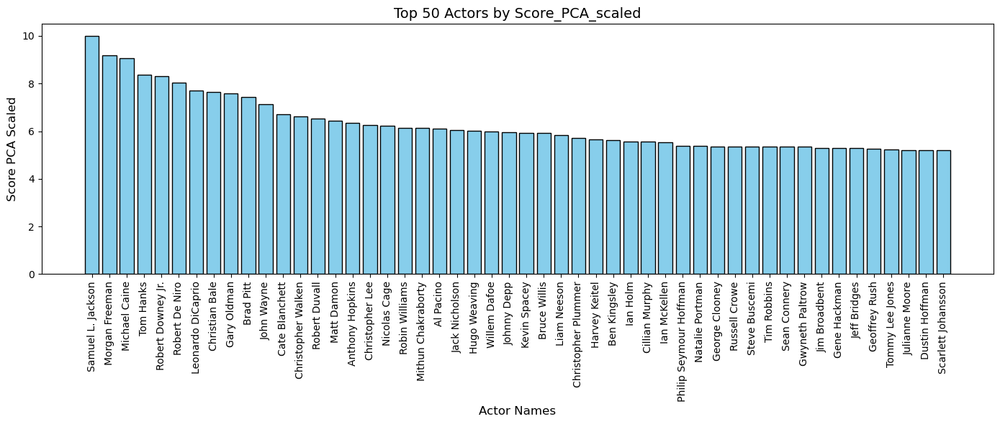

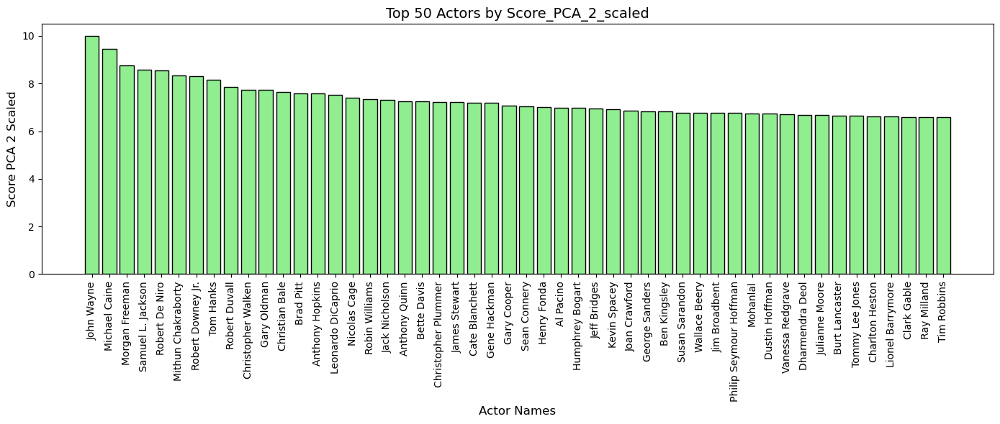

In [165]:
# Select the top 50 actors based on Score_PCA_scaled
top_50_pca_scaled = result_grouped.nlargest(50, 'Score_PCA_scaled')

# Plot for 'Score_PCA_scaled'
plt.figure(figsize=(14, 6))
plt.bar(top_50_pca_scaled['ActorName'], top_50_pca_scaled['Score_PCA_scaled'], color='skyblue', edgecolor='black')
plt.title('Top 50 Actors by Score_PCA_scaled', fontsize=14)
plt.xlabel('Actor Names', fontsize=12)
plt.ylabel('Score PCA Scaled', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout()
plt.show()

# Select the top 50 actors based on Score_PCA_2_scaled
top_50_pca_2_scaled = result_grouped.nlargest(50, 'Score_PCA_2_scaled')

# Plot for 'Score_PCA_2_scaled'
plt.figure(figsize=(14, 6))
plt.bar(top_50_pca_2_scaled['ActorName'], top_50_pca_2_scaled['Score_PCA_2_scaled'], color='lightgreen', edgecolor='black')
plt.title('Top 50 Actors by Score_PCA_2_scaled', fontsize=14)
plt.xlabel('Actor Names', fontsize=12)
plt.ylabel('Score PCA 2 Scaled', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.tight_layout()
plt.show()


In [123]:
result_grouped

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,year_ceremony,Oscar,NumMovies,AvgRating,TotalVotes,OscarEncoded,Score_PCA,Score_PCA_2,Score_PCA_scaled,Score_PCA_2_scaled
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,nothing,1,5.700000,933.0,0.0,-0.514894,-0.312869,0.162052,1.007000
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,nothing,1,6.000000,11281.0,0.0,-0.462133,-0.207589,0.175710,1.072612
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,nothing,3,4.366667,8618.0,0.0,-0.461902,-0.675504,0.175769,0.781002
3,'Kecske' Molnár Levente,None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],...,NaN,nothing,1,6.900000,1173.0,0.0,-0.355048,0.099682,0.203429,1.264107
4,'King Kong' Kashey,1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],...,NaN,nothing,1,4.500000,286.0,0.0,-0.675247,-0.725506,0.120545,0.749840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],...,NaN,nothing,1,6.400000,77.0,0.0,-0.422890,-0.072421,0.185868,1.156850
119223,關淑怡,1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]",...,NaN,nothing,2,6.300000,35414.0,0.0,-0.281869,-0.052390,0.222372,1.169334
119224,陳文媛,1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],...,NaN,nothing,1,3.000000,387.0,0.0,-0.874555,-1.241112,0.068953,0.428509
119225,陳曉東,1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]",...,NaN,nothing,2,5.800000,1404.0,0.0,-0.390659,-0.231346,0.194211,1.057807


In [167]:
# Function to flatten the list, split on commas, and exclude invalid values
def flatten_and_get_top_3(values_list):
    # Ensure that the input is not NaN or empty
    if values_list is None or (isinstance(values_list, float) and np.isnan(values_list)):
        return None
    
    if isinstance(values_list, list):
        # Flatten the list by splitting elements containing commas
        flat_list = []
        for value in values_list:
            if isinstance(value, str):  # Ensure each element is a string
                flat_list.extend(value.split(','))  # Split on commas and extend the flat list
        
        # Clean up whitespace and remove invalid entries
        flat_list = [x.strip() for x in flat_list if x.strip() not in ['', ' ']]
        
        # Count frequencies and get the top 3 most common elements
        counter = Counter(flat_list)
        top_3 = [item for item, _ in counter.most_common(3)]
        return top_3
    return None



# Apply the function to the Countries column
result_grouped['top_3_countries'] = result_grouped['Countries'].apply(flatten_and_get_top_3)
result_grouped['top_3_genre'] = result_grouped['Genres'].apply(flatten_and_get_top_3)



In [168]:
print(result_grouped.query('ActorName == "Morgan Freeman"')[['top_3_countries','top_3_genre']])

                                   top_3_countries               top_3_genre
80874  [United States of America, Germany, France]  [Drama, Thriller, Crime]


In [169]:
result_grouped.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'Score_PCA_2_scaled', 'top_3_countries', 'top_3_genre',
       'socioeconomic_background', 'education_level',
       'early_life_opportunities', 'ActorHeight', 'Arched_Eyebrows',
       'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
       'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Straight_Hair', 'Wavy_Hair', 'professionCategory'],
      dtype='object')

In [ ]:
result_grouped

In [170]:
result_grouped.to_pickle('final_actors_19_12_2024.pkl')


In [ ]:
merged_movies.to_pickle('movies_dataset_yc_3.pkl')

---
---
## 2. Zaynab's part

Here we read the datasets. These are datasets that contain unique movies and unique actors.

In [9]:
data = pd.read_csv('data/actors_scores_15_12_2014_3.csv')
data.drop(columns=['Male'], inplace=True)
data


,ActorName,Movies,ReleaseDates,ActorDOB,ActorGender,Characters,Ratings,NumVotes,year_ceremony,Oscar,...,Narrow_Eyes,No_Beard,Oval_Face,Pale_Skin,Pointy_Nose,Receding_Hairline,Rosy_Cheeks,Sideburns,Straight_Hair,Wavy_Hair
0,'Big' Lee,"('23010798',)",['1973'],1939,M,['Junkie in Casino'],"(5.7,)","(939.0,)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,'Chicken' Holleman,"('1873017',)",['1972'],NaN,NaN,[nan],"(6.0,)","(11386.0,)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,'Evil' Ted Smith,"('tt7850334', 'tt0119116', 'tt16235342')",['1991'],NaN,NaN,['Ronnie'],"(4.0, 4.3, 4.9)","(850.0, 1576.0, 6239.0)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,'Kecske' Molnár Levente,"('31935934',)",['2010'],NaN,M,['Ovidiu'],"(6.9,)","(1181.0,)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,'King Kong' Kashey,"('24051101',)",['1943'],1903-11-28,M,"[""Paj Mab's Guard #2""]","(4.5,)","(286.0,)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121440,都はるみ,"('25896239',)",['1983'],1948-02-22,F,[nan],"(6.4,)","(77.0,)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121441,關淑怡,"('26669413', '184987')","['1992', '1997']",1966-08-15,F,"[nan, nan]","(7.7, 4.9)","(35355.0, 222.0)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121442,陳文媛,"('3059526',)",['2003'],1979-09-18,F,[nan],"(3.0,)","(387.0,)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121443,陳曉東,"('7055021', '34430625')","['1998', '2012']",1975-09-03,M,"[nan, nan]","(5.6, 6.1)","(133.0, 1276.0)",NaN,nothing,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
data['ActorHeight'] = data['ActorHeight'].replace(180, np.nan)
data['ActorHeight'] = data['ActorHeight'].replace(510, np.nan) 

In [11]:

cat_features = ['Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs',
                'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair',
                'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair',
                'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard',
                'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
                'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair', 
                'ActorGender', 'socioeconomic_background', 'education_level', 
                'early_life_opportunities']

col_withoutcelebA = ['ActorGender','socioeconomic_background',
       'education_level', 'early_life_opportunities',
       'Score_PCA_2_scaled', 'ActorHeight']

cat_features_withoutcelebA = ['ActorGender','socioeconomic_background',
       'education_level', 'early_life_opportunities',]

features_using = ['Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs',
                'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair',
                'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair',
                'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard',
                'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
                'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair', 
                'ActorGender', 'socioeconomic_background', 'education_level', 
                'early_life_opportunities', 'Score_PCA_2_scaled', 'ActorHeight']

In [12]:
data = data.dropna(subset=col_withoutcelebA)
data = data[features_using]
print(data.isna().sum()/data.shape[0])


Arched_Eyebrows             0.881616
Attractive                  0.881616
Bags_Under_Eyes             0.881616
Bald                        0.881616
Bangs                       0.881616
Big_Lips                    0.881616
Big_Nose                    0.881616
Black_Hair                  0.881616
Blond_Hair                  0.881616
Brown_Hair                  0.881616
Bushy_Eyebrows              0.881616
Chubby                      0.881616
Double_Chin                 0.881616
Goatee                      0.881616
Gray_Hair                   0.881616
High_Cheekbones             0.881616
Mustache                    0.881616
Narrow_Eyes                 0.881616
No_Beard                    0.881616
Oval_Face                   0.881616
Pale_Skin                   0.881616
Pointy_Nose                 0.881616
Receding_Hairline           0.881616
Rosy_Cheeks                 0.881616
Sideburns                   0.881616
Straight_Hair               0.881616
Wavy_Hair                   0.881616
A

### Plotting without clustering


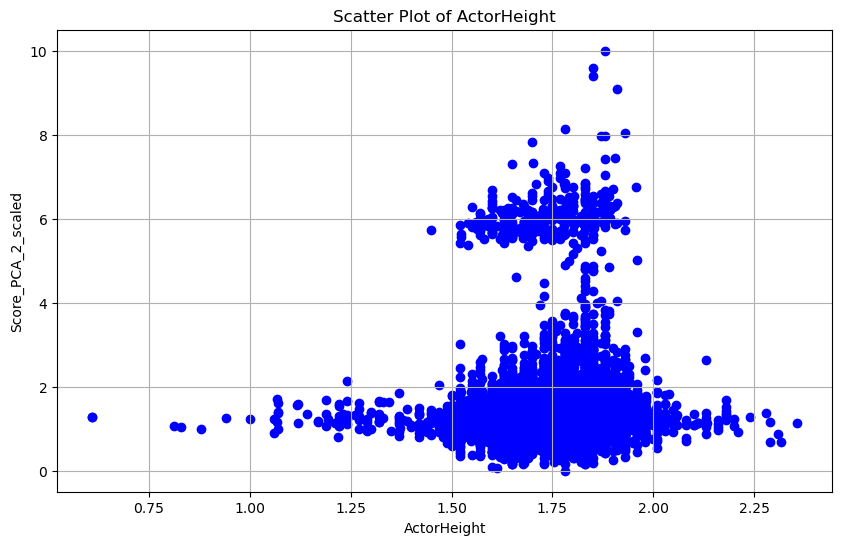

In [13]:
plt.figure(figsize=(10, 6))
plt.scatter(x=data['ActorHeight'], y=data['Score_PCA_2_scaled'], color='blue')
plt.title("Scatter Plot of ActorHeight")
plt.xlabel("ActorHeight")
plt.ylabel("Score_PCA_2_scaled")
plt.grid(True)
plt.show()

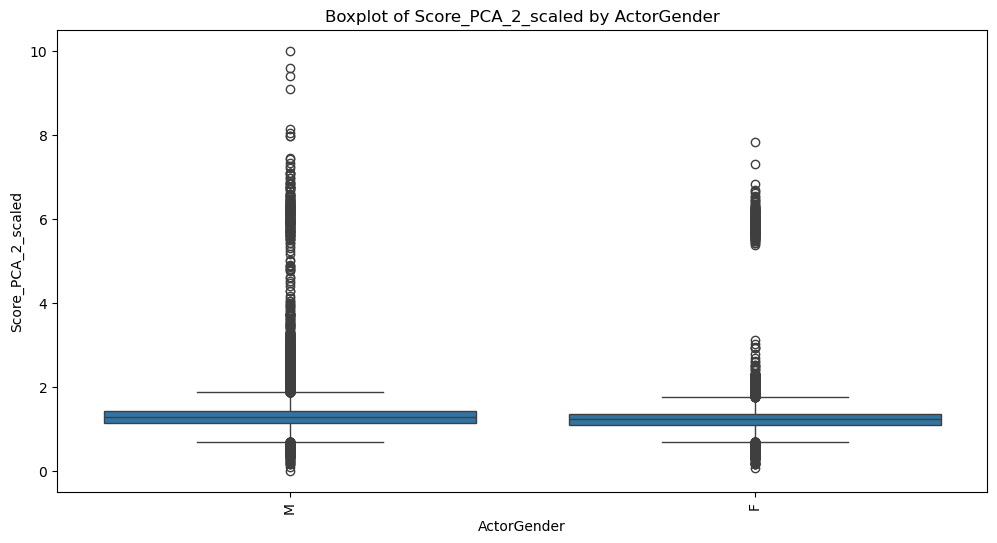

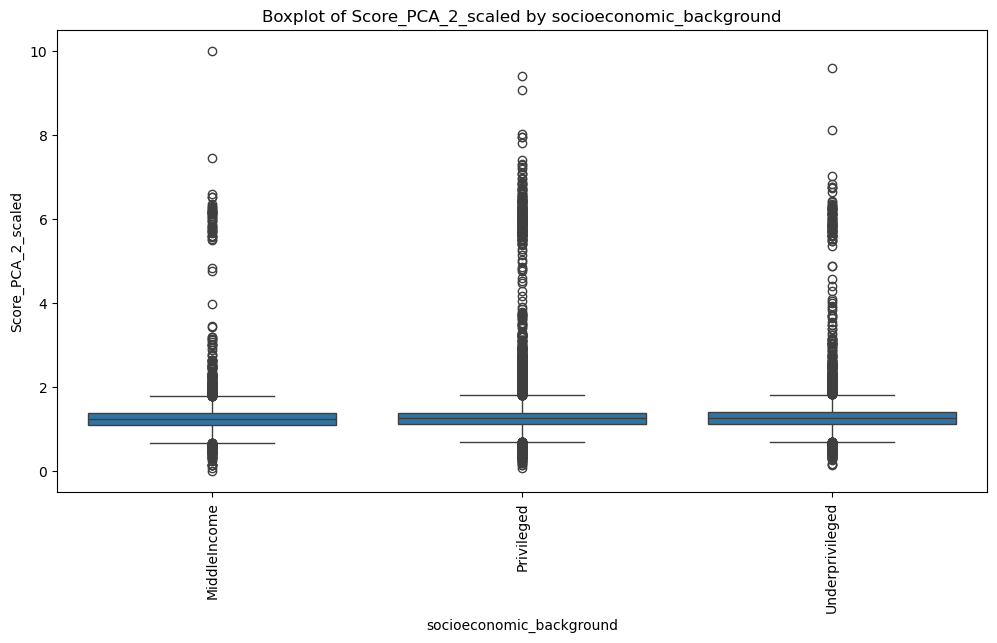

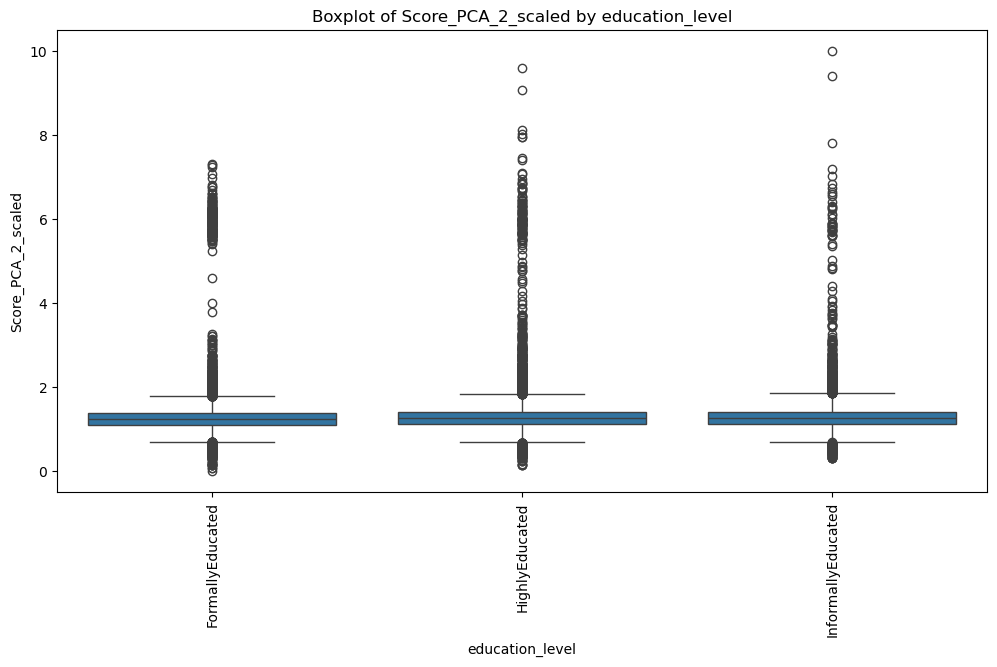

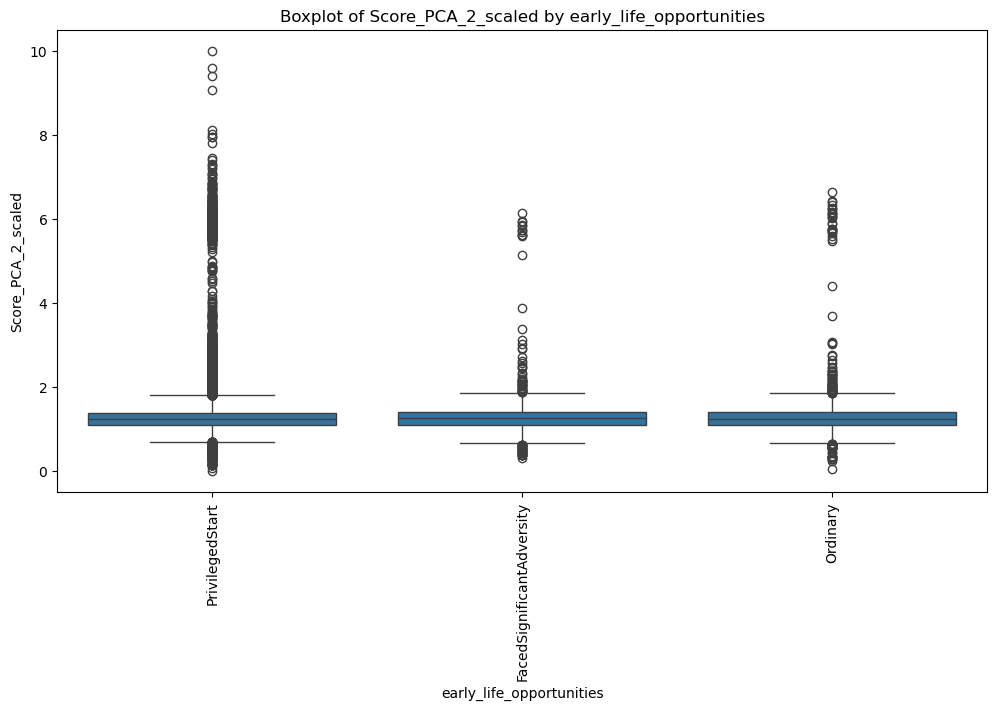

In [14]:
for feature in cat_features_withoutcelebA:
    plt.figure(figsize=(12, 6)) 
    try:
        sns.boxplot(data=data, x=feature, y='Score_PCA_2_scaled')
        plt.xlabel(feature)
        plt.ylabel('Score_PCA_2_scaled')
        plt.title(f"Boxplot of Score_PCA_2_scaled by {feature}")
        plt.xticks(rotation=90) 
        plt.show()
    except Exception as e:
        print(f"Could not plot boxplot for {feature}: {e}")

### Anova Test

In [15]:
data_anova = data.dropna()


In [16]:

for feature in cat_features:
    groups = [data_anova[data_anova[feature] == category]['Score_PCA_2_scaled'] 
              for category in data_anova[feature].unique()]
    f_stat, p_value = f_oneway(*groups)
    print(f"\n{feature}: F-statistic = {f_stat:.2f}, p-value = {p_value:.4f}")



Arched_Eyebrows: F-statistic = 31.25, p-value = 0.0000

Attractive: F-statistic = 71.19, p-value = 0.0000

Bags_Under_Eyes: F-statistic = 42.70, p-value = 0.0000

Bald: F-statistic = 25.05, p-value = 0.0000

Bangs: F-statistic = 14.95, p-value = 0.0001

Big_Lips: F-statistic = 39.61, p-value = 0.0000

Big_Nose: F-statistic = 40.26, p-value = 0.0000

Black_Hair: F-statistic = 22.05, p-value = 0.0000

Blond_Hair: F-statistic = 7.54, p-value = 0.0060

Brown_Hair: F-statistic = 6.15, p-value = 0.0132

Bushy_Eyebrows: F-statistic = 4.49, p-value = 0.0341

Chubby: F-statistic = 17.89, p-value = 0.0000

Double_Chin: F-statistic = 34.94, p-value = 0.0000

Goatee: F-statistic = 3.31, p-value = 0.0691

Gray_Hair: F-statistic = 131.00, p-value = 0.0000

High_Cheekbones: F-statistic = 0.18, p-value = 0.6682

Mustache: F-statistic = 1.80, p-value = 0.1800

Narrow_Eyes: F-statistic = 0.01, p-value = 0.9224

No_Beard: F-statistic = 7.40, p-value = 0.0065

Oval_Face: F-statistic = 2.05, p-value = 0.1

Here we can see that according the Anova test the features that influence the most the score are Attractive, Gray_Hair

### Clustering


Main challenge : cathegorical data K-means adapted to cathegorical data is Kmodes K-prototypes can handle both, haven't used it yet

They both can't handle Nan so I am only working with a litle subset -> dropping Nan
Elbow method to find optimal K - adapted for cathegorical data using Kmodes ( Huang initialisation / simple matching dissimilarity)
Elbow method usually uses sum of squares, here using cost because cath data.

If this method doesn't give sufficiently good results we will think about hot encoding.

In [25]:
random_subset = data[features_using].dropna()
random_subset_clust = random_subset[cat_features_withoutcelebA]
random_subset_clust

,ActorGender,socioeconomic_background,education_level,early_life_opportunities
99,F,Underprivileged,InformallyEducated,Ordinary
104,F,Privileged,HighlyEducated,PrivilegedStart
107,M,Privileged,HighlyEducated,PrivilegedStart
129,M,Underprivileged,FormallyEducated,Ordinary
183,M,Underprivileged,InformallyEducated,PrivilegedStart
...,...,...,...,...
121016,F,Privileged,HighlyEducated,PrivilegedStart
121090,F,MiddleIncome,FormallyEducated,Ordinary
121103,M,Privileged,FormallyEducated,PrivilegedStart
121157,F,Underprivileged,FormallyEducated,PrivilegedStart


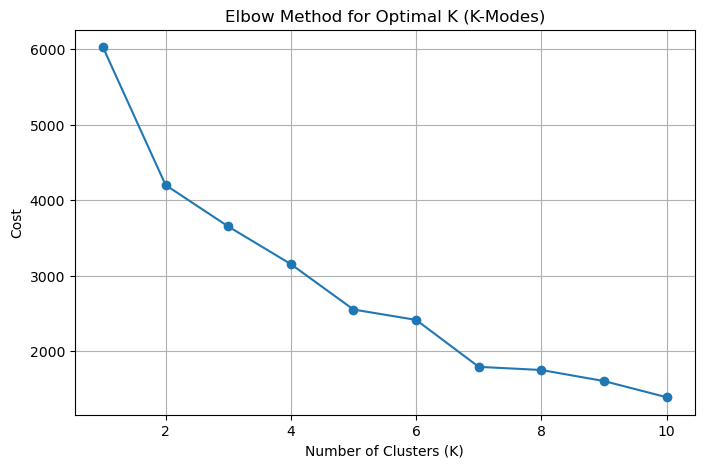

In [26]:
#Elbow
cost = []
K_values = range(1, 11) 

for K in K_values:
    km = KModes(n_clusters=K, init="Huang", n_init=5, random_state=42)
    km.fit(random_subset_clust)
    cost.append(km.cost_)

plt.figure(figsize=(8, 5))
plt.plot(K_values, cost, marker="o")
plt.title("Elbow Method for Optimal K (K-Modes)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Cost")
plt.grid(True)
plt.show()


Clustering  with optimal K = 2

In [27]:
kmodes = KModes(n_clusters=2, init='Cao', random_state=42)
clusters = kmodes.fit_predict(random_subset_clust)

random_subset.loc[random_subset.index, 'Cluster'] = clusters

print(random_subset['Cluster'].value_counts())

Cluster
0.0    2791
1.0    1148
Name: count, dtype: int64


In [29]:
print('The data s mean score is :',random_subset['Score_PCA_2_scaled'].mean())


The data s mean score is : 1.5145404495355765


In [30]:
mean_score_by_cluster = random_subset.groupby('Cluster')['Score_PCA_2_scaled'].describe()
print("Score by Cluster desciption:")
print(mean_score_by_cluster)

Score by Cluster desciption:
          count      mean       std       min       25%       50%       75%  \
Cluster                                                                       
0.0      2791.0  1.490792  0.890863  0.217400  1.138370  1.308346  1.522207   
1.0      1148.0  1.572276  0.852111  0.260752  1.200395  1.374186  1.648089   

              max  
Cluster            
0.0      7.815470  
1.0      9.077111  


We can see that the second group is more sucessful than the first one

## Plotting height

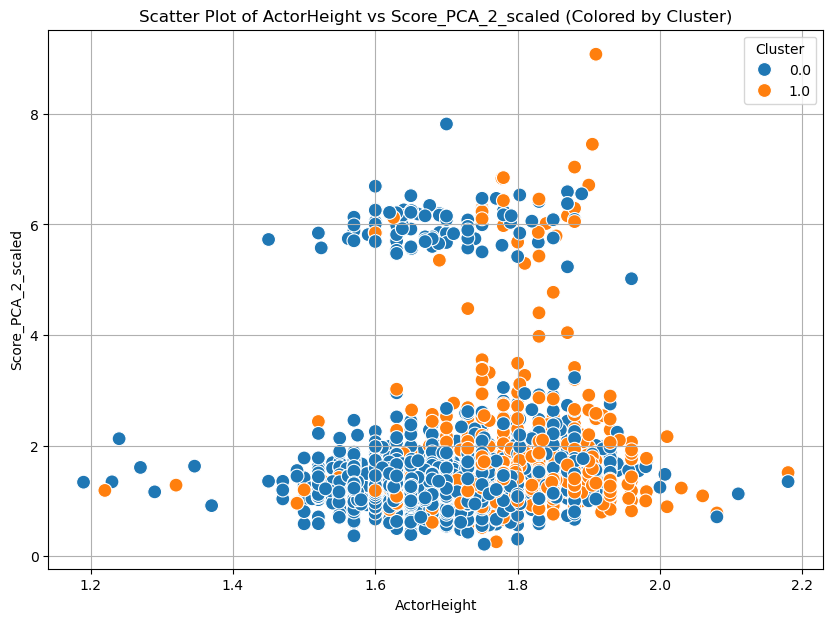

In [31]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=random_subset, x='ActorHeight', y='Score_PCA_2_scaled'   , hue='Cluster', palette='tab10', s=100)
plt.title(f"Scatter Plot of {'ActorHeight'} vs {'Score_PCA_2_scaled'} (Colored by Cluster)")
plt.xlabel('ActorHeight')
plt.ylabel('Score_PCA_2_scaled')
plt.legend(title="Cluster")
plt.grid(True)
plt.show()

### plotting other features

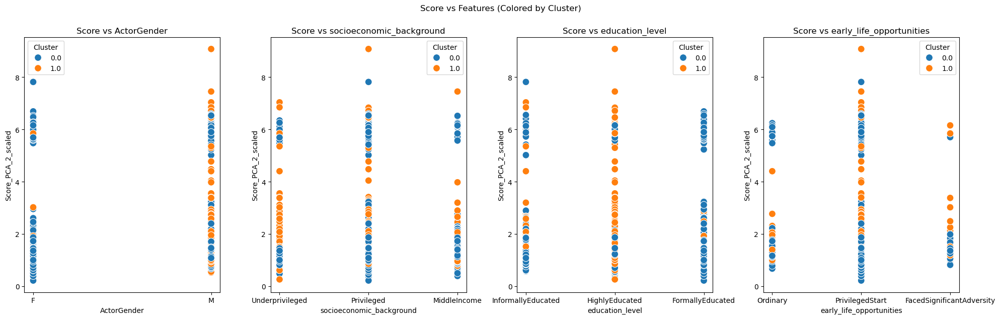

In [32]:
features = ['ActorGender', 'socioeconomic_background', 'education_level', 'early_life_opportunities'] 
score_column = 'Score_PCA_2_scaled' 

fig, axes = plt.subplots(1, len(features), figsize=(20, 6)) 
axes = axes.flatten()

for i, feature in enumerate(features):
    sns.scatterplot(ax=axes[i], 
                    x=random_subset[feature], 
                    y=random_subset[score_column], 
                    hue=random_subset['Cluster'], 
                    palette='tab10', 
                    s=100)
    axes[i].set_title(f"Score vs {feature}")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(score_column)
    axes[i].legend(title="Cluster")

plt.tight_layout()
plt.suptitle("Score vs Features (Colored by Cluster)", y=1.05)
plt.show()

Gender influence on height with Kmodes

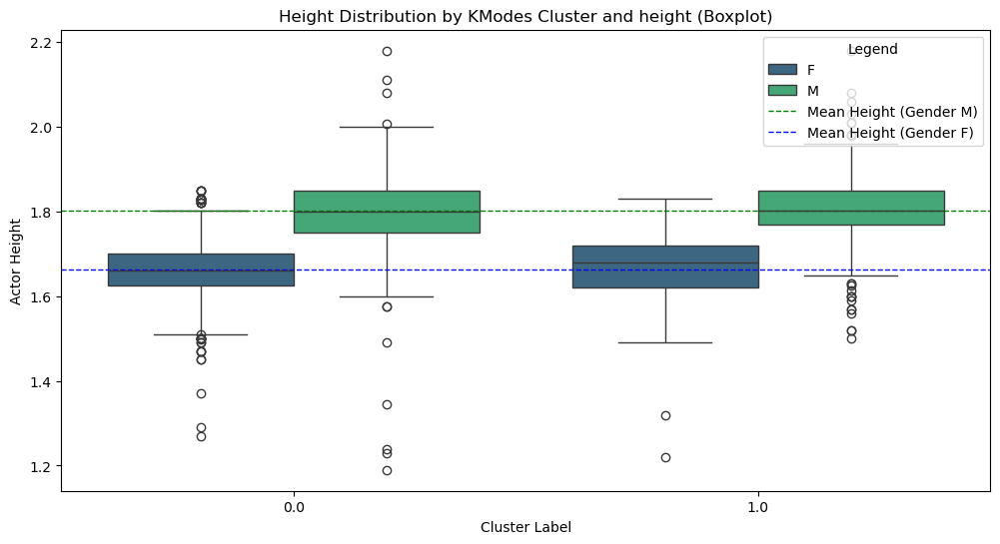

In [33]:
mean_height_gender_0 = random_subset[random_subset['ActorGender'] == 'M']['ActorHeight'].mean()
mean_height_gender_1 = random_subset[random_subset['ActorGender'] == 'F']['ActorHeight'].mean()

plt.figure(figsize=(12, 6))
sns.boxplot(data=random_subset, x='Cluster', y='ActorHeight', hue='ActorGender', palette='viridis')

plt.axhline(mean_height_gender_0, color='green', linestyle='--', linewidth=1, label='Mean Height (Gender M)')
plt.axhline(mean_height_gender_1, color='blue', linestyle='--', linewidth=1, label='Mean Height (Gender F)')

plt.title("Height Distribution by KModes Cluster and height (Boxplot)")
plt.xlabel("Cluster Label")
plt.ylabel("Actor Height")
plt.legend(title="Legend", loc='upper right')
plt.show()

### Feature importance - after clustering
This gives an idea on how the feature influenced the clustering

In [36]:
X = random_subset.drop(columns=['Cluster', 'Score_PCA_2_scaled']).dropna() 
y = random_subset['Cluster'].dropna() 

X_encoded = pd.get_dummies(X, drop_first=True)

rf = RandomForestClassifier(random_state=42)
rf.fit(X_encoded, y)

feature_importances = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances)

Feature Importances:
                                     Feature  Importance
31            education_level_HighlyEducated    0.265176
28                             ActorGender_M    0.188173
30  socioeconomic_background_Underprivileged    0.152185
27                               ActorHeight    0.088542
29       socioeconomic_background_Privileged    0.066883
18                                  No_Beard    0.030446
32        education_level_InformallyEducated    0.026273
1                                 Attractive    0.015902
6                                   Big_Nose    0.013738
0                            Arched_Eyebrows    0.011324
26                                 Wavy_Hair    0.009497
15                           High_Cheekbones    0.008815
2                            Bags_Under_Eyes    0.007734
10                            Bushy_Eyebrows    0.007693
8                                 Blond_Hair    0.007529
21                               Pointy_Nose    0.007122
19        

Let's visualize that

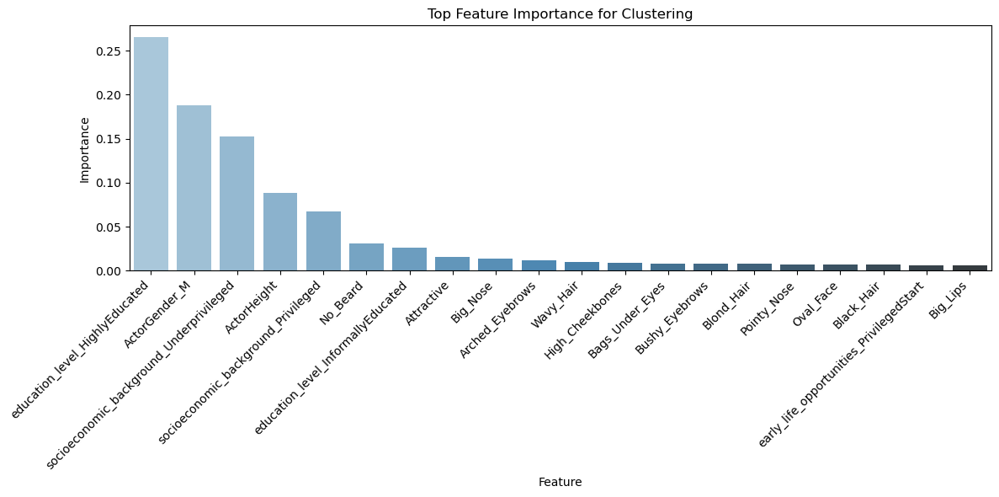

In [37]:
feature_importance = feature_importances.sort_values(by='Importance', ascending=False)
top_features = feature_importance.head(20)

plt.figure(figsize=(12, 6)) 
sns.barplot(
    x='Feature', 
    y='Importance', 
    data=top_features, 
    palette='Blues_d'
)

plt.xticks(rotation=45, ha='right', fontsize=10)

plt.title("Top Feature Importance for Clustering")
plt.xlabel("Feature")
plt.ylabel("Importance")

plt.tight_layout()  
plt.show()

### Playing around with heatmaps


without clusters


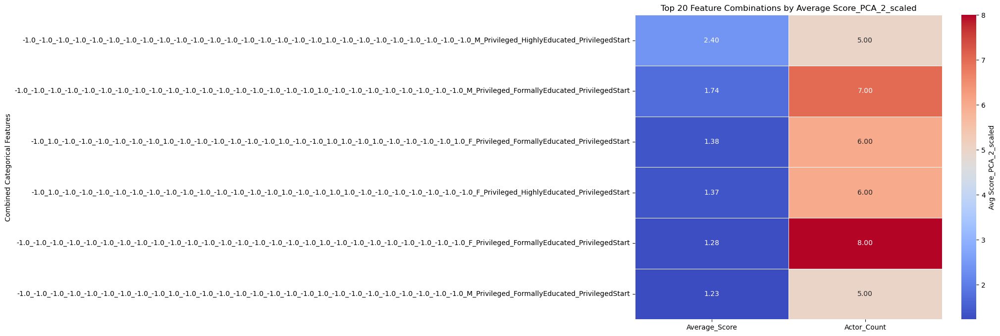

In [53]:
random_subset['Combined_Features'] = random_subset[cat_features].astype(str).agg('_'.join, axis=1)

grouped_avg_score = (
    random_subset
    .groupby('Combined_Features', as_index=False)
    .agg(
        Average_Score=('Score_PCA_2_scaled', 'mean'),
        Actor_Count=('Combined_Features', 'size') 
    )
)

grouped_avg_score = grouped_avg_score[grouped_avg_score['Actor_Count'] >= 5]

grouped_avg_score = grouped_avg_score.sort_values(by='Average_Score', ascending=False)

top_combos = grouped_avg_score.nlargest(20, 'Average_Score')

plt.figure(figsize=(10, 8))
sns.heatmap(top_combos.set_index('Combined_Features'), 
            annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5,
            cbar_kws={'label': 'Avg Score_PCA_2_scaled'})

plt.title(f"Top {20} Feature Combinations by Average Score_PCA_2_scaled")
plt.xlabel("")
plt.ylabel("Combined Categorical Features")
plt.tight_layout()
plt.show()

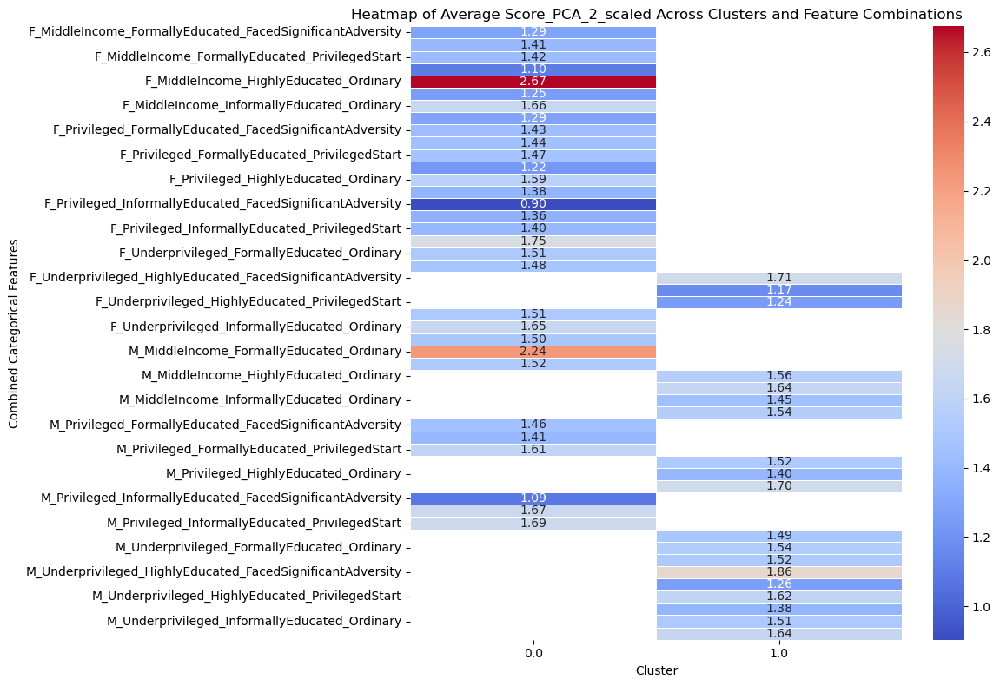

In [38]:

random_subset['Combined_Features'] = random_subset['ActorGender'].astype(str) + "_" + \
                          random_subset['socioeconomic_background'].astype(str) + "_" + \
                          random_subset['education_level'].astype(str) + "_" + \
                          random_subset['early_life_opportunities'].astype(str)

grouped_avg_score = random_subset.groupby(['Combined_Features', 'Cluster'])['Score_PCA_2_scaled'].mean().reset_index()

pivot_avg_score = grouped_avg_score.pivot(index='Combined_Features', columns='Cluster', values='Score_PCA_2_scaled')

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_avg_score, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

plt.title("Heatmap of Average Score_PCA_2_scaled Across Clusters and Feature Combinations")
plt.xlabel("Cluster")
plt.ylabel("Combined Categorical Features")
plt.tight_layout()
plt.show()

In [40]:
split_features = grouped_avg_score['Combined_Features'].str.split('_', expand=True)

split_features.columns = cat_features

final_df = pd.concat([split_features, grouped_avg_score['Average_Score'], grouped_avg_score['Actor_Count']], axis=1)

final_df = final_df.sort_values(by='Average_Score', ascending=True)

final_df

,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,Brown_Hair,...,Rosy_Cheeks,Sideburns,Straight_Hair,Wavy_Hair,ActorGender,socioeconomic_background,education_level,early_life_opportunities,Average_Score,Actor_Count
251,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,...,-1.0,-1.0,-1.0,-1.0,M,Privileged,FormallyEducated,PrivilegedStart,1.232221,5
20,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,F,Privileged,FormallyEducated,PrivilegedStart,1.276031,8
1674,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,F,Privileged,HighlyEducated,PrivilegedStart,1.368368,6
2006,-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,F,Privileged,FormallyEducated,PrivilegedStart,1.380779,6
29,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,M,Privileged,FormallyEducated,PrivilegedStart,1.738754,7
31,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,-1.0,M,Privileged,HighlyEducated,PrivilegedStart,2.403429,5


In [41]:

top_3_combinations = final_df.nlargest(3, 'Average_Score')

bottom_3_combinations = final_df.nsmallest(3, 'Average_Score')

In [42]:
binary_features = ['Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs',
                   'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair',
                   'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair',
                   'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard',
                   'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
                   'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair']

descriptive_features = ['ActorGender', 'socioeconomic_background', 'education_level', 'early_life_opportunities']

In [43]:
top_3_combinations[binary_features] = top_3_combinations[binary_features].astype(float)

for i in range(3):
    actor = top_3_combinations.iloc[i]
    
    successful_attributes = [feature for feature in binary_features if actor[feature] == 1]
    
    successful_descriptions = {feature: actor[feature] for feature in descriptive_features}
    
    print(f"\nTop {i+1} Successful Actor:")
    print("The most successful actors have:")
    if successful_attributes:
        print(", ".join(successful_attributes) + ".")
    else:
        print("No binary attributes equal to 1.")
    print(f"They are {successful_descriptions['ActorGender']}, "
          f"come from a {successful_descriptions['socioeconomic_background']} background, "
          f"have an education level of {successful_descriptions['education_level']}, "
          f"and had {successful_descriptions['early_life_opportunities']}.")


Top 1 Successful Actor:
The most successful actors have:
No_Beard.
They are M, come from a Privileged background, have an education level of HighlyEducated, and had PrivilegedStart.

Top 2 Successful Actor:
The most successful actors have:
No_Beard.
They are M, come from a Privileged background, have an education level of FormallyEducated, and had PrivilegedStart.

Top 3 Successful Actor:
The most successful actors have:
Attractive, Blond_Hair, High_Cheekbones, No_Beard, Oval_Face, Pointy_Nose, Wavy_Hair.
They are F, come from a Privileged background, have an education level of FormallyEducated, and had PrivilegedStart.


## Using hot encoding

Using the dataset hot encoded (done in the previous parts)

In [45]:
hot_encoded = pd.read_pickle('data/final_actors_19_12_2024_2.pkl')


In [46]:
hot_encoded

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Sideburns,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,NaN,NaN,ActingOcc,0.0,1,1,0,116.000000,1
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,NaN,NaN,ActingOcc,NaN,2,1,1,88.000000,1
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,NaN,NaN,otherOcc,NaN,2,2,2,91.333333,0
3,'Kecske' Molnár Levente,None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],...,NaN,NaN,NaN,ActingOcc,0.0,1,1,2,100.000000,1
4,'King Kong' Kashey,1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],...,NaN,NaN,NaN,ActingOcc,0.0,0,2,2,43.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],...,NaN,NaN,NaN,ActingOcc,1.0,2,1,2,101.000000,1
119223,關淑怡,1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]",...,NaN,NaN,NaN,ActingOcc,1.0,2,2,2,90.000000,1
119224,陳文媛,1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],...,NaN,NaN,NaN,ActingOcc,1.0,2,0,2,90.000000,1
119225,陳曉東,1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]",...,NaN,NaN,NaN,ActingOcc,0.0,0,2,2,118.500000,1


In [47]:
hot_encoded2 = hot_encoded[['ActorGender', 'ActorHeight', 'Arched_Eyebrows',
       'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
       'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Straight_Hair', 'Wavy_Hair',
       'socioeconomic_background_encoded', 'education_level_encoded',
       'early_life_opportunities_encoded', 'AvgRuntime',
       'professionCategory_encoded', 'Score_PCA_2_scaled']]

In [48]:
hot_encoded2 = hot_encoded2.replace({'M': 0, 'F': 1})


In [49]:
hot_encoded2=hot_encoded2.dropna()


Finding optimal K - silhouette and elbow

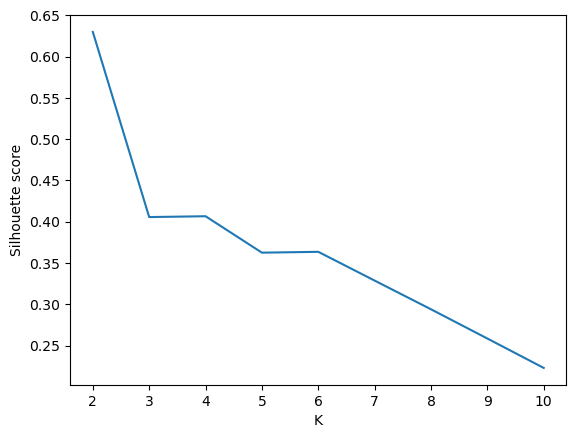

In [52]:
silhouettes = []
X = hot_encoded2.drop(columns=['Score_PCA_2_scaled'])

for k in range(2, 11):
    labels = KMeans(n_clusters=k, random_state=10).fit_predict(X)
    score = silhouette_score(X, labels)
    silhouettes.append({"k": k, "score": score})
    
silhouettes = pd.DataFrame(silhouettes)

plt.plot(silhouettes.k, silhouettes.score)
plt.xlabel("K")
plt.ylabel("Silhouette score")
plt.show()

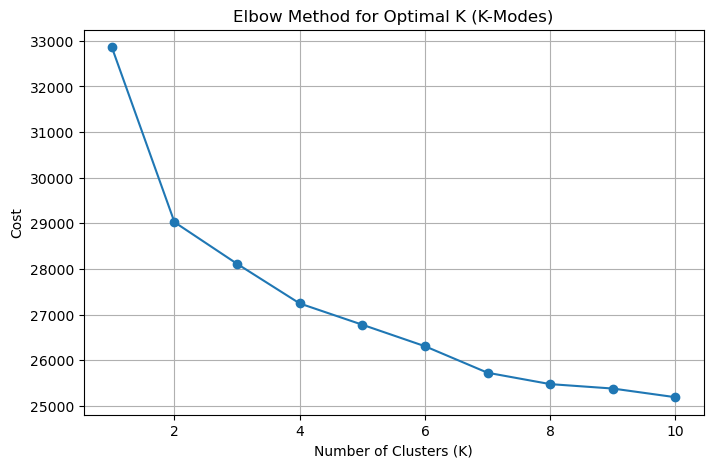

In [54]:
cost = []
K_values = range(1, 11)  

for K in K_values:
    km = KModes(n_clusters=K, init="Huang", n_init=5, random_state=42)
    km.fit(X)
    cost.append(km.cost_)

plt.figure(figsize=(8, 5))
plt.plot(K_values, cost, marker="o")
plt.title("Elbow Method for Optimal K (K-Modes)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Cost")
plt.grid(True)
plt.show()

Clustering with K = 2, given by the two methods

In [59]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)
pd.DataFrame(scaled_data)

,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,33
0,0.926260,-0.765298,1.796694,1.006413,-0.534479,-0.180952,-0.440680,-0.479855,-0.607781,1.812093,...,3.215001,-0.273397,-0.266308,-0.478645,1.365724,-1.522271,-1.749041,-1.813022,-0.310566,-0.288235
1,0.926260,-0.963897,1.796694,1.006413,-0.534479,-0.180952,-0.440680,-0.479855,1.645329,1.812093,...,-0.311042,-0.273397,-0.266308,-0.478645,1.365724,0.826753,1.272381,0.406993,2.674584,3.469390
2,-1.079611,-0.467400,-0.556578,-0.993628,1.870982,-0.180952,-0.440680,-0.479855,1.645329,1.812093,...,-0.311042,-0.273397,3.755048,2.089230,-0.732212,0.826753,1.272381,0.406993,3.047728,-0.288235
3,-1.079611,1.022093,1.796694,-0.993628,-0.534479,-0.180952,2.269223,-0.479855,-0.607781,-0.551848,...,-0.311042,-0.273397,-0.266308,2.089230,-0.732212,-1.522271,-0.238330,-1.813022,-0.315748,-0.288235
4,-1.079611,0.029098,-0.556578,1.006413,-0.534479,-0.180952,-0.440680,-0.479855,-0.607781,-0.551848,...,3.215001,-0.273397,-0.266308,2.089230,-0.732212,-1.522271,-1.749041,0.406993,0.477182,-0.288235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3906,0.926260,-0.268801,1.796694,1.006413,-0.534479,-0.180952,-0.440680,-0.479855,-0.607781,1.812093,...,-0.311042,-0.273397,-0.266308,-0.478645,1.365724,0.826753,1.272381,0.406993,0.089687,-0.288235
3907,0.926260,-0.665999,-0.556578,-0.993628,-0.534479,-0.180952,2.269223,-0.479855,-0.607781,-0.551848,...,-0.311042,-0.273397,-0.266308,-0.478645,-0.732212,-0.347759,-0.238330,-1.813022,-0.328808,-0.288235
3908,-1.079611,0.525595,-0.556578,-0.993628,-0.534479,-0.180952,-0.440680,-0.479855,-0.607781,1.812093,...,-0.311042,-0.273397,-0.266308,2.089230,-0.732212,0.826753,-0.238330,0.406993,-0.393486,-0.288235
3909,0.926260,-0.765298,1.796694,1.006413,-0.534479,-0.180952,-0.440680,2.083962,-0.607781,-0.551848,...,-0.311042,-0.273397,-0.266308,-0.478645,1.365724,-1.522271,-0.238330,0.406993,-0.331296,-0.288235


In [60]:
n_clusters = 2  
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

hot_encoded2['Cluster'] = clusters


print("\nCluster Sizes:")
print(hot_encoded2['Cluster'].value_counts())


Cluster Sizes:
Cluster
0    2174
1    1737
Name: count, dtype: int64


In [61]:
X = hot_encoded2.drop(columns=['Cluster', 'Score_PCA_2_scaled']).dropna() 
y = hot_encoded2['Cluster'].dropna() 

X_encoded = pd.get_dummies(X, drop_first=True)

rf = RandomForestClassifier(random_state=42)
rf.fit(X_encoded, y)

feature_importances = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:")
feature_importances

Feature Importances:


,Feature,Importance
0,ActorGender,0.402101
1,ActorHeight,0.186018
20,No_Beard,0.077303
3,Attractive,0.039002
8,Big_Nose,0.038806
28,Wavy_Hair,0.031902
2,Arched_Eyebrows,0.031613
4,Bags_Under_Eyes,0.026047
32,AvgRuntime,0.019700
17,High_Cheekbones,0.016752


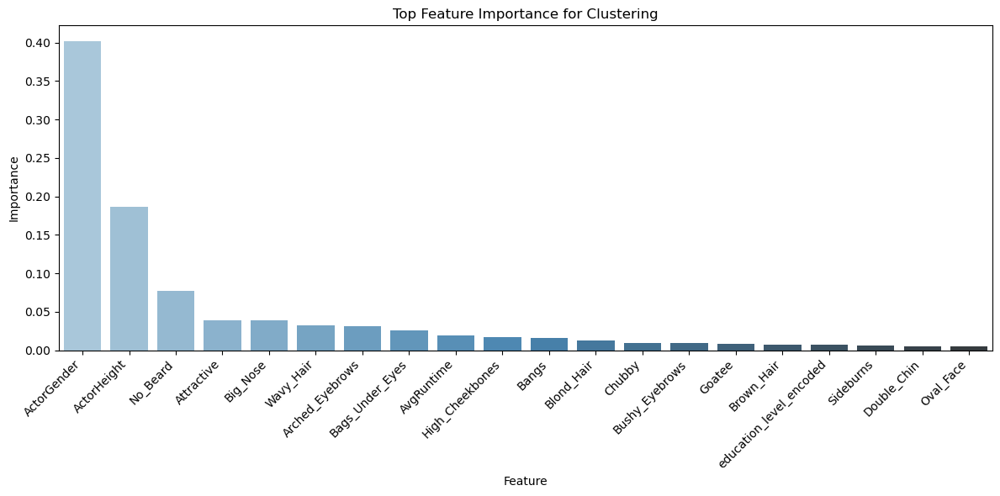

In [62]:
feature_importance = feature_importances.sort_values(by='Importance', ascending=False)

top_features = feature_importance.head(20)

plt.figure(figsize=(12, 6))  
sns.barplot(
    x='Feature', 
    y='Importance', 
    data=top_features, 
    palette='Blues_d'
)

plt.xticks(rotation=45, ha='right', fontsize=10)

plt.title("Top Feature Importance for Clustering")
plt.xlabel("Feature")
plt.ylabel("Importance")

plt.tight_layout() 
plt.show()

In [63]:
hot_encoded2['Score_PCA_2_scaled'].mean()


1.7579083101208848

In [64]:
mean_score_by_cluster = hot_encoded2.groupby('Cluster')['Score_PCA_2_scaled'].describe()
print("Mean Score by Cluster:")
print(mean_score_by_cluster)


Mean Score by Cluster:
          count      mean       std       min       25%       50%       75%  \
Cluster                                                                       
0        2174.0  1.627316  0.980409  0.206925  1.136065  1.331694  1.674605   
1        1737.0  1.921355  1.154555  0.330850  1.218616  1.521838  2.151902   

              max  
Cluster            
0        7.243004  
1        7.732999  


The cluster 2 behaves better in terms of success

Let's see if our analysis give better results with hot encoding

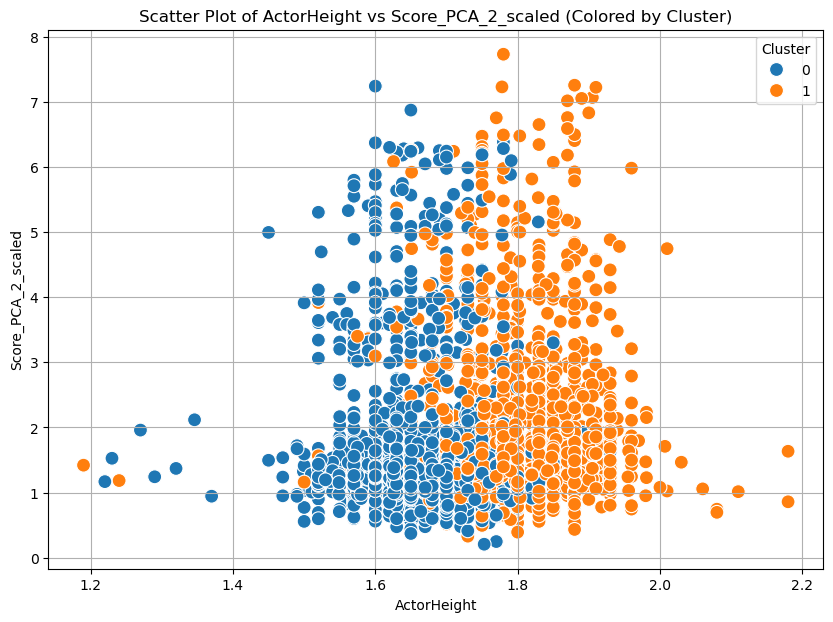

In [65]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=hot_encoded2, x='ActorHeight', y='Score_PCA_2_scaled', hue='Cluster', palette='tab10', s=100)
plt.title(f"Scatter Plot of {'ActorHeight'} vs {'Score_PCA_2_scaled'} (Colored by Cluster)")
plt.xlabel('ActorHeight')
plt.ylabel('Score_PCA_2_scaled')
plt.legend(title="Cluster")
plt.grid(True)
plt.show()

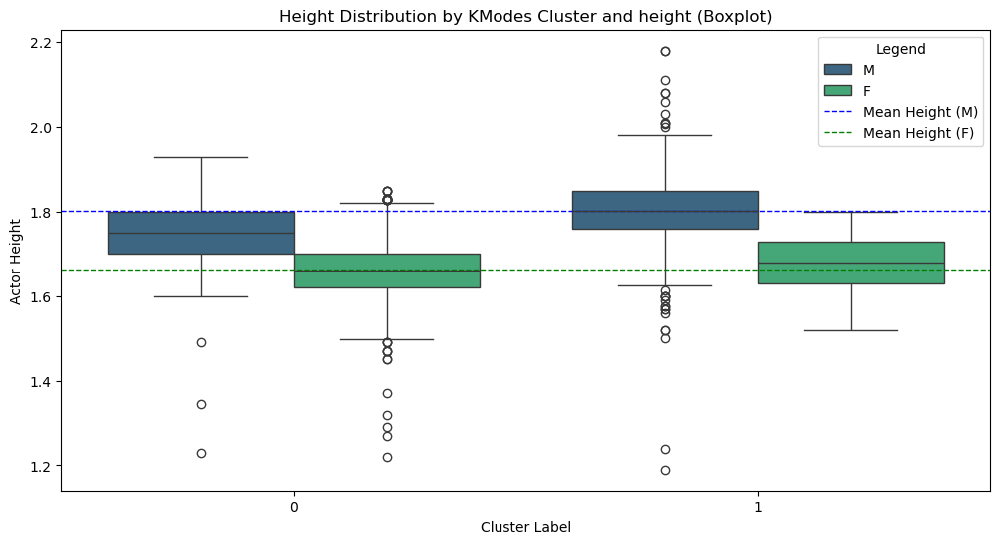

In [66]:
mean_height_gender_0 = hot_encoded2[hot_encoded2['ActorGender'] == 0]['ActorHeight'].mean()
mean_height_gender_1 = hot_encoded2[hot_encoded2['ActorGender'] == 1]['ActorHeight'].mean()

plt.figure(figsize=(12, 6))
sns.boxplot(data=hot_encoded2, x='Cluster', y='ActorHeight', hue='ActorGender', palette='viridis')

plt.axhline(mean_height_gender_0, color='blue', linestyle='--', linewidth=1, label='Mean Height (Gender M)')
plt.axhline(mean_height_gender_1, color='green', linestyle='--', linewidth=1, label='Mean Height (Gender F)')

handles, labels = plt.gca().get_legend_handles_labels()
gender_map = {'0.0': 'M', '1.0': 'F', 'Mean Height (Gender M)': 'Mean Height (M)', 'Mean Height (Gender F)': 'Mean Height (F)'}
labels = [gender_map[label] if label in gender_map else label for label in labels]
plt.legend(handles, labels, title="Legend", loc='upper right')

plt.title("Height Distribution by KModes Cluster and height (Boxplot)")
plt.xlabel("Cluster Label")
plt.ylabel("Actor Height")
plt.show()

Plotting gender proportions

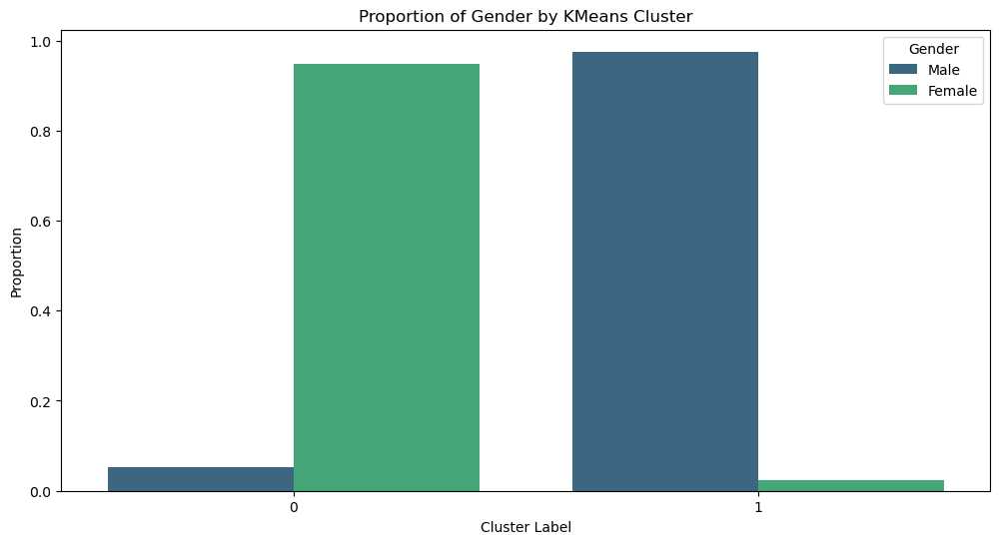

In [67]:
gender_cluster_proportions = (
    hot_encoded2.groupby(['Cluster', 'ActorGender'])
    .size()
    .reset_index(name='Count')
)
gender_cluster_proportions['Proportion'] = (
    gender_cluster_proportions.groupby('Cluster')['Count'].transform(lambda x: x / x.sum())
)

gender_cluster_proportions['ActorGender'] = gender_cluster_proportions['ActorGender'].map({0: 'Male', 1: 'Female'})

plt.figure(figsize=(12, 6))
sns.barplot(
    data=gender_cluster_proportions,
    x='Cluster',
    y='Proportion',
    hue='ActorGender',
    palette='viridis'
)

plt.title("Proportion of Gender by KMeans Cluster")
plt.xlabel("Cluster Label")
plt.ylabel("Proportion")
plt.legend(title="Gender")
plt.show()

## Age Analysis

In [68]:

df_cleaned = hot_encoded[hot_encoded["ActorAgeAtRelease"].apply(lambda x: not (len(x) == 1 and pd.isna(x[0])))]
df_cleaned["ActorAgeAtRelease"]


4                                                    [39.0]
10                                                   [35.0]
11                                                   [29.0]
12        [33.0, 36.0, 30.0, 34.0, 33.0, 36.0, 36.0, 35....
14        [47.0, 60.0, 60.0, 47.0, 55.0, 40.0, 51.0, 59....
                                ...                        
119222                                               [35.0]
119223                                         [26.0, 30.0]
119224                                               [23.0]
119225                                         [22.0, 36.0]
119226                                   [43.0, 39.0, 24.0]
Name: ActorAgeAtRelease, Length: 62743, dtype: object

Moyenne des âges : 44.78
Médiane des âges : 44.00
Écart-type des âges : 14.34


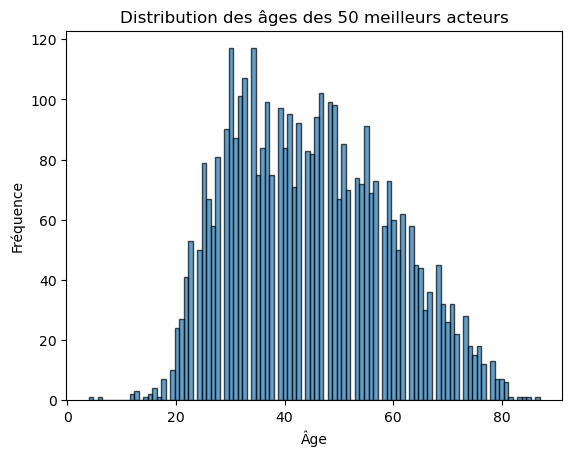

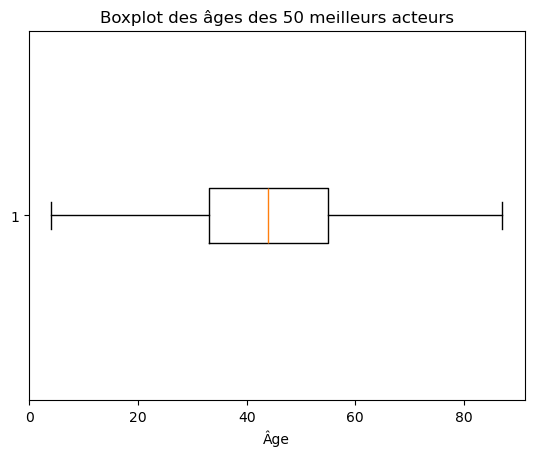

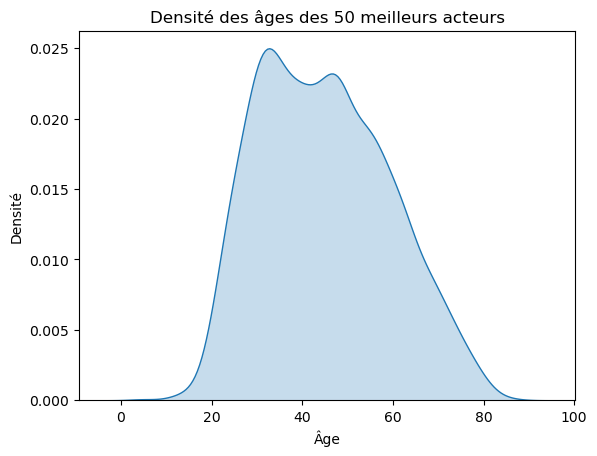

In [69]:
top_actors = df_cleaned.nlargest(50, "Score_PCA_2_scaled")

ages = top_actors["ActorAgeAtRelease"].explode()  
ages = ages.dropna().astype(float) 

mean_age = ages.mean()
median_age = ages.median()
std_age = ages.std()
print(f"Moyenne des âges : {mean_age:.2f}")
print(f"Médiane des âges : {median_age:.2f}")
print(f"Écart-type des âges : {std_age:.2f}")

plt.hist(ages, bins=100, edgecolor='k', alpha=0.7)
plt.title("Distribution des âges des 50 meilleurs acteurs")
plt.xlabel("Âge")
plt.ylabel("Fréquence")
plt.show()

plt.boxplot(ages, vert=False)
plt.title("Boxplot des âges des 50 meilleurs acteurs")
plt.xlabel("Âge")
plt.show()

import seaborn as sns
sns.kdeplot(ages, shade=True)
plt.title("Densité des âges des 50 meilleurs acteurs")
plt.xlabel("Âge")
plt.ylabel("Densité")
plt.show()

We can't conclude or clearly see tendencies, so let's deffrientiate actors

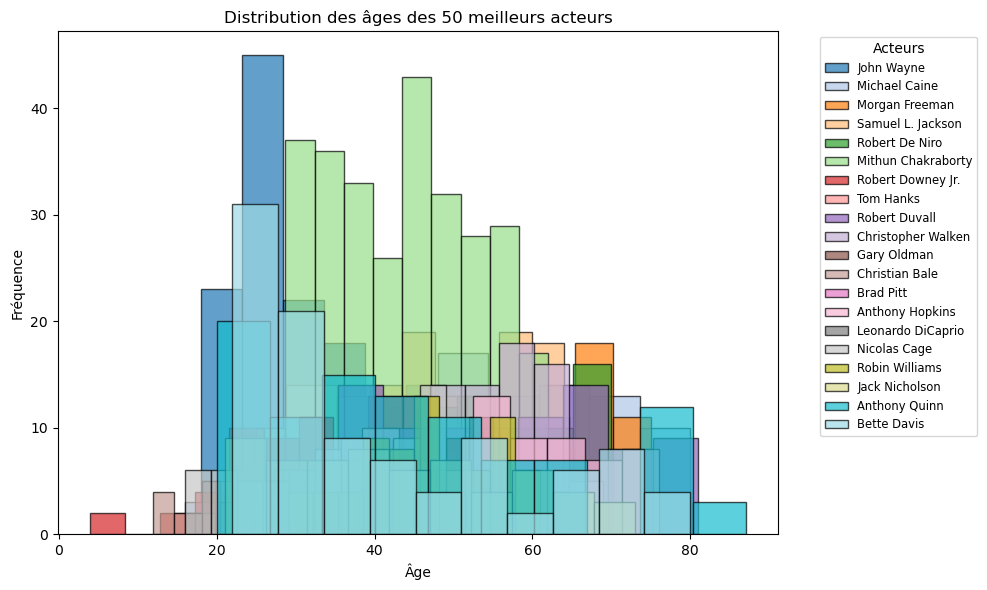

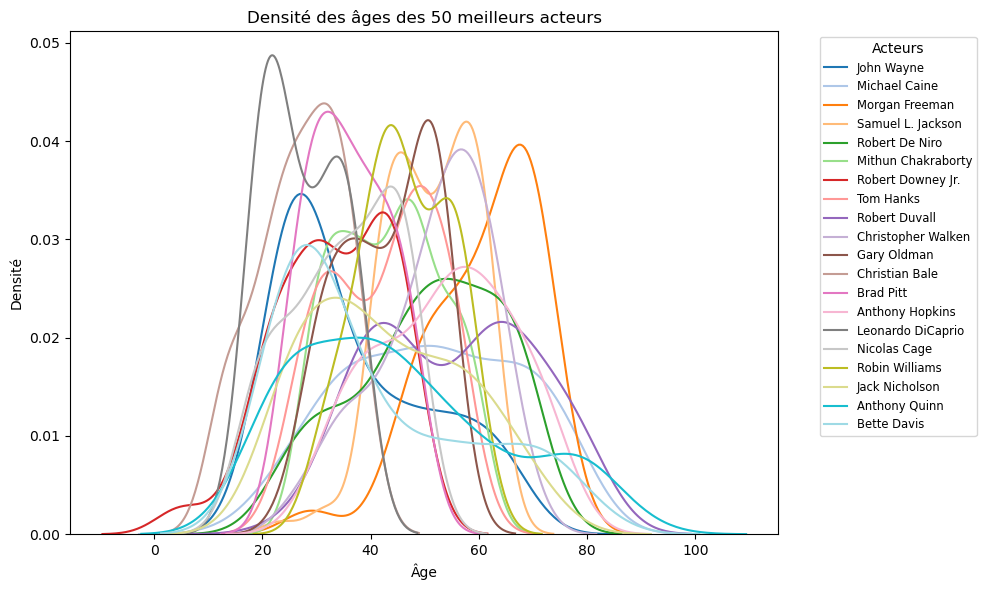

In [70]:
top_actors = df_cleaned.nlargest(20, "Score_PCA_2_scaled")

top_ages = top_actors.explode("ActorAgeAtRelease")[["ActorName", "ActorAgeAtRelease"]]
top_ages = top_ages.dropna()
top_ages["ActorAgeAtRelease"] = top_ages["ActorAgeAtRelease"].astype(float)

unique_actors = top_ages["ActorName"].unique()
colors = {actor: plt.cm.tab20(i / len(unique_actors)) for i, actor in enumerate(unique_actors)}

plt.figure(figsize=(10, 6))
for actor in unique_actors:
    actor_ages = top_ages[top_ages["ActorName"] == actor]["ActorAgeAtRelease"]
    plt.hist(actor_ages, bins=10, alpha=0.7, color=colors[actor], label=actor, edgecolor="k")

plt.title("Distribution des âges des 50 meilleurs acteurs")
plt.xlabel("Âge")
plt.ylabel("Fréquence")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title="Acteurs")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
for actor in unique_actors:
    actor_ages = top_ages[top_ages["ActorName"] == actor]["ActorAgeAtRelease"]
    sns.kdeplot(actor_ages, shade=False, color=colors[actor], label=actor)

plt.title("Densité des âges des 50 meilleurs acteurs")
plt.xlabel("Âge")
plt.ylabel("Densité")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title="Acteurs")
plt.tight_layout()
plt.show()

In [71]:
top_actors = df_cleaned.nlargest(100, "Score_PCA_2_scaled")


In [74]:
top_actors = df_cleaned.nlargest(20, "Score_PCA_2_scaled")

top_ages = top_actors.explode("ActorAgeAtRelease")[["ActorName", "ActorAgeAtRelease"]]
top_ages = top_ages.dropna()
top_ages["ActorAgeAtRelease"] = top_ages["ActorAgeAtRelease"].astype(float)

fig = go.Figure()

unique_actors = top_ages["ActorName"].unique()
for actor in unique_actors:
    actor_ages = top_ages[top_ages["ActorName"] == actor]["ActorAgeAtRelease"]
    if len(actor_ages) > 1:  
        kde = gaussian_kde(actor_ages)
        x_vals = np.linspace(actor_ages.min(), actor_ages.max(), 200)
        y_vals = kde(x_vals)
        fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=y_vals,
                mode="lines",
                name=actor,
                visible=False,  
            )
        )

fig.data[0].visible = True

buttons = []
for i, actor in enumerate(unique_actors):
    buttons.append(
        dict(
            label=actor,
            method="update",
            args=[
                {"visible": [j == i for j in range(len(unique_actors))]},  # Show only the selected actor's KDE
                {"title": f"Distribution des âges de {actor}"}
            ],
        )
    )

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=buttons,
            direction="down",
            x=1.15,
            y=0.5,
            showactive=True,
        )
    ],
    title="Distribution des âges des acteurs",
    xaxis_title="Âge",
    yaxis_title="Densité",
)

fig.show()

Let's see the tendancy. As the regression shows, an actor should start his career early

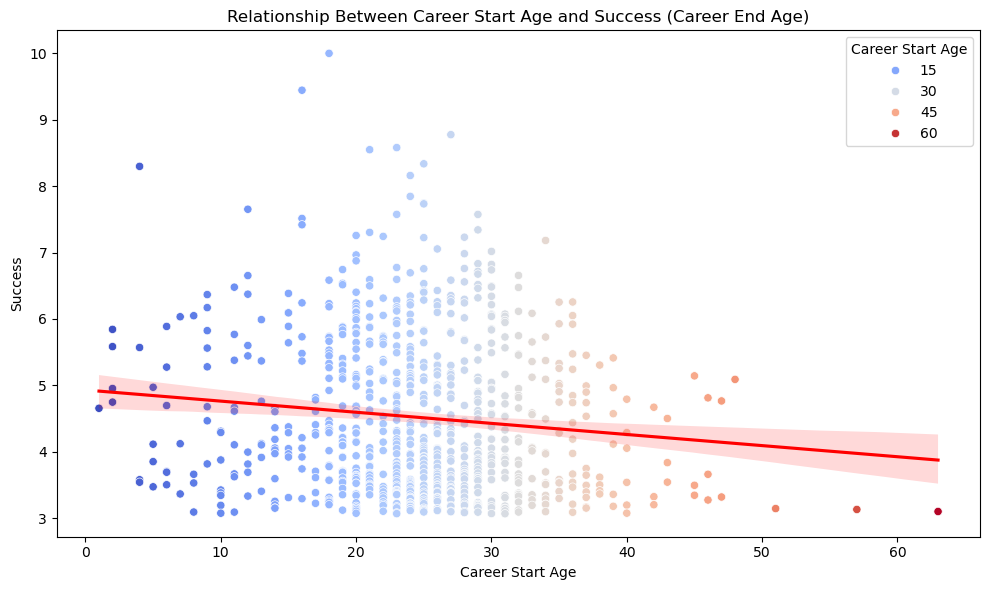

In [75]:
top_actors = df_cleaned.nlargest(1000, "Score_PCA_2_scaled")

top_actors["CareerStartAge"] = top_actors["ActorAgeAtRelease"].apply(lambda x: min(x) if isinstance(x, list) and len(x) > 0 else np.nan)
top_actors["CareerEndAge"] = top_actors["ActorAgeAtRelease"].apply(lambda x: max(x) if isinstance(x, list) and len(x) > 0 else np.nan)
top_actors["CareerLength"] = top_actors["CareerEndAge"] - top_actors["CareerStartAge"]
top_actors = top_actors[top_actors["CareerStartAge"] > 0]
top_actors = top_actors[top_actors["CareerEndAge"] > 0]
top_actors = top_actors[top_actors["CareerLength"] > 0]


plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=top_actors, 
    x="CareerStartAge", 
    y="Score_PCA_2_scaled", 
    hue="CareerStartAge", 
    palette="coolwarm", 
    sizes=(50, 200)
)

sns.regplot(
    data=top_actors, 
    x="CareerStartAge", 
    y="Score_PCA_2_scaled", 
    scatter=False, 
    color="red", 
    line_kws={"label": "Trend Line"}
)

plt.title("Relationship Between Career Start Age and Success (Career End Age)")
plt.xlabel("Career Start Age")
plt.ylabel("Success")
plt.legend(title="Career Start Age")
plt.tight_layout()
plt.show()

---
---
## 3. Lylia's part

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# Table of Contents
- [CelebA](#celebA)
  - [Subset Analysis](#subset-analysis)
    - [Linear Regression](#linear-regression)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
    - [Saturated regression](#saturated-regression)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
    - [Regularized Regression](#regularized-regression)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
    - [Gradient Boot](#gradient-boost)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
- [Social Background](#social-background)
    - [Linear Regression](#linear-regression)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
    - [Saturated regression](#saturated-regression)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
    - [Regularized Regression](#regularized-regression)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
    - [Gradient Boot](#gradient-boost)
      - [Score_PCA](#score_pca)
      - [Log_Score](#log_score)
- [Network](#network)
  - [Male & Female](#male--female-features)
  - [Both Gender](#both-genders)

In [2]:
final_actors = pd.read_pickle('/Users/lylou/Downloads/final_actors_19_12_2024_2.pkl')
final_actors.to_csv

<bound method NDFrame.to_csv of                       ActorName    ActorDOB ActorGender   ActorAgeAtRelease  \
0                     'Big' Lee        1939           M               [nan]   
1            'Chicken' Holleman        None        None               [nan]   
2              'Evil' Ted Smith        None        None               [nan]   
3       'Kecske' Molnár Levente        None           M               [nan]   
4            'King Kong' Kashey  1903-11-28           M              [39.0]   
...                         ...         ...         ...                 ...   
119222                     都はるみ  1948-02-22           F              [35.0]   
119223                      關淑怡  1966-08-15           F        [26.0, 30.0]   
119224                      陳文媛  1979-09-18           F              [23.0]   
119225                      陳曉東  1975-09-03           M        [22.0, 36.0]   
119226                     高山久子  1961-08-16           F  [43.0, 39.0, 24.0]   

                  C

In [3]:
final_actors.head(3)

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Sideburns,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,NaN,NaN,ActingOcc,0.0,1,1,0,116.000000,1
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,NaN,NaN,ActingOcc,NaN,2,1,1,88.000000,1
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,NaN,NaN,otherOcc,NaN,2,2,2,91.333333,0


In [4]:
final_actors.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'Score_PCA_2_scaled', 'top_3_countries', 'top_3_genre',
       'socioeconomic_background', 'education_level',
       'early_life_opportunities', 'ActorHeight', 'Arched_Eyebrows',
       'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
       'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Straight_Hair', 'Wavy_Hair', 'professionCategory', 'Male',
       'socioeconomic_background_enco

In [5]:
column_to_move = 'Score_PCA_2_scaled'

# Reorder the columns to have the score at then end for better visibility
columns = [col for col in final_actors.columns if col != column_to_move] + [column_to_move]
final_actors = final_actors[columns]
final_actors.head(3)

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded,Score_PCA_2_scaled
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,NaN,ActingOcc,0.0,1,1,0,116.000000,1,0.970941
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,NaN,ActingOcc,NaN,2,1,1,88.000000,1,1.034293
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,NaN,otherOcc,NaN,2,2,2,91.333333,0,0.763157


In [6]:
# Check the number of NaN values for each column
nan_counts = final_actors.isnull().sum()

print("Number of NaN values per column:")
print(nan_counts)

Number of NaN values per column:
ActorName                               0
ActorDOB                            48489
ActorGender                         32734
ActorAgeAtRelease                       0
Characters                              0
                                    ...  
education_level_encoded                 0
early_life_opportunities_encoded        0
AvgRuntime                            947
professionCategory_encoded              0
Score_PCA_2_scaled                      0
Length: 63, dtype: int64


In [7]:
num_missing_heights = (final_actors['ActorHeight'].isnull().sum()/len(final_actors))*100
print(f"Number of missing heights in ActorHeight: {num_missing_heights}")

Number of missing heights in ActorHeight: 67.75981950397141


In [8]:
num_missing_heights = (final_actors['Arched_Eyebrows'].isnull().sum()/len(final_actors))*100
print(f"Number of missing celebA: {num_missing_heights}")

Number of missing celebA: 96.29026982143306


# CelebA : Subset Analysis

In [9]:
subset_df = final_actors.dropna(subset=['Arched_Eyebrows'])

print(f"Original DataFrame shape: {final_actors.shape}")
print(f"Subset DataFrame shape after dropping NaNs: {subset_df.shape}")

Original DataFrame shape: (119227, 63)
Subset DataFrame shape after dropping NaNs: (4423, 63)


In [10]:
# Check the number of NaN values for each column
nan_counts = subset_df.isnull().sum()

print("Number of NaN values per column:")
print(nan_counts)

Number of NaN values per column:
ActorName                            0
ActorDOB                            73
ActorGender                         40
ActorAgeAtRelease                    0
Characters                           0
                                    ..
education_level_encoded              0
early_life_opportunities_encoded     0
AvgRuntime                           1
professionCategory_encoded           0
Score_PCA_2_scaled                   0
Length: 63, dtype: int64


In [11]:
# Chnage the -1 to 0 in the celebA dataset
columns_to_modify = [
    'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 
    'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 
    'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 
    'High_Cheekbones', 'Male', 'Mustache', 'Narrow_Eyes', 'No_Beard', 
    'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 
    'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair', 
]

subset_df[columns_to_modify] = subset_df[columns_to_modify].replace(-1, 0)
subset_df.head(3)

/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_29683/2528168992.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df[columns_to_modify] = subset_df[columns_to_modify].replace(-1, 0)


,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded,Score_PCA_2_scaled
87,AJ McLean,1978-01-09,M,[23.0],[nan],None,[6670576],[United States of America],[2001],[4.5],...,0.0,0.0,ActingOcc,0.0,2,2,2,90.000000,1,0.722971
88,AJ Perez,1993-02-17,M,"[17.0, 17.0, 14.0]","[nan, nan, nan]",actor,"[27809735, 28178412, tt0877651]","[Philippines, Philippines, nan]","[2010, 2010, 2006]","[5.8, 5.5, 7.1]",...,0.0,0.0,ActingOcc,0.0,0,1,2,118.666667,1,1.126962
98,Aaliyah,1979-01-16,F,"[22.0, 21.0]","[Queen Akasha, Trish O'Day]","music_artist,actress,composer","[9088886, 1047463, tt0118998]","[United States of America,Australia, United St...","[2002, 2000, 1998]","[5.3, 6.1, 5.4]",...,0.0,1.0,otherOcc,1.0,0,0,1,100.333333,0,1.048788


In [12]:
# Map values for ActorGender
subset_df['ActorGender'] = subset_df['ActorGender'].map({
    'F': 1,
    'M': 0
})

# Map values for primaryProfession
subset_df['primaryProfession'] = subset_df['primaryProfession'].map({
    'ActingOcc': 1,
    'otherOcc': 0
})
subset_df.head(3)

/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_29683/169863133.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df['ActorGender'] = subset_df['ActorGender'].map({
/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_29683/169863133.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df['primaryProfession'] = subset_df['primaryProfession'].map({


,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded,Score_PCA_2_scaled
87,AJ McLean,1978-01-09,0.0,[23.0],[nan],NaN,[6670576],[United States of America],[2001],[4.5],...,0.0,0.0,ActingOcc,0.0,2,2,2,90.000000,1,0.722971
88,AJ Perez,1993-02-17,0.0,"[17.0, 17.0, 14.0]","[nan, nan, nan]",NaN,"[27809735, 28178412, tt0877651]","[Philippines, Philippines, nan]","[2010, 2010, 2006]","[5.8, 5.5, 7.1]",...,0.0,0.0,ActingOcc,0.0,0,1,2,118.666667,1,1.126962
98,Aaliyah,1979-01-16,1.0,"[22.0, 21.0]","[Queen Akasha, Trish O'Day]",NaN,"[9088886, 1047463, tt0118998]","[United States of America,Australia, United St...","[2002, 2000, 1998]","[5.3, 6.1, 5.4]",...,0.0,1.0,otherOcc,1.0,0,0,1,100.333333,0,1.048788


In [13]:
# Use log oy score2 to avoid to huge gap between the most successful and the rest
# to avoid log(0) 
subset_df['Log_Score'] = np.log(subset_df['Score_PCA_2_scaled'] + 1)
subset_df.head(2)

/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_29683/3390433006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df['Log_Score'] = np.log(subset_df['Score_PCA_2_scaled'] + 1)


,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded,Score_PCA_2_scaled,Log_Score
87,AJ McLean,1978-01-09,0.0,[23.0],[nan],NaN,[6670576],[United States of America],[2001],[4.5],...,0.0,ActingOcc,0.0,2,2,2,90.000000,1,0.722971,0.544050
88,AJ Perez,1993-02-17,0.0,"[17.0, 17.0, 14.0]","[nan, nan, nan]",NaN,"[27809735, 28178412, tt0877651]","[Philippines, Philippines, nan]","[2010, 2010, 2006]","[5.8, 5.5, 7.1]",...,0.0,ActingOcc,0.0,0,1,2,118.666667,1,1.126962,0.754694


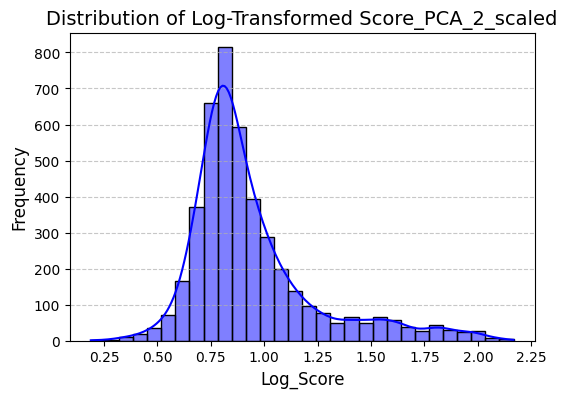

In [14]:
import seaborn as sns

# Plot histogram
plt.figure(figsize=(6, 4))
sns.histplot(subset_df['Log_Score'], kde=True, color='blue', bins=30)
plt.title('Distribution of Log-Transformed Score_PCA_2_scaled', fontsize=14)
plt.xlabel('Log_Score', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Better the score are between 0 and 2 approx.

## Linear Regression

In [15]:
subset_df.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'top_3_countries', 'top_3_genre', 'socioeconomic_background',
       'education_level', 'early_life_opportunities', 'ActorHeight',
       'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs',
       'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair',
       'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair',
       'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face',
       'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks',
       'Sideburns', 'Straight_Hair', 'Wavy_Hair', 'professionCategory', 'Male',
       'socioeconomic_background_encoded', 'education_level_encode

In [16]:
subset_df = subset_df.dropna(subset=['ActorGender'])
len(subset_df)

4383

In [17]:
# Check the number of NaN values for each column
nan_counts = subset_df.isnull().sum()

print("Number of NaN values per column:")
print(nan_counts)

Number of NaN values per column:
ActorName                            0
ActorDOB                            53
ActorGender                          0
ActorAgeAtRelease                    0
Characters                           0
                                    ..
early_life_opportunities_encoded     0
AvgRuntime                           1
professionCategory_encoded           0
Score_PCA_2_scaled                   0
Log_Score                            0
Length: 64, dtype: int64


In [18]:
nan_count = subset_df['ActorHeight'].isna().sum()

print(f"Number of NaN values in ActorHeight column: {(nan_count/len(subset_df))*100} %")

Number of NaN values in ActorHeight column: 10.768879762719598 %


In [19]:
# Filling the NaNs with the mean height based on the gender
gender_mean_heights = subset_df.groupby('ActorGender')['ActorHeight'].mean()

subset_df['ActorHeight'] = subset_df.apply(
    lambda row: gender_mean_heights[row['ActorGender']] if pd.isna(row['ActorHeight']) else row['ActorHeight'],
    axis=1
)

# check for NaNs
print(f"Number of NaN values in ActorHeight column after filling: {subset_df['ActorHeight'].isna().sum()}")


Number of NaN values in ActorHeight column after filling: 0


### Score_PCA

In [20]:
import statsmodels.formula.api as smf

# define the features for the regression
formula = """Score_PCA_2_scaled ~ C(Arched_Eyebrows) + ActorHeight +
             C(Attractive) + C(Bags_Under_Eyes) + C(Bald) + C(Bangs) + C(Big_Lips) +
             C(Big_Nose) + C(Black_Hair) + C(Blond_Hair) + C(Brown_Hair) + C(Bushy_Eyebrows) +
             C(Chubby) + C(Double_Chin) + C(Goatee) + C(Gray_Hair) + C(High_Cheekbones) +
             C(Male) + C(Mustache) + C(Narrow_Eyes) + C(No_Beard) + C(Oval_Face) + C(Pale_Skin) +
             C(Pointy_Nose) + C(Receding_Hairline) + C(Rosy_Cheeks) + C(Sideburns) +
             C(Straight_Hair) + C(Wavy_Hair) """

# Fit the regression model
model = smf.ols(formula=formula, data=subset_df).fit()

print(model.summary())


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:     Score_PCA_2_scaled   R-squared:                       0.087
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     14.27
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           3.54e-66
Time:                        23:51:59   Log-Likelihood:                -6161.1
No. Observations:                4383   AIC:                         1.238e+04
Df Residuals:                    4353   BIC:                         1.257e+04
Df Model:                          29                                         
Covariance Type:            nonrobust  

| Feature                         | Coefficient | P-value |
|---------------------------------|-------------|---------|
| C(Arched_Eyebrows)[T.1.0]       | -0.0809     | 0.048   |
| C(Attractive)[T.1.0]            | -0.1764     | 0.000   |
| C(Bags_Under_Eyes)[T.1.0]       | 0.0860      | 0.036   |
| C(Bald)[T.1.0]                  | 0.2857      | 0.003   |
| C(Bangs)[T.1.0]                 | -0.1406     | 0.001   |
| C(Big_Lips)[T.1.0]              | -0.2336     | 0.000   |
| C(Black_Hair)[T.1.0]            | -0.1172     | 0.004   |
| C(Bushy_Eyebrows)[T.1.0]        | -0.1035     | 0.028   |
| C(Gray_Hair)[T.1.0]             | 0.5145      | 0.000   |
| C(Oval_Face)[T.1.0]             | 0.0857      | 0.015   |
| C(Pale_Skin)[T.1.0]             | 0.1967      | 0.008   |
| C(Rosy_Cheeks)[T.1.0]           | -0.2229     | 0.000   |
| C(Straight_Hair)[T.1.0]         | -0.0826     | 0.049   |



Index(['Coef.', 'Std.Err.', 't', 'P>|t|', '[0.025', '0.975]'], dtype='object')


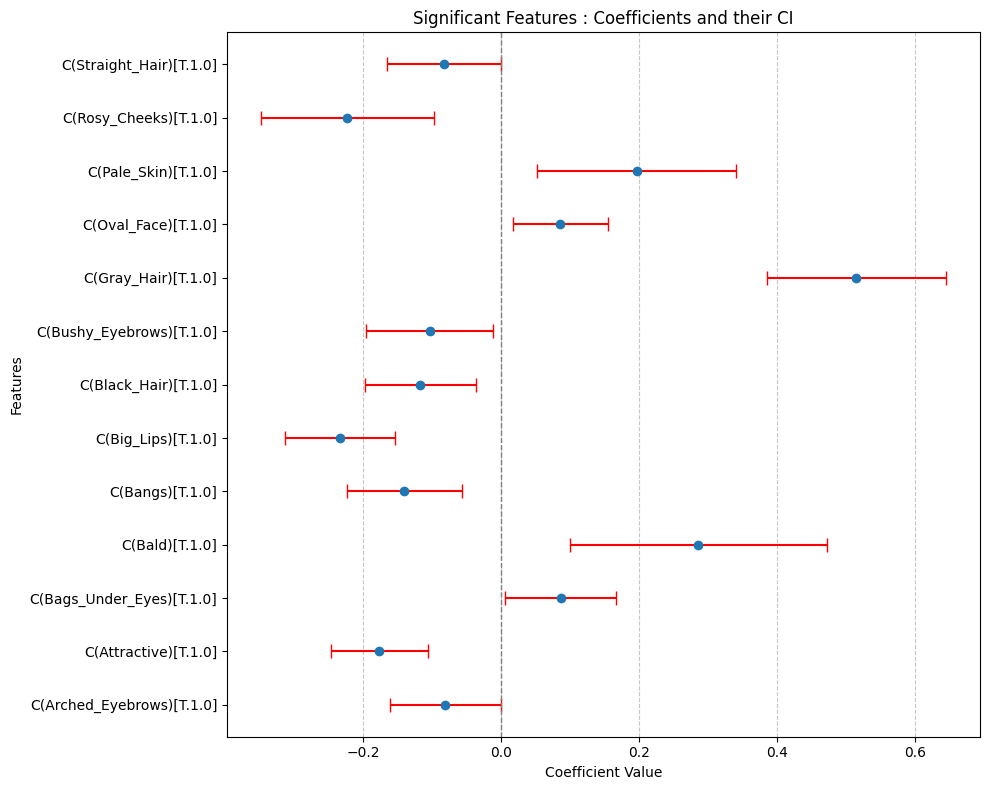

In [32]:
print(model.summary2().tables[1].columns)

summary_table = model.summary2().tables[1]
coefficients_column = 'Coef.'  
std_err_column = 'Std.Err.'  

# Filter significant features i.e p-value < 0.05 and exclude the intercept
significant_features = summary_table[(summary_table['P>|t|'] < 0.05) & (summary_table.index != 'Intercept')]

features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate CI
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Ploting
plt.figure(figsize=(10, 8))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='red',
    capsize=5,
    label='Confidence Interval'
)

plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)
plt.title("Significant Features : Coefficients and their CI")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Log_Score

In [27]:
formula = """Log_Score ~ C(Arched_Eyebrows) + ActorHeight +
             C(Attractive) + C(Bags_Under_Eyes) + C(Bald) + C(Bangs) + C(Big_Lips) +
             C(Big_Nose) + C(Black_Hair) + C(Blond_Hair) + C(Brown_Hair) + C(Bushy_Eyebrows) +
             C(Chubby) + C(Double_Chin) + C(Goatee) + C(Gray_Hair) + C(High_Cheekbones) +
             C(Male) + C(Mustache) + C(Narrow_Eyes) + C(No_Beard) + C(Oval_Face) + C(Pale_Skin) +
             C(Pointy_Nose) + C(Receding_Hairline) + C(Rosy_Cheeks) + C(Sideburns) +
             C(Straight_Hair) + C(Wavy_Hair) """

# Fit the regression model
model = smf.ols(formula=formula, data=subset_df).fit()

print(model.summary())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:              Log_Score   R-squared:                       0.094
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     15.55
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           4.67e-73
Time:                        18:32:33   Log-Likelihood:                -661.52
No. Observations:                4383   AIC:                             1383.
Df Residuals:                    4353   BIC:                             1575.
Df Model:                          29                                         
Covariance Type:            nonrobust  

| Feature                         | Coefficient | P-value |
|---------------------------------|-------------|---------|
| C(Arched_Eyebrows)[T.1.0]       | -0.0283     | 0.015   |
| C(Attractive)[T.1.0]            | -0.0560     | 0.000   |
| C(Bags_Under_Eyes)[T.1.0]       | 0.0254      | 0.030   |
| C(Bald)[T.1.0]                  | 0.0800      | 0.003   |
| C(Bangs)[T.1.0]                 | -0.0401     | 0.001   |
| C(Big_Lips)[T.1.0]              | -0.0726     | 0.000   |
| C(Black_Hair)[T.1.0]            | -0.0300     | 0.010   |
| C(Bushy_Eyebrows)[T.1.0]        | -0.0327     | 0.015   |
| C(Gray_Hair)[T.1.0]             | 0.1344      | 0.000   |
| C(Male)[T.1.0]                  | -0.0351     | 0.027   |
| C(Narrow_Eyes)[T.1.0]           | -0.0293     | 0.039   |
| C(Oval_Face)[T.1.0]             | 0.0318      | 0.001   |
| C(Pale_Skin)[T.1.0]             | 0.0596      | 0.005   |
| C(Rosy_Cheeks)[T.1.0]           | -0.0722     | 0.000   |


Index(['Coef.', 'Std.Err.', 't', 'P>|t|', '[0.025', '0.975]'], dtype='object')


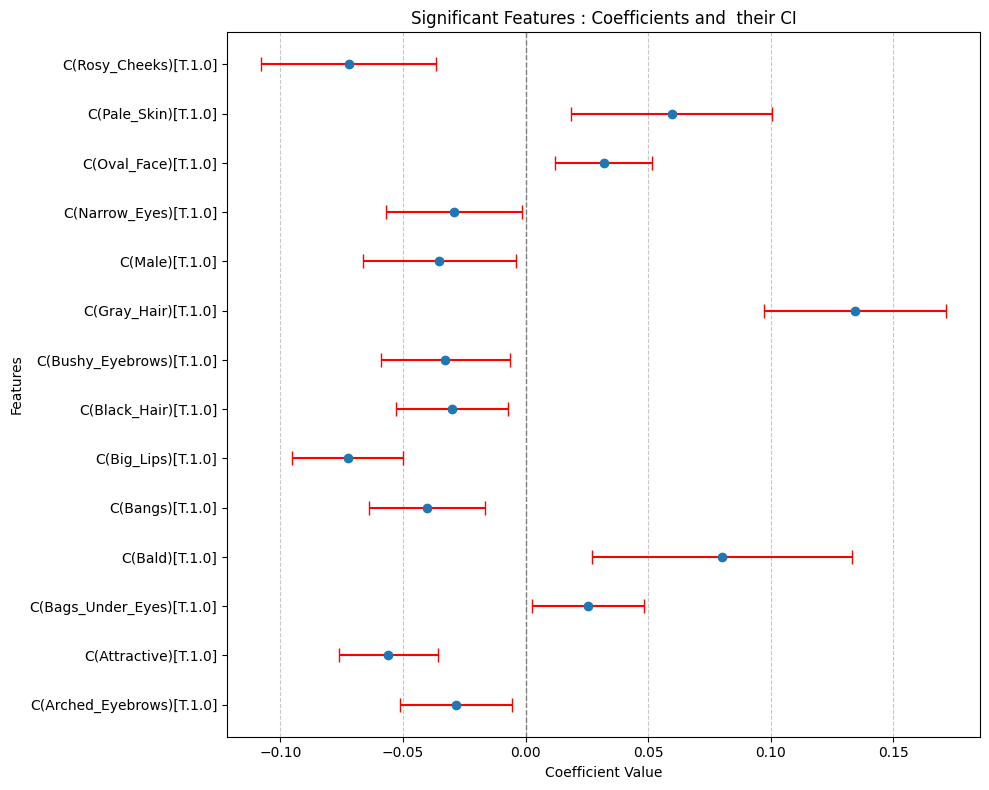

In [30]:
# Inspect the summary table to confirm column names
print(model.summary2().tables[1].columns)

# Use the actual column names from the summary table
summary_table = model.summary2().tables[1]
coefficients_column = 'Coef.'  # Update this based on actual column name
std_err_column = 'Std.Err.'  # Update this based on actual column name

# Filter significant features (p-value < 0.05) and exclude the intercept
significant_features = summary_table[(summary_table['P>|t|'] < 0.05) & (summary_table.index != 'Intercept')]

# Extract relevant data
features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate confidence intervals
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Plot the results
plt.figure(figsize=(10, 8))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='red',
    capsize=5,
    label='Confidence Interval'
)

# Add a vertical line at zero
plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)

# Customize the plot
plt.title("Significant Features : Coefficients and  their CI")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Saturated Regression

### Score_PCA

In [37]:
# Define the regression formula with interaction terms
saturated_formula = """Score_PCA_2_scaled ~ (C(Arched_Eyebrows) +  C(Attractive) + C(Bags_Under_Eyes) + C(Bald) 
                    + C(Bangs) + C(Big_Lips) + C(Black_Hair) + C(Bushy_Eyebrows) + C(Gray_Hair) + C(Oval_Face) + C(Pale_Skin) + C(Rosy_Cheeks) 
                    + C(Straight_Hair))**2"""

# Fit the saturated regression model
saturated_model = smf.ols(formula=saturated_formula, data=subset_df).fit()

# Print the summary
print(saturated_model.summary())


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:     Score_PCA_2_scaled   R-squared:                       0.107
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     5.767
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           1.17e-56
Time:                        18:37:14   Log-Likelihood:                -6112.7
No. Observations:                4383   AIC:                         1.241e+04
Df Residuals:                    4293   BIC:                         1.298e+04
Df Model:                          89                                         
Covariance Type:            nonrobust  

| Feature                                          | Coefficient | P-value |
|--------------------------------------------------|-------------|---------|
| C(Bags_Under_Eyes)[T.1.0]                        | 0.2030      | 0.003   |
| C(Bangs)[T.1.0]                                  | -0.2303     | 0.006   |
| C(Big_Lips)[T.1.0]                               | -0.3574     | 0.000   |
| C(Black_Hair)[T.1.0]                             | -0.2193     | 0.004   |
| C(Bushy_Eyebrows)[T.1.0]                         | -0.2106     | 0.045   |
| C(Gray_Hair)[T.1.0]                              | 0.4379      | 0.000   |
| C(Attractive)[T.1.0]:C(Gray_Hair)[T.1.0]         | 0.8753      | 0.024   |
| C(Attractive)[T.1.0]:C(Bags_Under_Eyes)[T.1.0]   | -0.1782     | 0.043   |
| C(Bald)[T.1.0]:C(Bangs)[T.1.0]                   | -3.143e-15  | 0.000   |
| C(Bald)[T.1.0]:C(Rosy_Cheeks)[T.1.0]             | -5.8273     | 0.000   |
| C(Bald)[T.1.0]:C(Straight_Hair)[T.1.0]           | 4.5261      | 0.000   |
| C(Bangs)[T.1.0]:C(Oval_Face)[T.1.0]              | 0.2410      | 0.013   |
| C(Bushy_Eyebrows)[T.1.0]:C(Pale_Skin)[T.1.0]     | 0.5058      | 0.049   |
| C(Pale_Skin)[T.1.0]:C(Rosy_Cheeks)[T.1.0]        | 2.1479      | 0.005   |



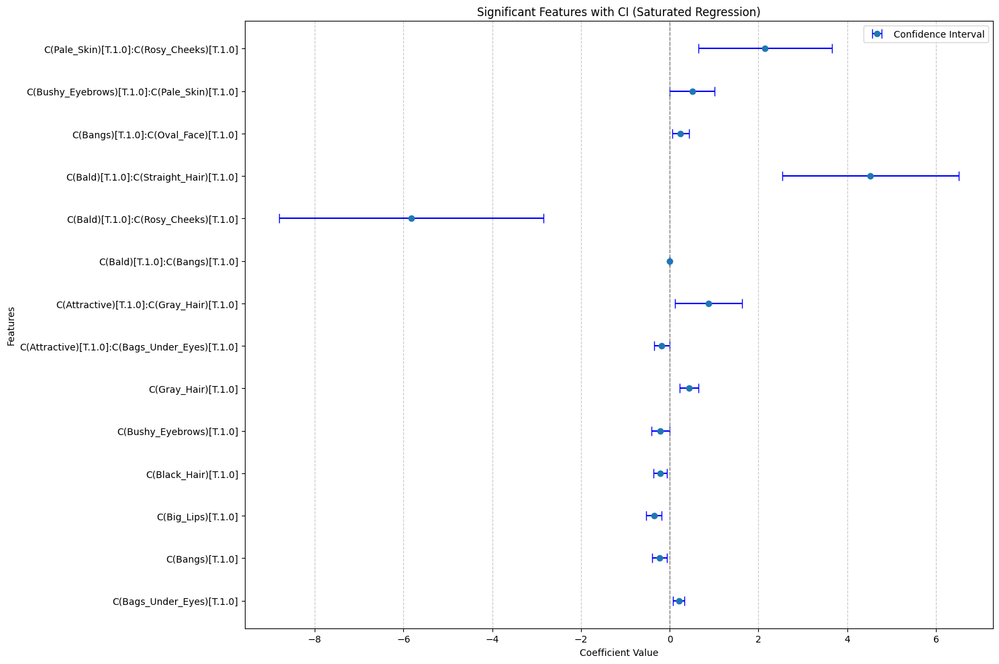

In [38]:
saturated_summary = saturated_model.summary2().tables[1]

coefficients_column = 'Coef.'
std_err_column = 'Std.Err.'
p_value_column = 'P>|t|'

# Filter for significant features i.E p-value < 0.05 and exclude the intercept
significant_features = saturated_summary[
    (saturated_summary[p_value_column] < 0.05) & (saturated_summary.index != 'Intercept')
]

features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate CI
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Ploting
plt.figure(figsize=(15, 10))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='blue',
    capsize=5,
    label='Confidence Interval'
)

plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)
plt.title("Significant Features with CI (Saturated Regression)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.legend()
plt.show()


### Log_Score

In [39]:
# Define the regression formula with interaction terms
saturated_formula = """Log_Score ~ (C(Arched_Eyebrows) +  C(Attractive) + C(Bags_Under_Eyes) + C(Bald) 
                    + C(Bangs) + C(Big_Lips) + C(Black_Hair) + C(Bushy_Eyebrows) + C(Gray_Hair) + C(Male) + C(Narrow_Eyes) + C(Oval_Face) 
                    + C(Pale_Skin) + C(Rosy_Cheeks) )**2"""

# Fit the saturated regression model
saturated_model_log = smf.ols(formula=saturated_formula, data=subset_df).fit()

# Print the summary
print(saturated_model_log.summary())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:              Log_Score   R-squared:                       0.112
Model:                            OLS   Adj. R-squared:                  0.091
Method:                 Least Squares   F-statistic:                     5.241
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           6.24e-56
Time:                        18:37:20   Log-Likelihood:                -617.25
No. Observations:                4383   AIC:                             1442.
Df Residuals:                    4279   BIC:                             2107.
Df Model:                         103                                         
Covariance Type:            nonrobust  

| Feature                                        | Coefficient | P-value |
|------------------------------------------------|-------------|---------|
| C(Attractive)[T.1.0]                           | -0.0454     | 0.041   |
| C(Bags_Under_Eyes)[T.1.0]                      | 0.0473      | 0.023   |
| C(Bangs)[T.1.0]                                | -0.1181     | 0.001   |
| C(Big_Lips)[T.1.0]                             | -0.0986     | 0.001   |
| C(Black_Hair)[T.1.0]                           | -0.0528     | 0.020   |
| C(Bushy_Eyebrows)[T.1.0]                       | -0.0609     | 0.047   |
| C(Gray_Hair)[T.1.0]                            | 0.1295      | 0.000   |
| C(Narrow_Eyes)[T.1.0]                          | -0.0960     | 0.002   |
| C(Attractive)[T.1.0]:C(Bags_Under_Eyes)[T.1.0] | -0.0557     | 0.033   |
| C(Attractive)[T.1.0]:C(Black_Hair)[T.1.0]      | 0.0533      | 0.026   |
| C(Attractive)[T.1.0]:C(Oval_Face)[T.1.0]       | -0.0507     | 0.027   |
| C(Bald)[T.1.0]:C(Narrow_Eyes)[T.1.0]           | 0.2075      | 0.011   |
| C(Bangs)[T.1.0]:C(Male)[T.1.0]                 | 0.0716      | 0.031   |
| C(Black_Hair)[T.1.0]:C(Gray_Hair)[T.1.0]       | 3.252e-16   | 0.043   |
| C(Bushy_Eyebrows)[T.1.0]:C(Pale_Skin)[T.1.0]   | 0.1567      | 0.051   |
| C(Pale_Skin)[T.1.0]:C(Rosy_Cheeks)[T.1.0]      | 0.5945      | 0.007   |



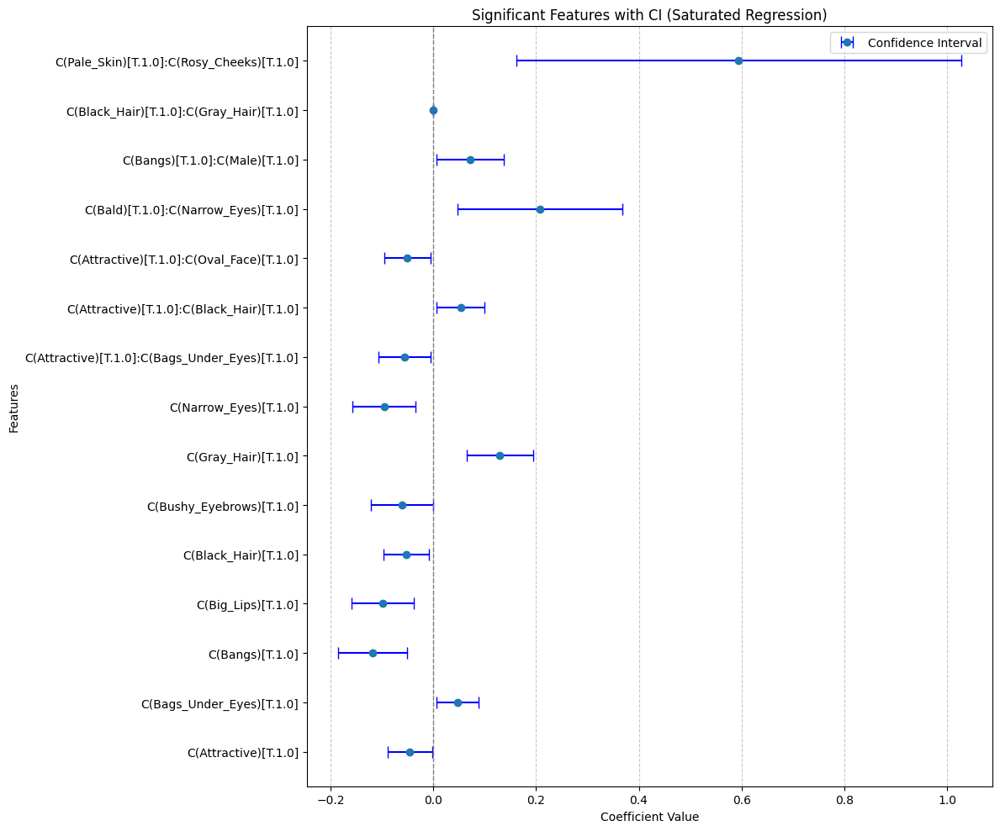

In [40]:
saturated_summary_log = saturated_model_log.summary2().tables[1]

coefficients_column = 'Coef.'
std_err_column = 'Std.Err.'
p_value_column = 'P>|t|'

# Filter for significant features i.e p-value < 0.05 and exclude the intercept
significant_features = saturated_summary_log[
    (saturated_summary_log[p_value_column] < 0.05) & (saturated_summary_log.index != 'Intercept')
]

features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate CI
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Ploting
plt.figure(figsize=(12, 10))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='blue',
    capsize=5,
    label='Confidence Interval'
)

plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)
plt.title("Significant Features with CI (Saturated Regression)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.legend()
plt.show()


## Regularized Regression

- Ridge regression -> L2 regularization, it retains all features in the model, reducing the impact of less important features by shrinking their coefficients.
- Lasso regression -> L1 regularization (more"severe"), it sets some coefficients to zero, effectively selecting the most relevant features and improving model interpretability.

In [41]:
subset_df.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'top_3_countries', 'top_3_genre', 'socioeconomic_background',
       'education_level', 'early_life_opportunities', 'ActorHeight',
       'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs',
       'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair',
       'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair',
       'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face',
       'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks',
       'Sideburns', 'Straight_Hair', 'Wavy_Hair', 'professionCategory', 'Male',
       'socioeconomic_background_encoded', 'education_level_encode

### Score_PCA

In [38]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Define the features
selected_features = [
    'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
    'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee',
    'Gray_Hair', 'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
    'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair', 'Male',
    'ActorHeight'
]

# Extract selected features and target variable
X = subset_df[selected_features]
y = subset_df["Score_PCA_2_scaled"]

# Encode categorical variables in case
X_encoded = pd.get_dummies(X, drop_first=True)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded)

# Split the data into tain and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Apply Ridge 
ridge = Ridge(alpha=1.0)  # Adjust alpha for regularization strength
ridge.fit(X_train, y_train)

# Apply Lasso 
lasso = Lasso(alpha=0.1)  # Adjust alpha for regularization strength
lasso.fit(X_train, y_train)

ridge_coefs = ridge.coef_
lasso_coefs = lasso.coef_

print("Ridge Coefficients:", ridge_coefs)
print("Lasso Coefficients:", lasso_coefs)

# Evaluate on test set
ridge_score = ridge.score(X_test, y_test)
lasso_score = lasso.score(X_test, y_test)
print("Ridge Test R^2:", ridge_score)
print("Lasso Test R^2:", lasso_score)



Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Ridge Coefficients: [-0.02725574 -0.09327173  0.04247671  0.05824289 -0.04901502 -0.09072924
  0.01844242 -0.03941074 -0.01091973 -0.00067128 -0.04503548 -0.02656559
  0.0273691   0.01281429  0.13932038  0.03547508 -0.02852044 -0.03661056
 -0.01570733  0.04598551  0.0323948   0.01919344  0.01126168 -0.05448803
 -0.01164585 -0.02952717  0.0207992  -0.04089401 -0.01753534]
Lasso Coefficients: [-0.         -0.03869522  0.          0.00012683 -0.         -0.02180149
  0.         -0.         -0.         -0.         -0.          0.
  0.          0.          0.10494642  0.         -0.         -0.
 -0.          0.          0.         -0.          0.         -0.
  0.         -0.         -0.         -0.          0.        ]
Ridge Test R^2: 0.05815224

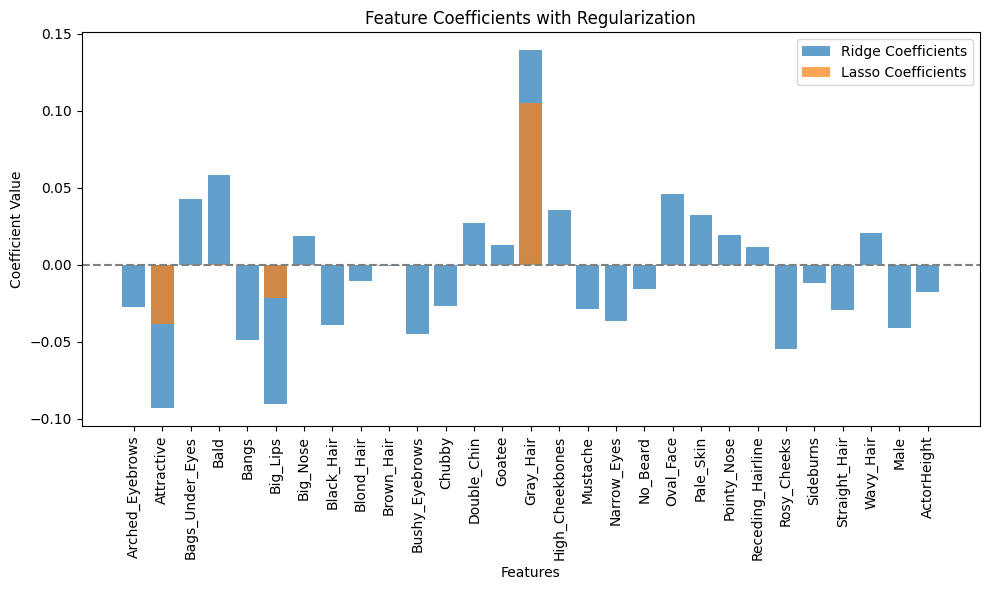

In [43]:
# Plot coefficients
features = X_encoded.columns

plt.figure(figsize=(10, 6))
plt.bar(features, ridge_coefs, alpha=0.7, label="Ridge Coefficients")
plt.bar(features, lasso_coefs, alpha=0.7, label="Lasso Coefficients")
plt.axhline(0, color="gray", linestyle="--")
plt.title("Feature Coefficients with Regularization")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


In [44]:
from sklearn.inspection import permutation_importance

# Permutation importance for Ridge
ridge_importance = permutation_importance(
    ridge, X_test, y_test, n_repeats=10, random_state=42, scoring="r2"
)
ridge_sorted_idx = ridge_importance.importances_mean.argsort()[::-1]

print("\nRidge Permutation Importance:")
for idx in ridge_sorted_idx:
    print(f"Feature: {X_encoded.columns[idx]}, Importance: {ridge_importance.importances_mean[idx]}")

# Permutation importance for Lasso
lasso_importance = permutation_importance(
    lasso, X_test, y_test, n_repeats=10, random_state=42, scoring="r2"
)
lasso_sorted_idx = lasso_importance.importances_mean.argsort()[::-1]

print("\nLasso Permutation Importance:")
for idx in lasso_sorted_idx:
    print(f"Feature: {X_encoded.columns[idx]}, Importance: {lasso_importance.importances_mean[idx]}")



Ridge Permutation Importance:
Feature: Gray_Hair, Importance: 0.023501562070456294
Feature: Attractive, Importance: 0.014245876097920995
Feature: Big_Lips, Importance: 0.012329260421294818
Feature: Bangs, Importance: 0.005510332605152967
Feature: Rosy_Cheeks, Importance: 0.004908475347933539
Feature: Black_Hair, Importance: 0.004694819102863979
Feature: Pale_Skin, Importance: 0.0037400571607397294
Feature: Male, Importance: 0.0023300885911768042
Feature: Bags_Under_Eyes, Importance: 0.0020027549694487724
Feature: Arched_Eyebrows, Importance: 0.0017977936453732247
Feature: Chubby, Importance: 0.0017869475991189264
Feature: Big_Nose, Importance: 0.0017515193126952044
Feature: Straight_Hair, Importance: 0.001713911752757169
Feature: ActorHeight, Importance: 0.0016554275681083474
Feature: No_Beard, Importance: 0.0015358978104378918
Feature: Oval_Face, Importance: 0.001407717002981168
Feature: Double_Chin, Importance: 0.0012874091643935714
Feature: Goatee, Importance: 0.0009010722185992415

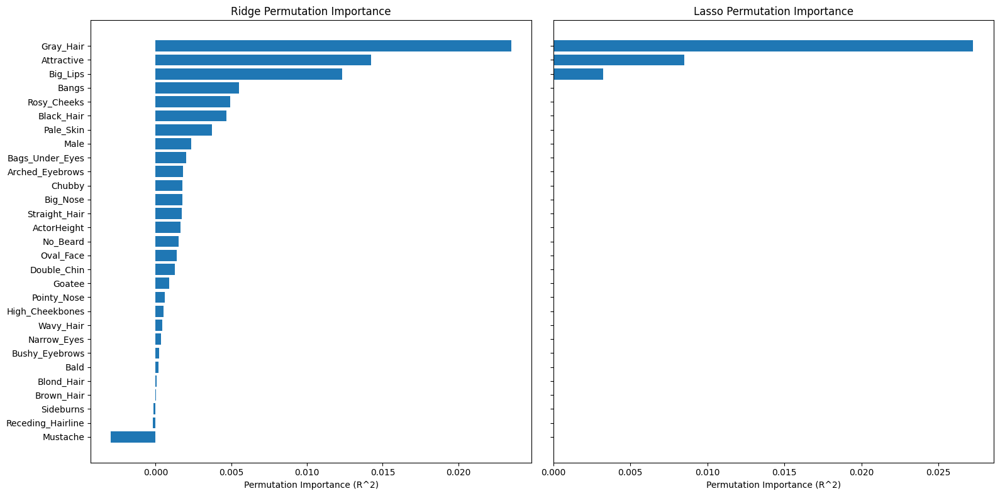

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Ridge Permutation Importance
axes[0].barh(X_encoded.columns[ridge_sorted_idx], ridge_importance.importances_mean[ridge_sorted_idx], align="center")
axes[0].set_xlabel("Permutation Importance (R^2)")
axes[0].set_title("Ridge Permutation Importance")
axes[0].invert_yaxis()

# Lasso Permutation Importance
axes[1].barh(X_encoded.columns[lasso_sorted_idx], lasso_importance.importances_mean[lasso_sorted_idx], align="center")
axes[1].set_xlabel("Permutation Importance (R^2)")
axes[1].set_title("Lasso Permutation Importance")

plt.tight_layout()
plt.show()


### Log_Score

In [ ]:
# Extract selected features and target variable
X_log = subset_df[selected_features]
y_log = subset_df["Log_Score"]

# Encode categorical variables in case
X_encoded_log = pd.get_dummies(X, drop_first=True)

# Standardize the data
scaler = StandardScaler()
X_scaled_log = scaler.fit_transform(X_encoded)

# Split the data into train and test sets
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_scaled_log, y_log, test_size=0.2, random_state=42)

# Apply Ridge 
ridge_log = Ridge(alpha=1.0)  # Adjust alpha for regularization strength
ridge_log.fit(X_train_log, y_train_log)

# Apply Lasso 
lasso_log = Lasso(alpha=0.1)  # Adjust alpha for regularization strength
lasso_log.fit(X_train_log, y_train_log)

ridge_coefs_log = ridge_log.coef_
lasso_coefs_log = lasso_log.coef_

print("Ridge Coefficients:", ridge_coefs_log)
print("Lasso Coefficients:", lasso_coefs_log)

# Evaluate on test set
ridge_score_log = ridge_log.score(X_test_log, y_test_log)
lasso_score_log = lasso_log.score(X_test_log, y_test_log)
print("Ridge Test score:", ridge_score_log)
print("Lasso Test score:", lasso_score_log)



Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Ridge Coefficients: [-0.00979337 -0.02934091  0.01314722  0.01696751 -0.01452499 -0.02862497
  0.00014447 -0.00962917 -0.00425559 -0.00077244 -0.01433508 -0.00481504
  0.00851242  0.00299128  0.03536609  0.00983789 -0.00826085 -0.01198829
 -0.00486592  0.0170082   0.0095914   0.00681785  0.0034175  -0.01779324
 -0.00255077 -0.0079382   0.00894371 -0.01818761 -0.00590346]
Lasso Coefficients: [-0. -0.  0.  0. -0. -0.  0. -0. -0. -0. -0.  0.  0.  0.  0. -0.  0. -0.
 -0.  0.  0. -0.  0. -0.  0. -0. -0. -0.  0.]
Ridge Test score: 0.06315185951085589
Lasso Test score: -0.0009650056878036661


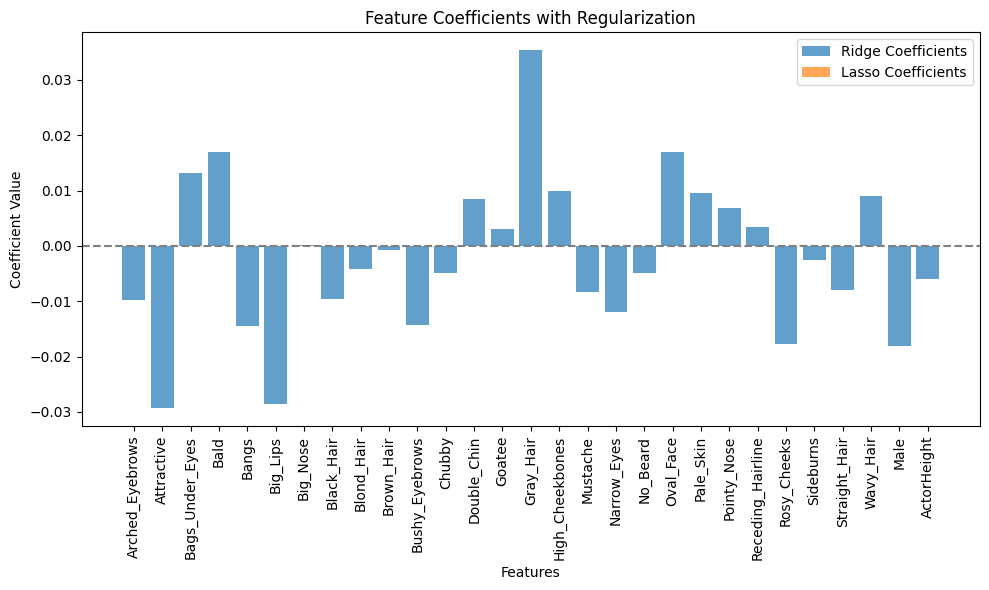

In [47]:
# Plot coefficients
features_log = X_encoded_log.columns

plt.figure(figsize=(10, 6))
plt.bar(features_log, ridge_coefs_log, alpha=0.7, label="Ridge Coefficients")
plt.bar(features_log, lasso_coefs_log, alpha=0.7, label="Lasso Coefficients")
plt.axhline(0, color="gray", linestyle="--")
plt.title("Feature Coefficients with Regularization")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


In [48]:
# Permutation importance for Ridge
ridge_importance_log = permutation_importance(
    ridge_log, X_test_log, y_test_log, n_repeats=10, random_state=42, scoring="r2"
)
ridge_sorted_idx_log = ridge_importance_log.importances_mean.argsort()[::-1]

print("\nRidge Permutation Importance:")
for idx in ridge_sorted_idx_log:
    print(f"Feature: {X_encoded_log.columns[idx]}, Importance: {ridge_importance_log.importances_mean[idx]}")

# Permutation importance for Lasso
lasso_importance_log = permutation_importance(
    lasso_log, X_test_log, y_test_log, n_repeats=10, random_state=42, scoring="r2"
)
lasso_sorted_idx_log = lasso_importance_log.importances_mean.argsort()[::-1]

print("\nLasso Permutation Importance:")
for idx in lasso_sorted_idx_log:
    print(f"Feature: {X_encoded_log.columns[idx]}, Importance: {lasso_importance_log.importances_mean[idx]}")



Ridge Permutation Importance:
Feature: Gray_Hair, Importance: 0.02142883547916321
Feature: Attractive, Importance: 0.017349304941619504
Feature: Big_Lips, Importance: 0.012988939005280564
Feature: Rosy_Cheeks, Importance: 0.005850711193093727
Feature: Male, Importance: 0.005512921673095228
Feature: Bangs, Importance: 0.004476437026551328
Feature: Pale_Skin, Importance: 0.004189111489913166
Feature: Black_Hair, Importance: 0.0034496319134472487
Feature: Arched_Eyebrows, Importance: 0.0025105190399878794
Feature: Bags_Under_Eyes, Importance: 0.0024795118107459936
Feature: ActorHeight, Importance: 0.0023132973886714424
Feature: Oval_Face, Importance: 0.0019015024202826635
Feature: Double_Chin, Importance: 0.0016590220433704617
Feature: No_Beard, Importance: 0.001427408313464351
Feature: Pointy_Nose, Importance: 0.0012573258427710954
Feature: High_Cheekbones, Importance: 0.0010802572149406942
Feature: Wavy_Hair, Importance: 0.000996804466947787
Feature: Straight_Hair, Importance: 0.000949

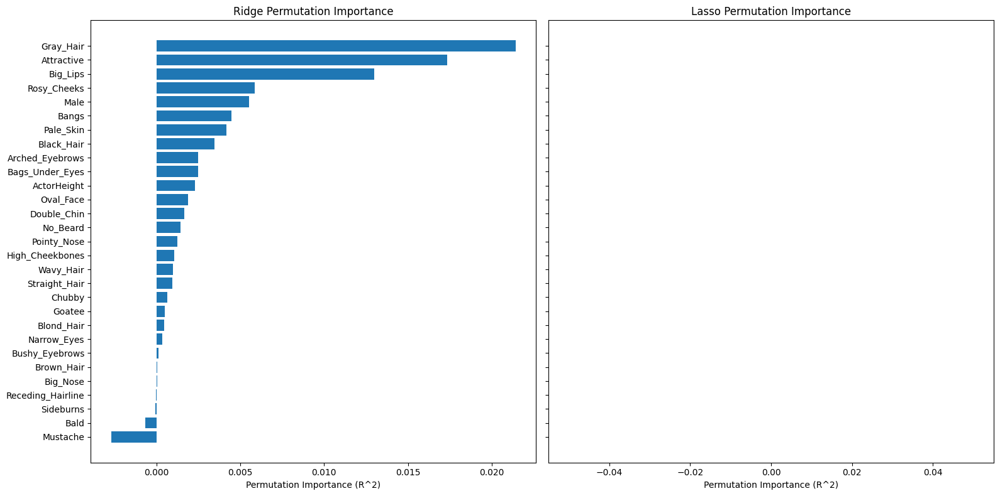

In [49]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Ridge Permutation Importance
axes[0].barh(X_encoded_log.columns[ridge_sorted_idx_log], ridge_importance_log.importances_mean[ridge_sorted_idx_log], align="center")
axes[0].set_xlabel("Permutation Importance (R^2)")
axes[0].set_title("Ridge Permutation Importance")
axes[0].invert_yaxis()

# Lasso Permutation Importance
axes[1].barh(X_encoded_log.columns[lasso_sorted_idx_log], lasso_importance_log.importances_mean[lasso_sorted_idx_log], align="center")
axes[1].set_xlabel("Permutation Importance (R^2)")
axes[1].set_title("Lasso Permutation Importance")

plt.tight_layout()
plt.show()


## Gradient Boost 

### Score_PCA

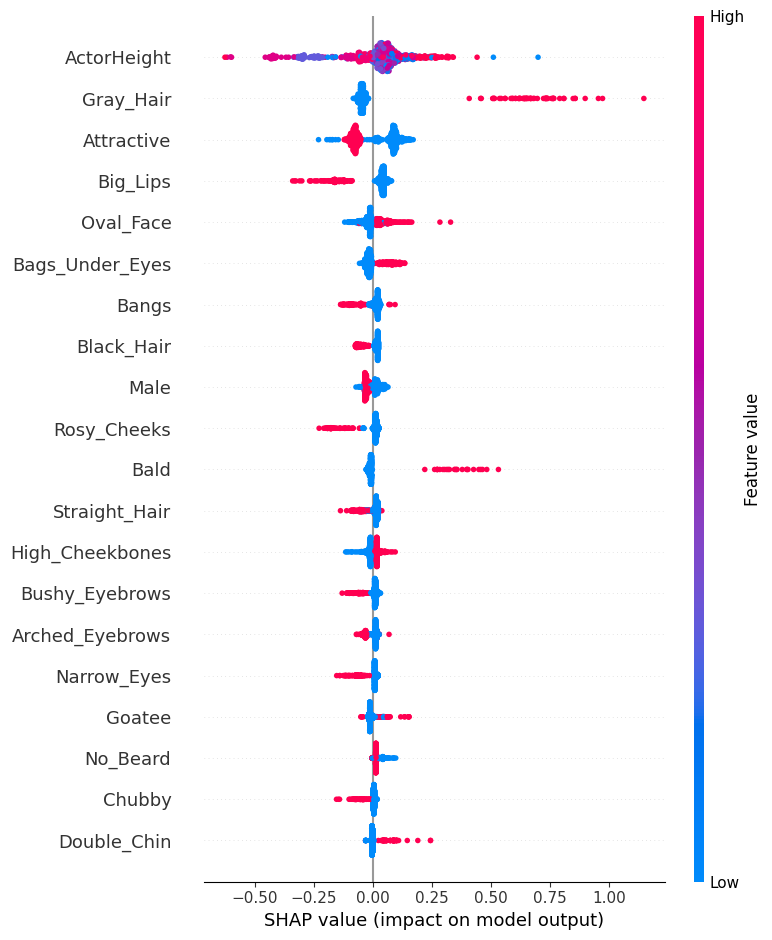

R^2 Score (Training Set): 0.2059
R^2 Score (Test Set): 0.0839


In [50]:
from sklearn.ensemble import GradientBoostingRegressor
import shap
from sklearn.metrics import r2_score

# Define the feature
features = [
    'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
    'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee',
    'Gray_Hair', 'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
    'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair', 'Male',
    'ActorHeight'
]

# Extract selected features and target variable
X = subset_df[features]
y = subset_df["Score_PCA_2_scaled"]

# Ensure all features are numbers
X_encoded = pd.get_dummies(subset_df[selected_features], drop_first=True)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, subset_df["Score_PCA_2_scaled"], test_size=0.2, random_state=42)

# Fit Gradient Boosting Regressor
gbr = GradientBoostingRegressor()
gbr.fit(X_train, y_train)

# SHAP 
explainer = shap.TreeExplainer(gbr)  
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values
shap.summary_plot(shap_values, X_test, feature_names=X_encoded.columns)

# r2 Score
y_train_pred = gbr.predict(X_train)
y_test_pred = gbr.predict(X_test)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print(f"R^2 Score (Training Set): {train_r2:.4f}")
print(f"R^2 Score (Test Set): {test_r2:.4f}")


### Log_Score

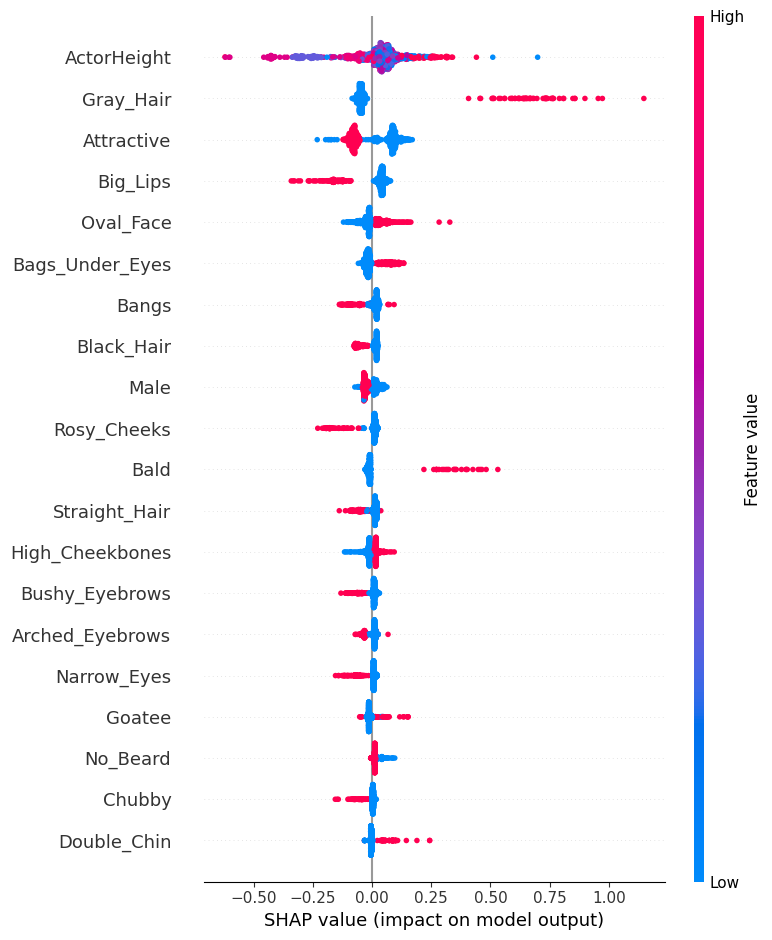

R^2 Score (Training Set): 0.2059
R^2 Score (Test Set): 0.0842


In [ ]:
X_log = subset_df[features]
y_log = subset_df["Log_Score"]

# Ensure all features are numeric 
X_encoded_log = pd.get_dummies(subset_df[selected_features], drop_first=True)

# Standardize the features
scaler_log = StandardScaler()
X_scaled_log = scaler_log.fit_transform(X_encoded_log)

# Split the data
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_scaled_log, subset_df["Score_PCA_2_scaled"], test_size=0.2, random_state=42)

# Fit Gbr
gbr_log = GradientBoostingRegressor()
gbr_log.fit(X_train_log, y_train_log)

# SHAP Explainer
explainer_log = shap.TreeExplainer(gbr_log)  
shap_values_log = explainer_log(X_test_log)

# SHAP values
shap.summary_plot(shap_values_log, X_test_log, feature_names=X_encoded_log.columns)

# r2 Score
y_train_pred_log = gbr_log.predict(X_train_log)
y_test_pred_log = gbr_log.predict(X_test_log)
train_r2_log = r2_score(y_train_log, y_train_pred_log)
test_r2_log = r2_score(y_test_log, y_test_pred_log)
print(f"R^2 Score (Training Set): {train_r2_log:.4f}")
print(f"R^2 Score (Test Set): {test_r2_log:.4f}")


# Social Background

## Linear Regression

In [21]:
final_actors.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'top_3_countries', 'top_3_genre', 'socioeconomic_background',
       'education_level', 'early_life_opportunities', 'ActorHeight',
       'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs',
       'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair',
       'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair',
       'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face',
       'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks',
       'Sideburns', 'Straight_Hair', 'Wavy_Hair', 'professionCategory', 'Male',
       'socioeconomic_background_encoded', 'education_level_encode

In [22]:
nan_count = final_actors['ActorHeight'].isna().sum()

print(f"Number of NaN values in ActorHeight column: {(nan_count/len(final_actors))*100} %")

Number of NaN values in ActorHeight column: 67.75981950397141 %


In [23]:
nan_count = final_actors['ActorAgeAtRelease'].isna().sum()

print(f"Number of NaN values in ActorAgeAtRelease column: {(nan_count/len(final_actors))*100} %")

Number of NaN values in ActorAgeAtRelease column: 0.0 %


In [24]:
nan_count = final_actors['professionCategory'].isna().sum()

print(f"Number of NaN values in socioeconomic_background_encoded column: {(nan_count/len(final_actors))*100} %")

Number of NaN values in socioeconomic_background_encoded column: 0.0 %


### Score_PCA

In [26]:
formula = """Score_PCA_2_scaled ~ socioeconomic_background + education_level +
       early_life_opportunities + C(professionCategory_encoded) """

# Fit the regression model
model = smf.ols(formula=formula, data=final_actors).fit()

print(model.summary())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:     Score_PCA_2_scaled   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     360.1
Date:                Fri, 20 Dec 2024   Prob (F-statistic):               0.00
Time:                        23:52:43   Log-Likelihood:                -65544.
No. Observations:              119227   AIC:                         1.311e+05
Df Residuals:                  119219   BIC:                         1.312e+05
Df Model:                           7                                         
Covariance Type:            nonrobust  

| Feature                             | Coefficient | p-value |
|-------------------------------------|-------------|---------|
| C(professionCategory_encoded)[T.1] | -0.1198     | 0.000   |
| socioeconomic_background_encoded   | -0.0070     | 0.000   |
| early_life_opportunities_encoded   |  0.0107     | 0.000   |


Index(['Coef.', 'Std.Err.', 't', 'P>|t|', '[0.025', '0.975]'], dtype='object')


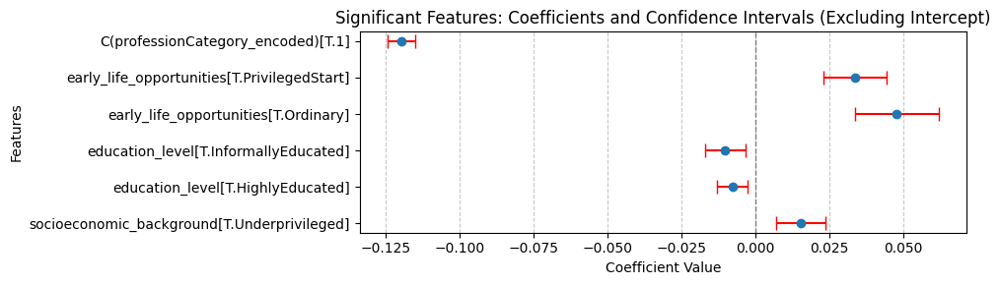

In [27]:
# Inspect the summary table to confirm column names
print(model.summary2().tables[1].columns)

# Use the actual column names from the summary table
summary_table = model.summary2().tables[1]
coefficients_column = 'Coef.'  
std_err_column = 'Std.Err.'  

# Filter significant features (p-value < 0.05) and exclude the intercept
significant_features = summary_table[(summary_table['P>|t|'] < 0.05) & (summary_table.index != 'Intercept')]

# Extract relevant data
features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate confidence intervals
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Plot the results
plt.figure(figsize=(10, 3))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='red',
    capsize=5,
    label='Confidence Interval'
)

# Add a vertical line at zero
plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)

# Customize the plot
plt.title("Significant Features: Coefficients and Confidence Intervals (Excluding Intercept)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Log_Score

In [28]:
# Use log oy score2 to avoid to huge gap between the most successful and the rest
# to avoid log(0) 
final_actors['Log_Score'] = np.log(final_actors['Score_PCA_2_scaled'] + 1)
final_actors.head(2)

/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_29683/2885649668.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_actors['Log_Score'] = np.log(final_actors['Score_PCA_2_scaled'] + 1)


,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded,Score_PCA_2_scaled,Log_Score
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,ActingOcc,0.0,1,1,0,116.0,1,0.970941,0.678511
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,ActingOcc,NaN,2,1,1,88.0,1,1.034293,0.710148


In [29]:
formula = """Log_Score ~ socioeconomic_background_encoded + education_level_encoded +
       early_life_opportunities_encoded + C(professionCategory_encoded) """

# Fit the regression model
model = smf.ols(formula=formula, data=final_actors).fit()

print(model.summary())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:              Log_Score   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     643.0
Date:                Fri, 20 Dec 2024   Prob (F-statistic):               0.00
Time:                        23:52:54   Log-Likelihood:                 55259.
No. Observations:              119227   AIC:                        -1.105e+05
Df Residuals:                  119222   BIC:                        -1.105e+05
Df Model:                           4                                         
Covariance Type:            nonrobust  

| Feature                             | Coefficient | p-value |
|-------------------------------------|-------------|---------|
| C(professionCategory_encoded)[T.1] | -0.0442     | 0.000   |
| socioeconomic_background_encoded   | -0.0030     | 0.000   |
| early_life_opportunities_encoded   |  0.0047     | 0.000   |


Index(['Coef.', 'Std.Err.', 't', 'P>|t|', '[0.025', '0.975]'], dtype='object')


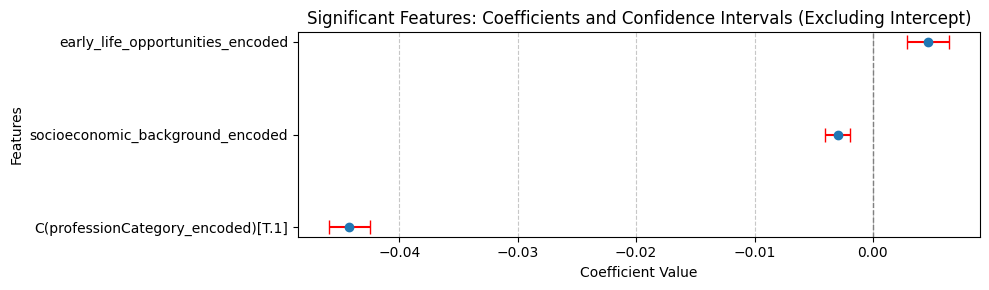

In [30]:
# Inspect the summary table to confirm column names
print(model.summary2().tables[1].columns)

# Use the actual column names from the summary table
summary_table = model.summary2().tables[1]
coefficients_column = 'Coef.'  
std_err_column = 'Std.Err.'  

# Filter significant features (p-value < 0.05) and exclude the intercept
significant_features = summary_table[(summary_table['P>|t|'] < 0.05) & (summary_table.index != 'Intercept')]

# Extract relevant data
features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate confidence intervals
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Plot the results
plt.figure(figsize=(10, 3))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='red',
    capsize=5,
    label='Confidence Interval'
)

# Add a vertical line at zero
plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)

# Customize the plot
plt.title("Significant Features: Coefficients and Confidence Intervals (Excluding Intercept)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Saturated Regression

### Score_PCA

In [33]:
# Define the regression formula with interaction terms
saturated_formula = """Score_PCA_2_scaled ~ (C(professionCategory_encoded) + socioeconomic_background_encoded +early_life_opportunities_encoded + education_level_encoded )**2"""

# Fit the saturated regression model
saturated_model = smf.ols(formula=saturated_formula, data=subset_df).fit()

# Print the summary
print(saturated_model.summary())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:     Score_PCA_2_scaled   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     10.28
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           2.51e-17
Time:                        23:53:39   Log-Likelihood:                -6309.3
No. Observations:                4383   AIC:                         1.264e+04
Df Residuals:                    4372   BIC:                         1.271e+04
Df Model:                          10                                         
Covariance Type:            nonrobust  

| Feature                                                      | Coefficient | p-value |
|--------------------------------------------------------------|-------------|---------|
| C(professionCategory_encoded)[T.1]                          | -0.5926     | 0.030   |
| socioeconomic_background_encoded:education_level_encoded     |  0.0571     | 0.037   |


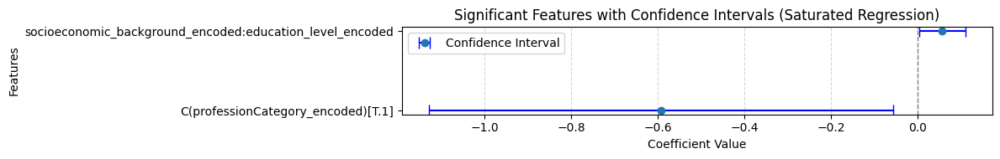

In [34]:
# Extract the summary table
saturated_summary = saturated_model.summary2().tables[1]

# Identify columns for coefficients, standard errors, and p-values
coefficients_column = 'Coef.'
std_err_column = 'Std.Err.'
p_value_column = 'P>|t|'

# Filter for significant features (p-value < 0.05) and exclude the intercept
significant_features = saturated_summary[
    (saturated_summary[p_value_column] < 0.05) & (saturated_summary.index != 'Intercept')
]

# Extract relevant data
features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate confidence intervals
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Plot the results
plt.figure(figsize=(12, 2))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='blue',
    capsize=5,
    label='Confidence Interval'
)

# Add a vertical line at zero
plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)

# Customize the plot
plt.title("Significant Features with Confidence Intervals (Saturated Regression)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.legend()
plt.show()


### Log_Score

In [35]:
# Define the regression formula with interaction terms
saturated_formula = """Log_Score ~ (C(professionCategory_encoded) + socioeconomic_background_encoded +early_life_opportunities_encoded + education_level_encoded )**2"""

# Fit the saturated regression model
saturated_model = smf.ols(formula=saturated_formula, data=subset_df).fit()

print(saturated_model.summary())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
                            OLS Regression Results                            
Dep. Variable:              Log_Score   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     13.45
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           1.37e-23
Time:                        23:53:52   Log-Likelihood:                -811.20
No. Observations:                4383   AIC:                             1644.
Df Residuals:                    4372   BIC:                             1715.
Df Model:                          10                                         
Covariance Type:            nonrobust  

| Feature                                                      | Coefficient | p-value |
|--------------------------------------------------------------|-------------|---------|
| C(professionCategory_encoded)[T.1]                          | -0.2123     | 0.007   |
| socioeconomic_background_encoded:education_level_encoded     |  0.0178     | 0.023   |


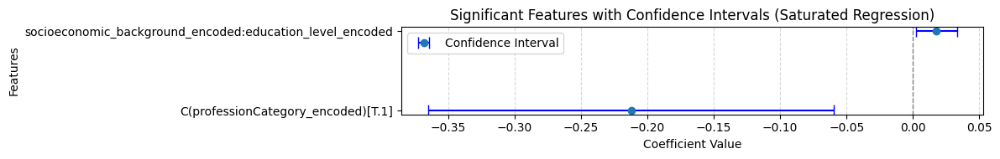

In [36]:
# Extract the summary table
saturated_summary = saturated_model.summary2().tables[1]

# Identify columns for coefficients, standard errors, and p-values
coefficients_column = 'Coef.'
std_err_column = 'Std.Err.'
p_value_column = 'P>|t|'

# Filter for significant features (p-value < 0.05) and exclude the intercept
significant_features = saturated_summary[
    (saturated_summary[p_value_column] < 0.05) & (saturated_summary.index != 'Intercept')
]

# Extract relevant data
features = significant_features.index
coefficients = significant_features[coefficients_column]
std_err = significant_features[std_err_column]

# Calculate confidence intervals
lower_ci = coefficients - 1.96 * std_err
upper_ci = coefficients + 1.96 * std_err

# Plot the results
plt.figure(figsize=(12, 2))
plt.errorbar(
    coefficients,
    features,
    xerr=[coefficients - lower_ci, upper_ci - coefficients],
    fmt='o',
    ecolor='blue',
    capsize=5,
    label='Confidence Interval'
)

# Add a vertical line at zero
plt.axvline(x=0, color='gray', linestyle='--', linewidth=1)

# Customize the plot
plt.title("Significant Features with Confidence Intervals (Saturated Regression)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.legend()
plt.show()


## Regularized Regression

### Score_PCA

In [39]:
selected_features = [
    'professionCategory_encoded' , 'socioeconomic_background_encoded' , 'early_life_opportunities_encoded' , 'education_level_encoded'
]

# Extract selected features and target variable
X = final_actors[selected_features]
y = final_actors["Score_PCA_2_scaled"]

# Encode categorical variables if needed (e.g., one-hot encoding)
X_encoded = pd.get_dummies(X, drop_first=True)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Apply Ridge Regression
ridge = Ridge(alpha=1.0)  # Adjust alpha for regularization strength
ridge.fit(X_train, y_train)

# Apply Lasso Regression
lasso = Lasso(alpha=0.1)  # Adjust alpha for regularization strength
lasso.fit(X_train, y_train)

# Print coefficients
ridge_coefs = ridge.coef_
lasso_coefs = lasso.coef_

print("Ridge Coefficients:", ridge_coefs)
print("Lasso Coefficients:", lasso_coefs)

# Evaluate on test set
ridge_score = ridge.score(X_test, y_test)
lasso_score = lasso.score(X_test, y_test)
print("Ridge Test R^2:", ridge_score)
print("Lasso Test R^2:", lasso_score)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Ridge Coefficients: [-0.06012173 -0.00629023  0.0045848  -0.00045932]
Lasso Coefficients: [-0. -0.  0. -0.]
Ridge Test R^2: 0.019586307063377273
Lasso Test R^2: -3.2279516236632944e-05


/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_25671/3723627613.py:13: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


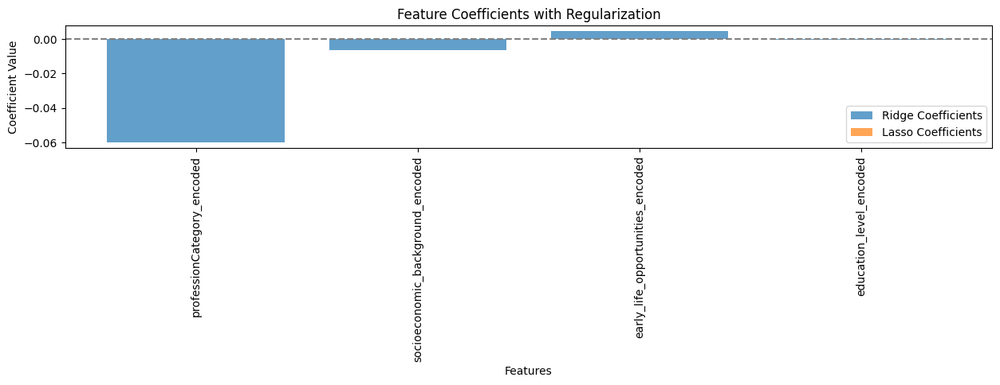

In [66]:
# Plot coefficients
features = X_encoded.columns

plt.figure(figsize=(15, 2))
plt.bar(features, ridge_coefs, alpha=0.7, label="Ridge Coefficients")
plt.bar(features, lasso_coefs, alpha=0.7, label="Lasso Coefficients")
plt.axhline(0, color="gray", linestyle="--")
plt.title("Feature Coefficients with Regularization")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


In [67]:
from sklearn.inspection import permutation_importance

# Permutation importance for Ridge
ridge_importance = permutation_importance(
    ridge, X_test, y_test, n_repeats=10, random_state=42, scoring="r2"
)
ridge_sorted_idx = ridge_importance.importances_mean.argsort()[::-1]

print("\nRidge Permutation Importance:")
for idx in ridge_sorted_idx:
    print(f"Feature: {X_encoded.columns[idx]}, Importance: {ridge_importance.importances_mean[idx]}")

# Permutation importance for Lasso
lasso_importance = permutation_importance(
    lasso, X_test, y_test, n_repeats=10, random_state=42, scoring="r2"
)
lasso_sorted_idx = lasso_importance.importances_mean.argsort()[::-1]

print("\nLasso Permutation Importance:")
for idx in lasso_sorted_idx:
    print(f"Feature: {X_encoded.columns[idx]}, Importance: {lasso_importance.importances_mean[idx]}")



Ridge Permutation Importance:
Feature: professionCategory_encoded, Importance: 0.03950829833290901
Feature: early_life_opportunities_encoded, Importance: 0.00045173131467668437
Feature: socioeconomic_background_encoded, Importance: 0.00028357535826997184
Feature: education_level_encoded, Importance: 5.087355396704574e-06

Lasso Permutation Importance:
Feature: education_level_encoded, Importance: 0.0
Feature: early_life_opportunities_encoded, Importance: 0.0
Feature: socioeconomic_background_encoded, Importance: 0.0
Feature: professionCategory_encoded, Importance: 0.0


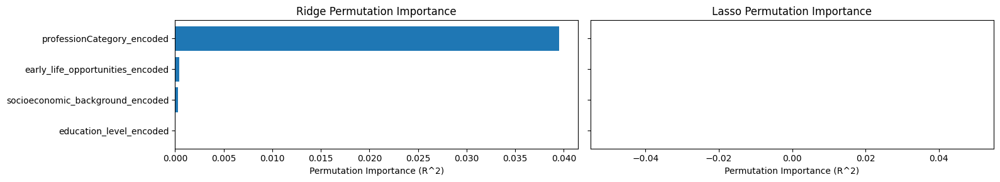

In [68]:
fig, axes = plt.subplots(1, 2, figsize=(16, 3), sharey=True)

# Ridge Permutation Importance
axes[0].barh(X_encoded.columns[ridge_sorted_idx], ridge_importance.importances_mean[ridge_sorted_idx], align="center")
axes[0].set_xlabel("Permutation Importance (R^2)")
axes[0].set_title("Ridge Permutation Importance")
axes[0].invert_yaxis()

# Lasso Permutation Importance
axes[1].barh(X_encoded.columns[lasso_sorted_idx], lasso_importance.importances_mean[lasso_sorted_idx], align="center")
axes[1].set_xlabel("Permutation Importance (R^2)")
axes[1].set_title("Lasso Permutation Importance")

plt.tight_layout()
plt.show()


### Log_Score

In [69]:
X_log = final_actors[selected_features]
y_log = final_actors["Log_Score"]

# Encode categorical variables in case
X_encoded_log = pd.get_dummies(X, drop_first=True)

# Standardize the data
scaler = StandardScaler()
X_scaled_log = scaler.fit_transform(X_encoded)

# Split the data into train and teste sets
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_scaled_log, y_log, test_size=0.2, random_state=42)

# Apply Ridge 
ridge_log = Ridge(alpha=1.0)  # Adjust alpha for regularization strength
ridge_log.fit(X_train_log, y_train_log)

# Apply Lasso 
lasso_log = Lasso(alpha=0.1)  # Adjust alpha for regularization strength
lasso_log.fit(X_train_log, y_train_log)

ridge_coefs_log = ridge_log.coef_
lasso_coefs_log = lasso_log.coef_

print("Ridge Coefficients:", ridge_coefs_log)
print("Lasso Coefficients:", lasso_coefs_log)

# Evaluate on test set
ridge_score_log = ridge_log.score(X_test_log, y_test_log)
lasso_score_log = lasso_log.score(X_test_log, y_test_log)
print("Ridge Test score:", ridge_score_log)
print("Lasso Test score:", lasso_score_log)



Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Ridge Coefficients: [-2.22147591e-02 -2.67927481e-03  1.97734694e-03 -8.56650709e-05]
Lasso Coefficients: [-0. -0.  0. -0.]
Ridge Test score: 0.01998228107384359
Lasso Test score: -5.261486229990453e-05


/var/folders/pq/vs1ny6651qz1x3k8m4bz09m40000gn/T/ipykernel_25671/3473590231.py:13: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


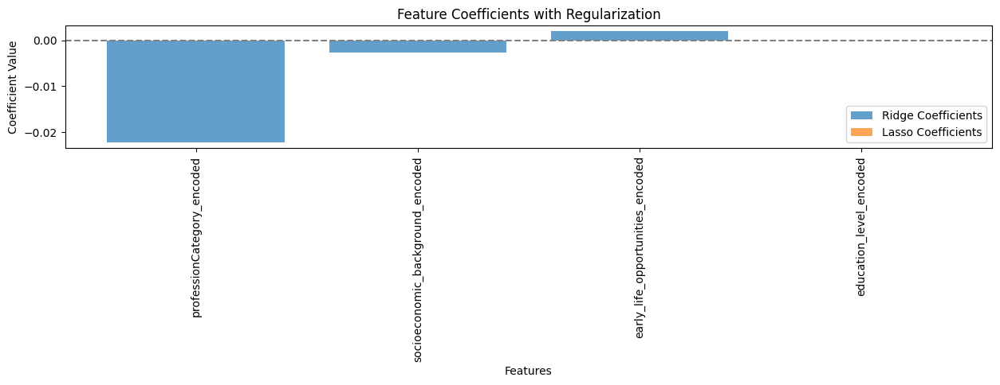

In [70]:
# Plot coefficients
features_log = X_encoded_log.columns

plt.figure(figsize=(15, 2))
plt.bar(features_log, ridge_coefs_log, alpha=0.7, label="Ridge Coefficients")
plt.bar(features_log, lasso_coefs_log, alpha=0.7, label="Lasso Coefficients")
plt.axhline(0, color="gray", linestyle="--")
plt.title("Feature Coefficients with Regularization")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


In [71]:
# Permutation importance for Ridge
ridge_importance_log = permutation_importance(
    ridge_log, X_test_log, y_test_log, n_repeats=10, random_state=42, scoring="r2"
)
ridge_sorted_idx_log = ridge_importance_log.importances_mean.argsort()[::-1]

print("\nRidge Permutation Importance:")
for idx in ridge_sorted_idx_log:
    print(f"Feature: {X_encoded_log.columns[idx]}, Importance: {ridge_importance_log.importances_mean[idx]}")

# Permutation importance for Lasso
lasso_importance_log = permutation_importance(
    lasso_log, X_test_log, y_test_log, n_repeats=10, random_state=42, scoring="r2"
)
lasso_sorted_idx_log = lasso_importance_log.importances_mean.argsort()[::-1]

print("\nLasso Permutation Importance:")
for idx in lasso_sorted_idx_log:
    print(f"Feature: {X_encoded_log.columns[idx]}, Importance: {lasso_importance_log.importances_mean[idx]}")



Ridge Permutation Importance:
Feature: professionCategory_encoded, Importance: 0.04033669161885169
Feature: early_life_opportunities_encoded, Importance: 0.0006243510049069756
Feature: socioeconomic_background_encoded, Importance: 0.0003981219832590144
Feature: education_level_encoded, Importance: -1.118363516061649e-06

Lasso Permutation Importance:
Feature: education_level_encoded, Importance: 0.0
Feature: early_life_opportunities_encoded, Importance: 0.0
Feature: socioeconomic_background_encoded, Importance: 0.0
Feature: professionCategory_encoded, Importance: 0.0


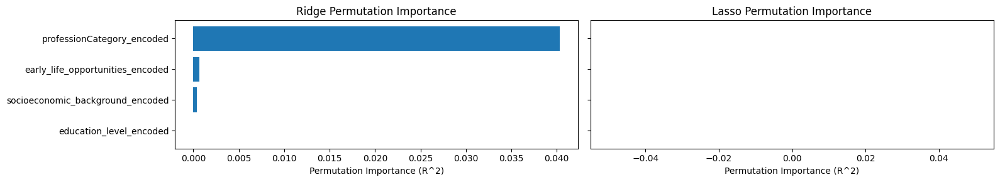

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(16, 3), sharey=True)

# Ridge Permutation Importance
axes[0].barh(X_encoded_log.columns[ridge_sorted_idx_log], ridge_importance_log.importances_mean[ridge_sorted_idx_log], align="center")
axes[0].set_xlabel("Permutation Importance (R^2)")
axes[0].set_title("Ridge Permutation Importance")
axes[0].invert_yaxis()

# Lasso Permutation Importance
axes[1].barh(X_encoded_log.columns[lasso_sorted_idx_log], lasso_importance_log.importances_mean[lasso_sorted_idx_log], align="center")
axes[1].set_xlabel("Permutation Importance (R^2)")
axes[1].set_title("Lasso Permutation Importance")

plt.tight_layout()
plt.show()


## Gradient Boost

### Score_PCA

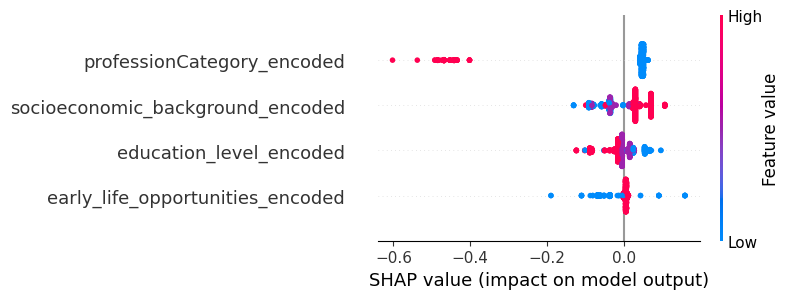

R^2 Score (Training Set): 0.0276
R^2 Score (Test Set): 0.0168


In [73]:
# Define the feature
features = [
        'professionCategory_encoded' , 'socioeconomic_background_encoded' , 'early_life_opportunities_encoded' , 'education_level_encoded'
]

# Extract selected features and target variable
X = final_actors[features]
y = final_actors["Score_PCA_2_scaled"]

X_encoded = pd.get_dummies(subset_df[selected_features], drop_first=True)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, subset_df["Score_PCA_2_scaled"], test_size=0.2, random_state=42)

# Fit Gbr
gbr = GradientBoostingRegressor()
gbr.fit(X_train, y_train)

# SHAP 
explainer = shap.TreeExplainer(gbr)  
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values
shap.summary_plot(shap_values, X_test, feature_names=X_encoded.columns)

# r2 Score
y_train_pred = gbr.predict(X_train)
y_test_pred = gbr.predict(X_test)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print(f"R^2 Score (Training Set): {train_r2:.4f}")
print(f"R^2 Score (Test Set): {test_r2:.4f}")


### Log_Score

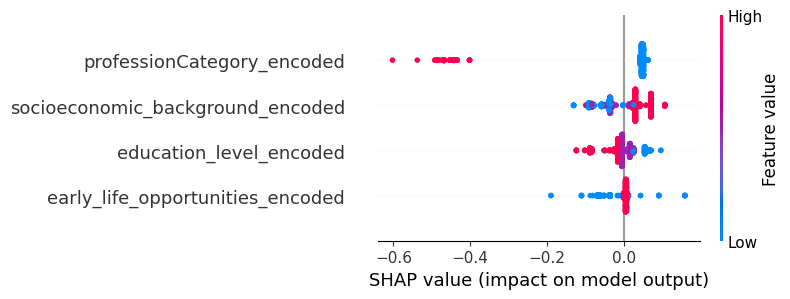

R^2 Score (Training Set): 0.0276
R^2 Score (Test Set): 0.0168


In [74]:
X_log = final_actors[features]
y_log = final_actors["Log_Score"]

# Ensure all features are numeric 
X_encoded_log = pd.get_dummies(subset_df[selected_features], drop_first=True)

# Standardize the features
scaler_log = StandardScaler()
X_scaled_log = scaler_log.fit_transform(X_encoded_log)

# Split the data
X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_scaled_log, subset_df["Score_PCA_2_scaled"], test_size=0.2, random_state=42)

# Fit Gbr
gbr_log = GradientBoostingRegressor()
gbr_log.fit(X_train_log, y_train_log)

# SHAP 
explainer_log = shap.TreeExplainer(gbr_log)  
shap_values_log = explainer_log(X_test_log)

# SHAP values
shap.summary_plot(shap_values_log, X_test_log, feature_names=X_encoded_log.columns)

# r2 Score
y_train_pred_log = gbr_log.predict(X_train_log)
y_test_pred_log = gbr_log.predict(X_test_log)
train_r2_log = r2_score(y_train_log, y_train_pred_log)
test_r2_log = r2_score(y_test_log, y_test_pred_log)
print(f"R^2 Score (Training Set): {train_r2_log:.4f}")
print(f"R^2 Score (Test Set): {test_r2_log:.4f}")


# Network

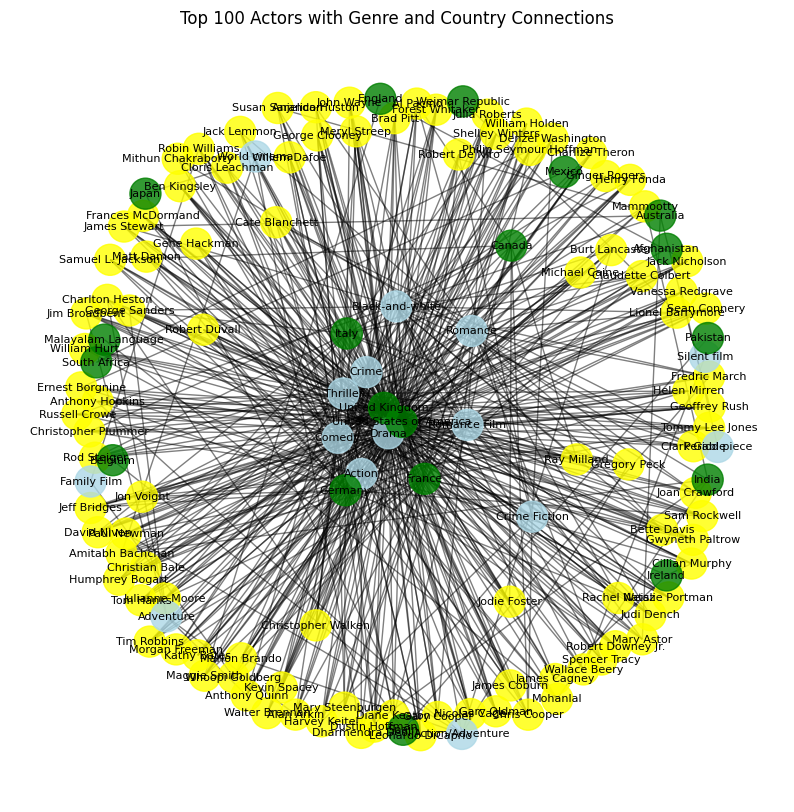

In [76]:
import networkx as nx

# look for top 100 actors based on Score_PCA_2_scaled
top_actors = final_actors.nlargest(100, 'Score_PCA_2_scaled')

# Graph G
G = nx.Graph()

# Add actor nodes
for actor in top_actors['ActorName']:
    G.add_node(actor, type='Actor', label=actor)

# Add genre nodes and edges
for _, row in top_actors.iterrows():
    actor = row['ActorName']
    genres = row['top_3_genre']  # Assuming this is a list
    for genre in genres:
        G.add_node(genre, type='Genre', label=genre)
        G.add_edge(actor, genre)

# Add country nodes and edges
for _, row in top_actors.iterrows():
    actor = row['ActorName']
    countries = row['top_3_countries']  # Assuming this is a list
    for country in countries:
        G.add_node(country, type='Country', label=country)
        G.add_edge(actor, country)

plt.figure(figsize=(10, 10))

# Position settings
pos = nx.spring_layout(G,k=1.5, seed=42)

# nodes colors
node_colors = [
    'yellow' if G.nodes[node]['type'] == 'Actor' else
    'lightblue' if G.nodes[node]['type'] == 'Genre' else
    'green'
    for node in G.nodes()
]

# Draw nodes, edges, and labels
nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(
    G, pos,
    labels={node: G.nodes[node]['label'] for node in G.nodes()},
    font_size=8,
    font_color='black'
)

plt.title("Top 100 Actors with Genre and Country Connections")
plt.axis('off')
plt.show()


The genre with the most connections is 'Drama' with 99 connections.
The country with the most connections is 'United States of America' with 95 connections.

Top Genres by Connections:
                  Connections
Drama                      99
Comedy                     46
Thriller                   34
Action                     26
Romance                    21
Black-and-white            18
Romance Film               16
Crime                      14
Crime Fiction               7
Action/Adventure            6
Adventure                   5
World cinema                3
Family Film                 2
Period piece                2
Silent film                 1

Top Countries by Connections:
                          Connections
United States of America           95
United Kingdom                     77
Germany                            34
France                             25
Italy                              15
Canada                             11
Australia                           5


<Figure size 800x600 with 0 Axes>

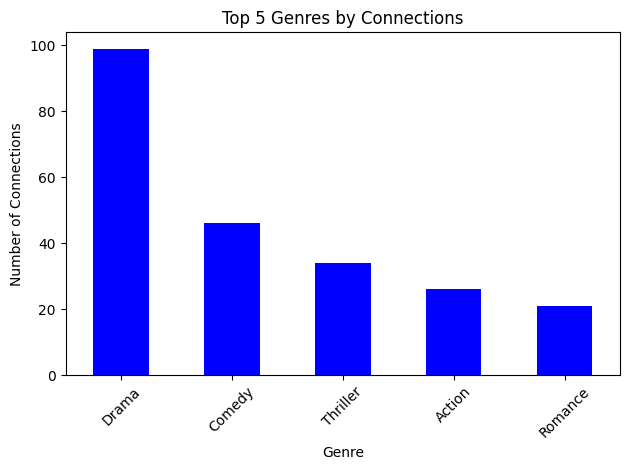

<Figure size 800x600 with 0 Axes>

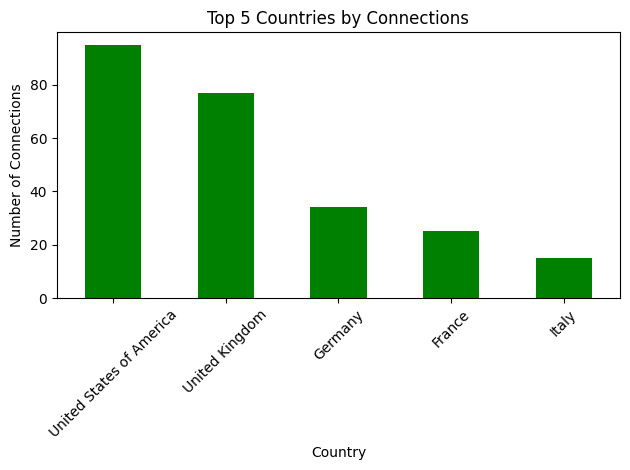

In [77]:
# Node degrees
node_degrees = dict(G.degree())

# Separate genres and countries from the actors
genre_degrees = {node: degree for node, degree in node_degrees.items() if G.nodes[node]['type'] == 'Genre'}
country_degrees = {node: degree for node, degree in node_degrees.items() if G.nodes[node]['type'] == 'Country'}

# Find the genre with the most connections
top_genre = max(genre_degrees, key=genre_degrees.get)
print(f"The genre with the most connections is '{top_genre}' with {genre_degrees[top_genre]} connections.")

# Find the country with the most connections
top_country = max(country_degrees, key=country_degrees.get)
print(f"The country with the most connections is '{top_country}' with {country_degrees[top_country]} connections.")

genre_stats = pd.DataFrame.from_dict(genre_degrees, orient='index', columns=['Connections']).sort_values(by='Connections', ascending=False)
country_stats = pd.DataFrame.from_dict(country_degrees, orient='index', columns=['Connections']).sort_values(by='Connections', ascending=False)

print("\nTop Genres by Connections:")
print(genre_stats)

print("\nTop Countries by Connections:")
print(country_stats)

# Plot Top 5 Genres
plt.figure(figsize=(8, 6))
genre_stats.head(5).plot(kind='bar', legend=False, color='blue')
plt.title("Top 5 Genres by Connections")
plt.xlabel("Genre")
plt.ylabel("Number of Connections")
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()

# Plot Top 5 Countries
plt.figure(figsize=(8, 6))
country_stats.head(5).plot(kind='bar', legend=False, color='green')
plt.title("Top 5 Countries by Connections")
plt.xlabel("Country")
plt.ylabel("Number of Connections")
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()


## Male & Female Features

In [78]:
top_50_actors = final_actors.nlargest(50, 'Score_PCA_2_scaled')

# look for female actresses in the top 50
female_actors_in_top_50 = top_50_actors[top_50_actors['ActorGender'] == 'F']
print(female_actors_in_top_50[['ActorName', 'Score_PCA_2_scaled', 'ActorGender', 'Male']])


               ActorName  Score_PCA_2_scaled ActorGender  Male
11657        Bette Davis            7.243004           F   1.0
16967     Cate Blanchett            7.202896           F   1.0
53172      Joan Crawford            6.875142           F   1.0
106458    Susan Sarandon            6.774606           F   1.0
112842  Vanessa Redgrave            6.716483           F   1.0
57949     Julianne Moore            6.675278           F   1.0


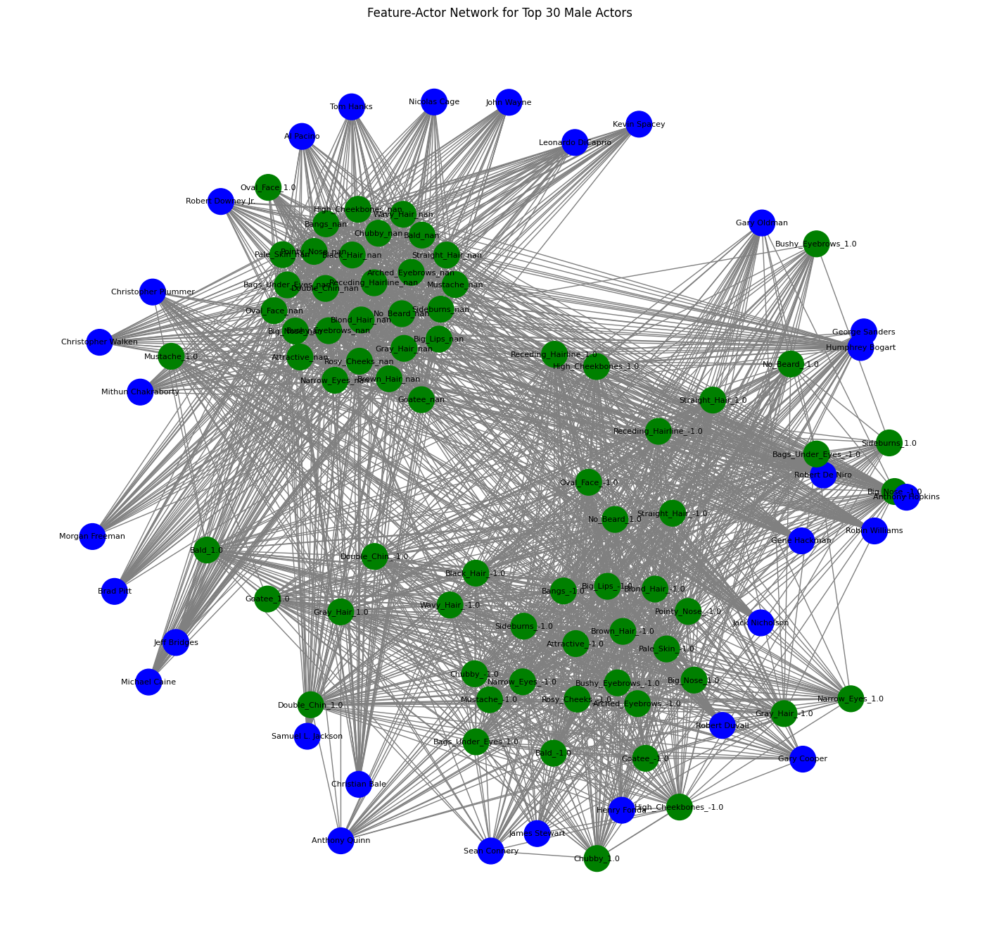

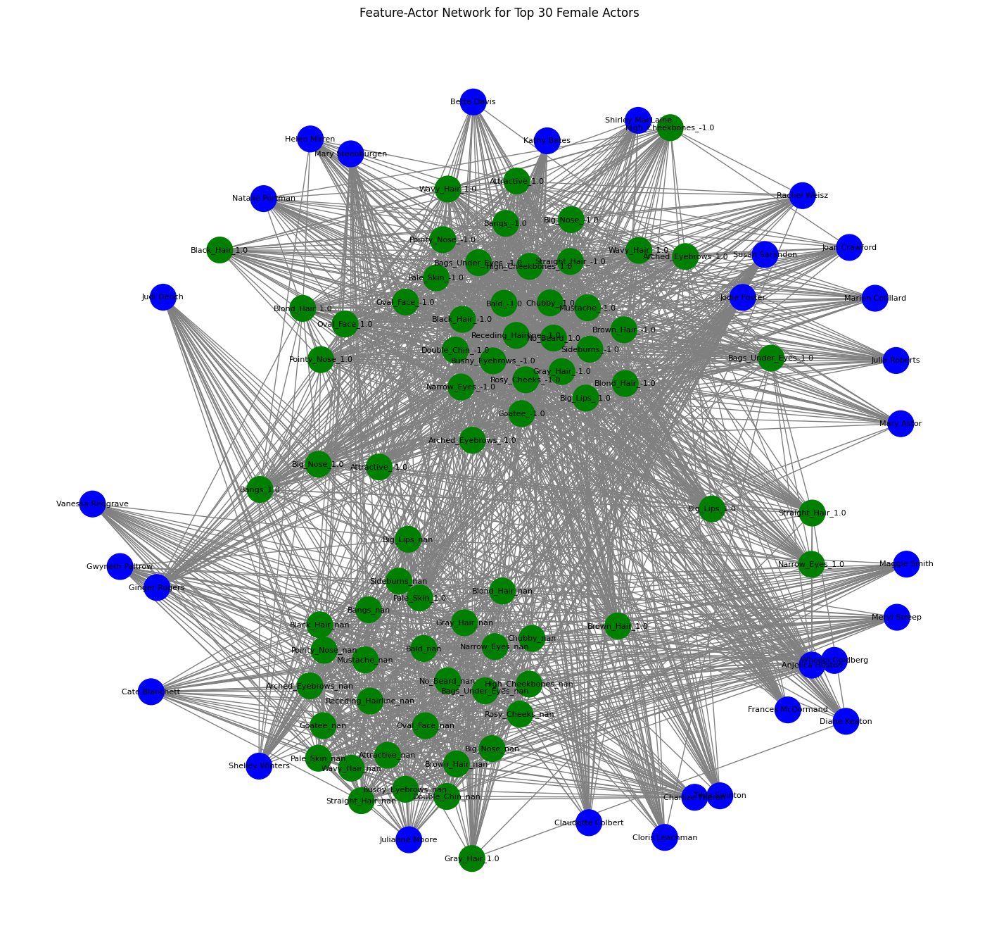

In [79]:
top_male_actors = final_actors[final_actors['ActorGender'] == 'M'].nlargest(30, 'Score_PCA_2_scaled')
top_female_actors = final_actors[final_actors['ActorGender'] == 'F'].nlargest(30, 'Score_PCA_2_scaled')

features = [
    'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
    'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee',
    'Gray_Hair', 'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
    'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Straight_Hair', 'Wavy_Hair'
]

def create_gender_specific_network(data, gender_label):
    G = nx.Graph()

    for index, row in data.iterrows():
        actor_node = row['ActorName']
        G.add_node(actor_node, type='actor', score=row['Score_PCA_2_scaled'])
        
        actor_features = []
        for feature in features:
            feature_node = f"{feature}_{row[feature]}"
            G.add_node(feature_node, type='feature', value=row[feature])
            
            G.add_edge(actor_node, feature_node)
            actor_features.append(feature_node)
        
        for i in range(len(actor_features)):
            for j in range(i + 1, len(actor_features)):
                if G.has_edge(actor_features[i], actor_features[j]):
                    G[actor_features[i]][actor_features[j]]['weight'] += 1
                else:
                    G.add_edge(actor_features[i], actor_features[j], weight=1)

    plt.figure(figsize=(14, 13))
    pos = nx.spring_layout(G, k=2.5, seed=42)
    node_colors = ['blue' if G.nodes[node]['type'] == 'actor' else 'green' for node in G.nodes()]

    nx.draw(
        G, pos, with_labels=True, node_size=700, node_color=node_colors, edge_color='gray', font_size=8
    )
    plt.title(f"Feature-Actor Network for Top 30 {gender_label} Actors")
    plt.show()

# Plot for top 30 most successful male actors
create_gender_specific_network(top_male_actors, "Male")

# Plot for top 30 most successful female actors
create_gender_specific_network(top_female_actors, "Female")



## Both Genders

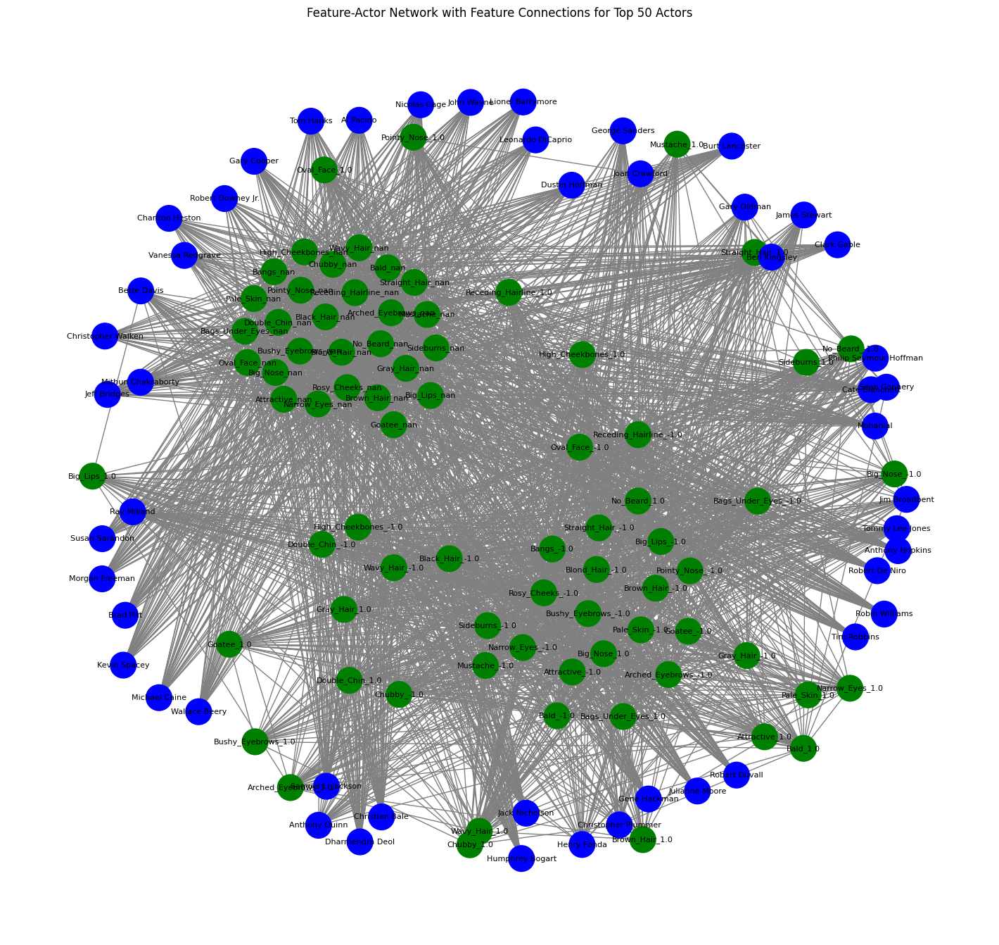

In [80]:
top_actors = final_actors.nlargest(50, 'Score_PCA_2_scaled')

G = nx.Graph()

for index, row in top_actors.iterrows():
    actor_node = row['ActorName']  
    G.add_node(actor_node, type='actor', score=row['Score_PCA_2_scaled'])
    
    actor_features = []
    for feature in features:
        feature_node = f"{feature}_{row[feature]}"
        G.add_node(feature_node, type='feature', value=row[feature])
        
        G.add_edge(actor_node, feature_node)
        actor_features.append(feature_node)
    
    for i in range(len(actor_features)):
        for j in range(i + 1, len(actor_features)):
            if G.has_edge(actor_features[i], actor_features[j]):
                G[actor_features[i]][actor_features[j]]['weight'] += 1
            else:
                G.add_edge(actor_features[i], actor_features[j], weight=1)

plt.figure(figsize=(14, 13))

pos = nx.spring_layout(G,k=3, seed=42)

node_colors = ['blue' if G.nodes[node]['type'] == 'actor' else 'green' for node in G.nodes()]

nx.draw(
    G, pos, with_labels=True, node_size=700, node_color=node_colors, edge_color='gray', font_size=8
)

plt.title("Feature-Actor Network with Feature Connections for Top 50 Actors")
plt.show()

---
---
## 4. Ali's part

### **GMM** (Gaussian Mixture Models) & **MLP** (Multi-Layer Perceptron)

#### 1. First clean on the data to adapt it to our needs

In [32]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.inspection import permutation_importance

In [2]:
# Replace 'final_actors_19_12_2024.pkl' with the path to your pickle file if it's in a different directory
dataset = pd.read_pickle('final_actors_19_12_2024.pkl')

# Display the first few rows to confirm it loaded correctly
dataset.columns

Index(['ActorName', 'ActorDOB', 'ActorGender', 'ActorAgeAtRelease',
       'Characters', 'primaryProfession', 'new_id', 'Countries',
       'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled',
       'Score_PCA_2_scaled', 'top_3_countries', 'top_3_genre',
       'socioeconomic_background', 'education_level',
       'early_life_opportunities', 'ActorHeight', 'Arched_Eyebrows',
       'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
       'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Straight_Hair', 'Wavy_Hair', 'professionCategory'],
      dtype='object')

In [3]:
dataset.drop(columns= ['Characters', 'new_id', 'Countries', 'YearOfRelease', 'ratings', 'numVotes', 'Genres', 'Runtime',
       'year_ceremony', 'Oscar', 'NumMovies', 'AvgRating', 'TotalVotes',
       'OscarEncoded', 'Score_PCA', 'Score_PCA_2', 'Score_PCA_scaled', 'primaryProfession'], inplace= True)

### Gaussian Mixture models

#### For GMM, which assumes continuous numeric inputs, we need to transform or drop categorical variables so they become meaningful numeric inputs.
#### We then decide to exclude CelebA dataset for this GMM specific analysis

In [8]:
# We select features we want
dataset_SB = dataset[['ActorName', 'ActorDOB', 'ActorGender',
       'socioeconomic_background', 'education_level', 'early_life_opportunities', 'professionCategory',
       'Score_PCA_2_scaled', 'ActorHeight', 'top_3_genre', 'top_3_countries']]

In [9]:
# Calculate the percentage of NaN values for each column
nan_percentage = dataset_SB.isna().mean() * 100

# Display the result
print(nan_percentage)

ActorName                    0.000000
ActorDOB                    40.669479
ActorGender                 27.455191
socioeconomic_background     0.000000
education_level              0.000000
early_life_opportunities     0.000000
professionCategory           0.000000
Score_PCA_2_scaled           0.000000
ActorHeight                 67.758142
top_3_genre                  0.000000
top_3_countries              0.000000
dtype: float64


#### We process and adapt a bit the features, and we fill the Nan values

In [10]:
# 1. For ActorDOB:
#    - Extract only the year from the date.
#    - Convert to float.
#    - Fill missing values with the mean.
# Explanation:
# We try converting ActorDOB to datetime. If it fails, we get NaT (missing).
# From the datetime object, we extract the year.
# Then we convert that year to float.
# Finally, we fill in missing values with the mean of the column.

dataset_SB['ActorDOB'] = pd.to_datetime(dataset_SB['ActorDOB'], errors='coerce').dt.year
dataset_SB['ActorDOB'] = dataset_SB['ActorDOB'].astype(float)
dataset_SB['ActorDOB'].fillna(dataset_SB['ActorDOB'].mean(), inplace=True)

# 2. For ActorGender:
#    - Fill missing values with the mode.
# Explanation:
# The mode is the most frequent value. Using .mode()[0] gives the top value.

dataset_SB['ActorGender'].fillna(dataset_SB['ActorGender'].mode()[0], inplace=True)

# 3. For ActorHeight:
#    - Fill missing values with the mean.
# Explanation:
# Ensure ActorHeight is numeric. If not numeric, convert it. Then fill with mean.

dataset_SB['ActorHeight'] = pd.to_numeric(dataset_SB['ActorHeight'], errors='coerce')
dataset_SB['ActorHeight'].fillna(dataset_SB['ActorHeight'].mean(), inplace=True)

# Remove rows where ActorHeight is greater than 2.50
# This filters out outlier heights that don't seem realistic.
dataset_SB = dataset_SB[dataset_SB['ActorHeight'] <= 2.50]

# 4. For top_3_genres:
#    - Rename it to top_1_genre.
#    - Keep only the first genre.
#    - Genre strings may have extra spaces after commas, so strip them.
#    - Fill missing values with the mode.
# Explanation:
# First rename the column. Then split each entry by ',', take the first element,
# strip whitespace, and handle missing values by filling with mode.

def first_from_list_or_nan(x):
    # If x is a list and has at least one element
    if isinstance(x, list) and len(x) > 0:
        val = x[0].strip()
        return val if val else np.nan
    # Otherwise return NaN
    return np.nan

# Rename top_3_genre to top_1_genre and process
dataset_SB.rename(columns={'top_3_genre': 'top_1_genre'}, inplace=True)
dataset_SB['top_1_genre'] = dataset_SB['top_1_genre'].apply(first_from_list_or_nan)
dataset_SB['top_1_genre'].fillna(dataset_SB['top_1_genre'].mode()[0], inplace=True)

# 5. For top_3_countries:
#    - Rename it to top_1_country.
#    - Keep only the first country.
#    - Handle possible spaces.
#    - Fill missing values with mode.
# Explanation:
# Similar to genres, split by ',' take first, strip spaces, fill with mode.

# Rename top_3_countries to top_1_country and process
dataset_SB.rename(columns={'top_3_countries': 'top_1_country'}, inplace=True)
dataset_SB['top_1_country'] = dataset_SB['top_1_country'].apply(first_from_list_or_nan)
dataset_SB['top_1_country'].fillna(dataset_SB['top_1_country'].mode()[0], inplace=True)

/var/folders/v6/m1n7zxts363fm8n_2ftwmgm80000gn/T/ipykernel_23681/3585886426.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_SB['ActorDOB'] = pd.to_datetime(dataset_SB['ActorDOB'], errors='coerce').dt.year
/var/folders/v6/m1n7zxts363fm8n_2ftwmgm80000gn/T/ipykernel_23681/3585886426.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_SB['ActorDOB'] = dataset_SB['ActorDOB'].astype(float)
/var/folders/v6/m1n7zxts363fm8n_2ftwmgm80000gn/T/ipykernel_23681/3585886426.py:13: FutureWarning: A val

We verify that there's no more Nans :

In [11]:
# Calculate the percentage of NaN values for each column
nan_percentage = dataset_SB.isna().mean() * 100

# Display the result
print(nan_percentage)

ActorName                   0.0
ActorDOB                    0.0
ActorGender                 0.0
socioeconomic_background    0.0
education_level             0.0
early_life_opportunities    0.0
professionCategory          0.0
Score_PCA_2_scaled          0.0
ActorHeight                 0.0
top_1_genre                 0.0
top_1_country               0.0
dtype: float64


Great !

Now we'll reduce and simplify the different possible categories for top_1_genre and top_1_country to be able to hot econde them without explosion :

In [12]:
# Count the number of occurrences of each category in top_1_genre
print("Value counts for top_1_genre:")
print(dataset_SB['top_1_genre'].value_counts(dropna=False))

print("--------------------------------------------------")

# Count the number of occurrences of each category in top_1_country
print("Value counts for top_1_country:")
print(dataset_SB['top_1_country'].value_counts(dropna=False))

Value counts for top_1_genre:
top_1_genre
Drama                   43058
Comedy                  29473
Thriller                 8385
Action                   5880
Mystery                  4199
                        ...  
Workplace Comedy            1
Wuxia                       1
Extreme Sports              1
Kitchen sink realism        1
Inspirational Drama         1
Name: count, Length: 195, dtype: int64
--------------------------------------------------
Value counts for top_1_country:
top_1_country
United States of America                    72337
France                                       7060
United Kingdom                               6284
India                                        4526
Japan                                        2911
                                            ...  
Afghanistan                                     4
Socialist Federal Republic of Yugoslavia        3
Crime                                           2
Scotland                                  

What we do now :

- ActorName --> we naturally drop it, not needed

- ActorDOB --> no change, already numeric

- ActorGender --> we convert to numeric binary (Male=1, Female=0), it introduces a slight non-Gaussian distribution, but it’s simple and won’t add too much complexity.

- socioeconomic_background --> we encode as numeric ranks (0,1,2)

- education_level --> we encode as numeric ranks (0,1,2)

- early_life_opportunities --> we encode as numeric ranks (0,1,2)

- ActorHeight --> no change, already numeric

- top_1_genre --> we reduce the number of categories (less than 10), then one-hot encode. Again it introduces a slight non-Gaussian distribution but won’t add too much complexity.

- top_1_country --> same as the one before

- professionCategory --> --> we convert to numeric binary (otherOcc=1, ActingOcc=0)

In [14]:
# 1. Keep a copy of ActorName and any other columns you don't want to lose
actor_name_series = dataset_SB['ActorName']

# 2. Drop ActorName from the GMM dataset
data_for_gmm = dataset_SB.drop(columns=['ActorName', 'Score_PCA_2_scaled'])  # Dropping Score_PCA_2_scaled as indicated

# 3. ActorDOB is already numeric from previous steps. No change needed.

# 4. ActorGender: Convert to binary (M=1, F=0)
data_for_gmm['ActorGender'] = data_for_gmm['ActorGender'].map({'M': 1, 'F': 0})

# 5. socioeconomic_background as numeric ranks:
#    Suppose: Underprivileged=0, MiddleIncome=1, Privileged=2
so_map = {'Underprivileged':0, 'MiddleIncome':1, 'Privileged':2}
#data_for_gmm = pd.get_dummies(data_for_gmm, columns=['socioeconomic_background'], prefix='socioeconomic_background')
data_for_gmm['socioeconomic_background'] = data_for_gmm['socioeconomic_background'].map(so_map)

# 6. education_level as numeric ranks:
#    Suppose: InformallyEducated=0, FormallyEducated=1, HighlyEducated=2
edu_map = {'InformallyEducated':0, 'FormallyEducated':1, 'HighlyEducated':2}
data_for_gmm['education_level'] = data_for_gmm['education_level'].map(edu_map)
#data_for_gmm = pd.get_dummies(data_for_gmm, columns=['education_level'], prefix='education_level')

# 7. early_life_opportunities as numeric ranks:
#    Suppose: FacedSignificantAdversity=0, Ordinary=1, PrivilegedStart=2
op_map = {'FacedSignificantAdversity':0, 'Ordinary':1, 'PrivilegedStart':2}
data_for_gmm['early_life_opportunities'] = data_for_gmm['early_life_opportunities'].map(op_map)
# data_for_gmm = pd.get_dummies(data_for_gmm, columns=['early_life_opportunities'], prefix='early_life_opportunities')

# 8. ActorHeight is already numeric and filled. No change.

# 9. top_1_genre: reduce categories.
#    Let's find the top 10 categories and label the rest as "Other".
genre_counts = data_for_gmm['top_1_genre'].value_counts()
top_genres = genre_counts.index[:10]  # top 10 categories
data_for_gmm['top_1_genre'] = data_for_gmm['top_1_genre'].apply(lambda x: x if x in top_genres else 'Other')

# One-hot encode top_1_genre
data_for_gmm = pd.get_dummies(data_for_gmm, columns=['top_1_genre'], prefix='genre')

# 10. top_1_country: do the same reduction.
country_counts = data_for_gmm['top_1_country'].value_counts()
top_countries = country_counts.index[:8]  # top 8 categories
data_for_gmm['top_1_country'] = data_for_gmm['top_1_country'].apply(lambda x: x if x in top_countries else 'Other')

# One-hot encode top_1_country
data_for_gmm = pd.get_dummies(data_for_gmm, columns=['top_1_country'], prefix='country')

# 11. professionCategory

data_for_gmm['professionCategory'] = data_for_gmm['professionCategory'].map({'otherOcc': 1, 'ActingOcc': 0})


# ----------------------------------------------
# SCALE THE FEATURES
# ----------------------------------------------
# Since GMM is sensitive to scale, we scale all features now.
# may seem counterintuitive, scaling is a common practice when using GMM because it ensures that all features (whether originally numeric or converted from categorical)
# are treated on the same footing in terms of magnitude.

# Create a scaler
scaler = StandardScaler()

# Fit and transform the data_for_gmm
scaled_data = scaler.fit_transform(data_for_gmm)

# Convert back to a DataFrame so that we can visualize
scaled_df = pd.DataFrame(scaled_data, columns=data_for_gmm.columns, index=data_for_gmm.index)

In [15]:
scaled_df.sample(2) # we verify

,ActorDOB,ActorGender,socioeconomic_background,education_level,early_life_opportunities,professionCategory,ActorHeight,genre_Action,genre_Adventure,genre_Comedy,...,genre_World cinema,country_Australia,country_Canada,country_France,country_India,country_Italy,country_Japan,country_Other,country_United Kingdom,country_United States of America
115402,-3.719765e-14,-1.649022,0.700343,-0.31209,0.335458,0.937855,-0.684593,-0.227765,-0.118354,1.745058,...,-0.129719,-0.126198,-0.134549,-0.250884,-0.198645,-0.130119,-0.1582,-0.450749,-0.235881,0.805101
29272,-3.719765e-14,0.606420,0.700343,-0.31209,0.335458,-1.066263,1.360974,-0.227765,-0.118354,-0.573047,...,-0.129719,-0.126198,-0.134549,-0.250884,-0.198645,-0.130119,-0.1582,-0.450749,-0.235881,0.805101


### Now we run GMM

We run GMM multiple times with different values of n_clusters (from 2 to 10) and calculate the BIC and AIC for each model.

In [17]:
# ----------------------------------------------
# RUN GMM
# ----------------------------------------------
from sklearn.mixture import GaussianMixture

ks = range(2, 11)
results = []
for k in ks:
    gmm_test = GaussianMixture(n_components=k, random_state=42)
    gmm_test.fit(scaled_df)
    results.append((k, gmm_test.bic(scaled_df), gmm_test.aic(scaled_df)))
    
# AIC/BIC are criteria used to compare models: lower values typically indicate a better fit.
# As the number of clusters (n_components) increases, both BIC and AIC become more negative (lower), suggesting that the model with more clusters fits the data better.
# but we chould not use a too large number of clusters, even if BIC and AIC tend to be lower, because we risk overfitting

results_df = pd.DataFrame(results, columns=['n_clusters', 'BIC', 'AIC'])
print(results_df)

   n_clusters           BIC           AIC
0           2 -3.404647e+06 -3.412504e+06
1           3 -5.324983e+06 -5.336775e+06
2           4 -6.630045e+06 -6.645770e+06
3           5 -8.387405e+06 -8.407064e+06
4           6 -9.442394e+06 -9.465986e+06
5           7 -1.042357e+07 -1.045109e+07
6           8 -1.175065e+07 -1.178211e+07
7           9 -1.277410e+07 -1.280949e+07
8          10 -1.390177e+07 -1.394109e+07


Let's go for 4 clusters, seems reasonable following what we saw and said earlier :

Distribution of Score_PCA_2_scaled by Cluster:
           count      mean       std       min       25%       50%       75%  \
Cluster                                                                        
0         2409.0  0.897066  0.280267  0.149649  0.743609  0.899970  1.069835   
1        44285.0  1.116138  0.282907  0.000000  0.970930  1.136087  1.274159   
2        29473.0  1.125807  0.355746  0.082706  0.968598  1.120349  1.252952   
3        43058.0  1.298106  0.546926  0.000001  1.095822  1.225664  1.350054   

               max  
Cluster             
0         5.983223  
1         8.336419  
2         8.160130  
3        10.000000  


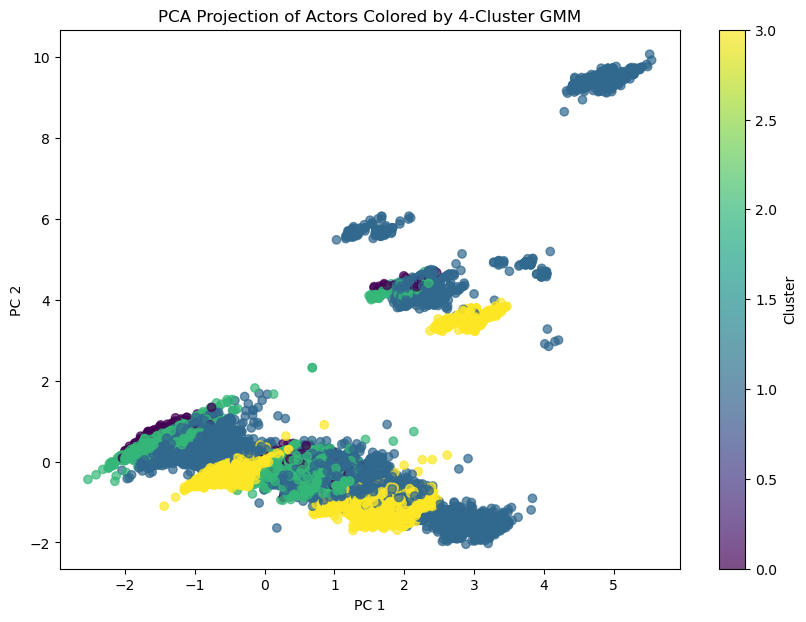

In [20]:
# ----------------------------------------------
# 1. Run GMM with the chosen number of clusters (n_clusters = 4)
# ----------------------------------------------
n_clusters = 4
gmm_4 = GaussianMixture(n_components=n_clusters, random_state=30)
gmm_labels_4 = gmm_4.fit_predict(scaled_df)

# Add cluster labels to the original dataset and the scaled dataset
dataset_SB['Cluster'] = gmm_labels_4
scaled_df['Cluster'] = gmm_labels_4

# Also merge with data_for_gmm so we have one-hot encoded columns plus cluster labels if needed
merged_df = data_for_gmm.join(dataset_SB['Cluster'])

# ----------------------------------------------
# 2. Let's see the distribution of Score_PCA_2_scaled by cluster:
# ----------------------------------------------
print("Distribution of Score_PCA_2_scaled by Cluster:")
print(dataset_SB.groupby('Cluster')['Score_PCA_2_scaled'].describe())

# ----------------------------------------------
# 3. Perform a PCA projection for visualization
#    We'll reduce to 2 components for a scatter plot.
# ----------------------------------------------
pca = PCA(n_components=2)
pca_coords = pca.fit_transform(scaled_df.drop(columns=['Cluster']))  # Drop cluster column when fitting PCA

# Plot the PCA projection, coloring points by cluster
plt.figure(figsize=(10,7))
scatter = plt.scatter(pca_coords[:, 0], pca_coords[:, 1], c=scaled_df['Cluster'], cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('PCA Projection of Actors Colored by 4-Cluster GMM')
plt.show()

Some clusters (like Cluster 1) have a higher maximum value of Score_PCA_2_scaled than others, suggesting that certain clusters may include actors with more extreme Score_PCA_2_scaled values.

The range of values suggests each cluster may represent slightly different portions of the Score_PCA_2_scaled distribution.

However, just looking at Score_PCA_2_scaled does not tell us what really differentiates these clusters in terms of other features.

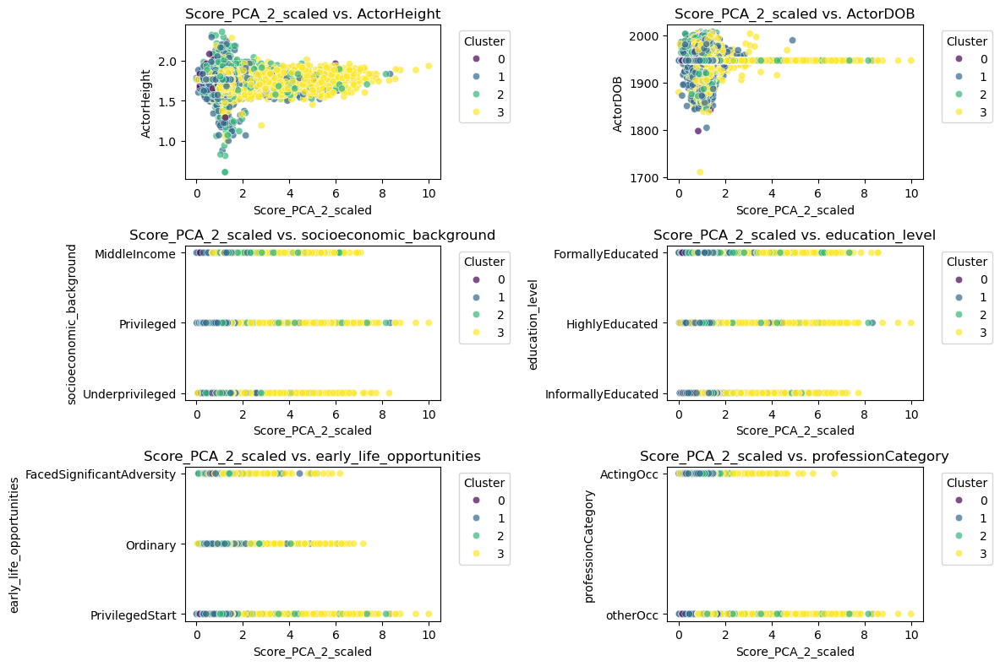

In [22]:
# The features we want to plot against Score_PCA2_scaled
features = [
    'ActorHeight',
    'ActorDOB',
    'socioeconomic_background',
    'education_level',
    'early_life_opportunities',
    'professionCategory'
]

# Number of rows and columns in our subplot grid
n_cols = 2
n_rows = (len(features) + 1) // n_cols

plt.figure(figsize=(12, 8))

for i, feat in enumerate(features, start=1):
    plt.subplot(n_rows, n_cols, i)
    sns.scatterplot(x='Score_PCA_2_scaled', y=feat, hue='Cluster', data=dataset_SB, alpha=0.7, palette='viridis')
    plt.title(f'Score_PCA_2_scaled vs. {feat}')
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    # If you want to handle discrete (ordinal) features as categorical, you could convert them using:
    # dataset_SB[feat] = dataset_SB[feat].astype('category')

plt.tight_layout()
plt.show()

These scatter plots show that the three clusters overlap significantly across these dimensions. Even when viewed by features like actor height, birth year, socioeconomic background, education level, early life opportunities, or professionCtegory, the clusters do not separate into clearely distinct, easily interpretable groups. We can see only some medium patterns and differences. This suggests that none of these individual attributes alone explain the differences between clusters, indicating that the clustering likely arises from more complex interactions among multiple features.

##### We will now work with deep learnign methods to further study our dataset, namely MLP

## **MLP**

In [23]:
# We take back what we derived in the first part of GMM and adapt further
dataset_SB = dataset_SB.drop(columns=['ActorName', 'Cluster'])
print(dataset_SB.sample(8))

           ActorDOB ActorGender socioeconomic_background     education_level  \
100886  1953.000000           M               Privileged      HighlyEducated   
118075  1946.075776           F               Privileged      HighlyEducated   
22519   1946.075776           F               Privileged    FormallyEducated   
43362   1887.000000           M               Privileged      HighlyEducated   
116160  1946.075776           M          Underprivileged      HighlyEducated   
24880   1946.075776           M             MiddleIncome  InformallyEducated   
113376  1946.075776           F          Underprivileged    FormallyEducated   
161     1946.075776           M               Privileged  InformallyEducated   

       early_life_opportunities professionCategory  Score_PCA_2_scaled  \
100886          PrivilegedStart           otherOcc            1.179820   
118075          PrivilegedStart           otherOcc            1.237143   
22519                  Ordinary          ActingOcc       

In [25]:
# Separate features (X) and target (y)
y = dataset_SB['Score_PCA_2_scaled'].values

# Scale target from [0,10] to [0,50] for better precision!
y = y * 5

# Convert target to integers (for classification)
y = y.astype(int)

X = dataset_SB.drop(columns=['Score_PCA_2_scaled'])

# Reduce categories for top_1_genre
genre_counts = X['top_1_genre'].value_counts()
top_genres = genre_counts.index[:10]  # top 10 categories
X['top_1_genre'] = X['top_1_genre'].apply(lambda x: x if x in top_genres else 'Other')

# Reduce categories for top_1_country
country_counts = X['top_1_country'].value_counts()
top_countries = country_counts.index[:10]  # top 10 categories
X['top_1_country'] = X['top_1_country'].apply(lambda x: x if x in top_countries else 'Other')

# One-hot encode categorical variables
cat_cols = ['ActorGender', 'socioeconomic_background', 'education_level', 
            'early_life_opportunities', 'top_1_genre', 'top_1_country', 'professionCategory']

X = pd.get_dummies(X, columns=cat_cols, drop_first=True)

# Ensure numeric columns are numeric
X['ActorDOB'] = pd.to_numeric(X['ActorDOB'], errors='coerce')
X['ActorHeight'] = pd.to_numeric(X['ActorHeight'], errors='coerce')

In [26]:
# Split the data: 80% train, 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train MLP classifier
mlp = MLPClassifier(hidden_layer_sizes=(64, 64), activation='relu', solver='adam', 
                    random_state=42, max_iter=200)
mlp.fit(X_train_scaled, y_train)

# Predictions on test and train sets
y_pred = mlp.predict(X_test_scaled)
y_train_pred = mlp.predict(X_train_scaled)

# Print classification metrics for test set
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Test Precision:", precision_score(y_test, y_pred, average='weighted'))
print("Test Recall:", recall_score(y_test, y_pred, average='weighted'))
print("Test F1 Score:", f1_score(y_test, y_pred, average='weighted'))

# Print classification metrics for train set
print("Train Accuracy:", accuracy_score(y_train, y_train_pred))
print("Train Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Train Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("Train F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))

/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined

Test Accuracy: 0.35470748584608935
Test Precision: 0.3130701845746259
Test Recall: 0.35470748584608935
Test F1 Score: 0.3055573151528985
Train Accuracy: 0.3891696372405116
Train Precision: 0.3749304684162348
Train Recall: 0.3891696372405116
Train F1 Score: 0.3385578907683645


--> Results are not as strong as expected, let's plot the distribution of labels and try to see if it could have a link

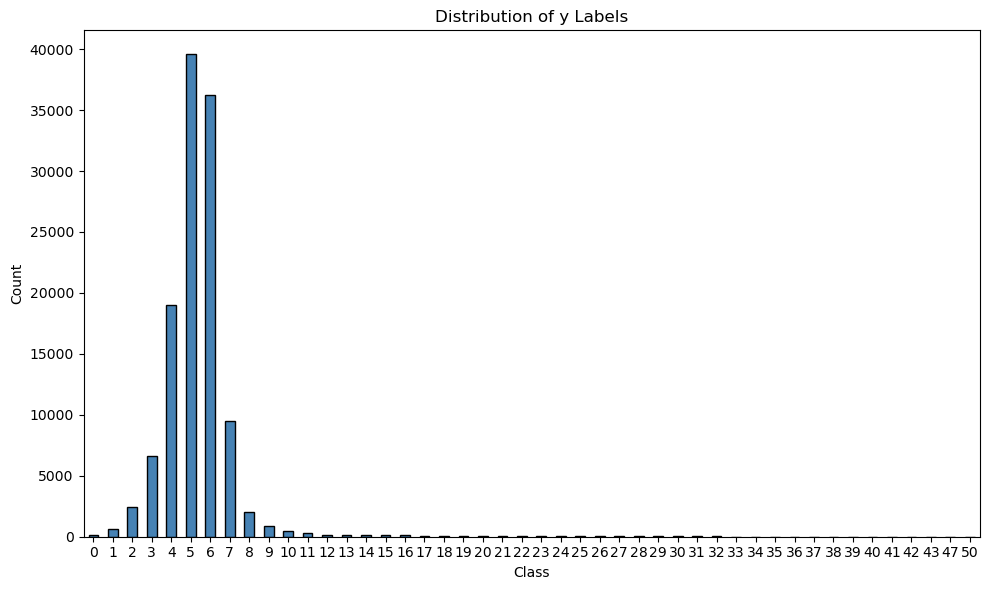

In [28]:
y_series = pd.Series(y)
value_counts = y_series.value_counts().sort_index()

plt.figure(figsize=(10,6))
value_counts.plot(kind='bar', color='steelblue', edgecolor='black')
plt.title('Distribution of y Labels')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

We can see that our distribution is skewed, the values taken are not spread enough but rather concentrated into a small place only, reducing precison and very probably mistaking results.

--> We'll take the log of the score and try to potentially have better results

## MLP with log of Score_PCA_2_scaled

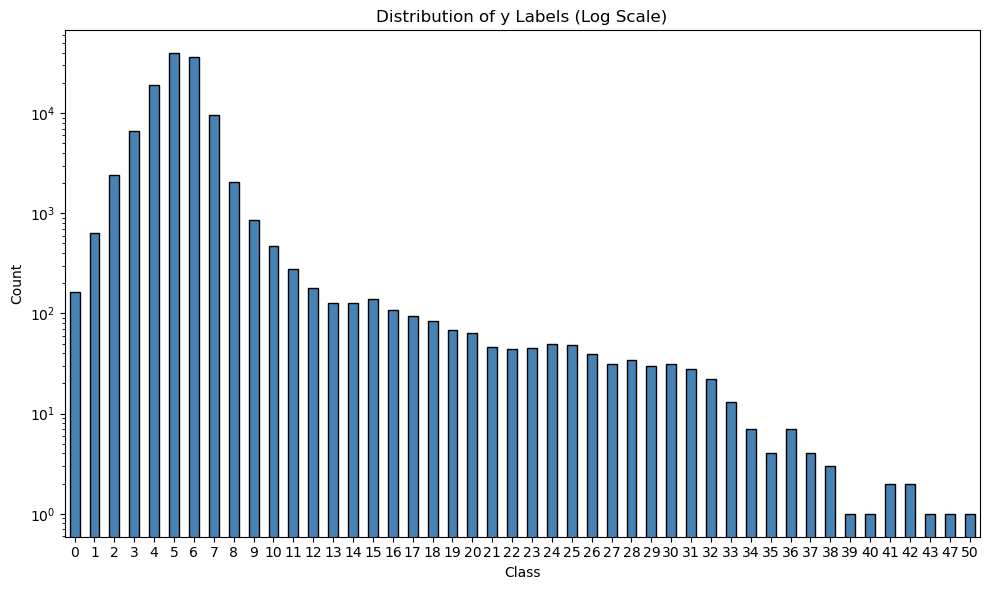

In [29]:
plt.figure(figsize=(10,6))
value_counts.plot(kind='bar', color='steelblue', edgecolor='black')
plt.title('Distribution of y Labels (Log Scale)')
plt.xlabel('Class')
plt.ylabel('Count')
plt.yscale('log')  # Apply log scale to make smaller values visible
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [30]:
# Separate features (X) and target (y)
y = dataset_SB['Score_PCA_2_scaled'].values

# Scale target from [0,10] to [0,50]
y = y * 5

# Apply log transform (using log1p to avoid log(0))
y = np.log1p(y)

# Convert target to integers (for classification)
y = y.astype(int)

X = dataset_SB.drop(columns=['Score_PCA_2_scaled'])

# Reduce categories for top_1_genre
genre_counts = X['top_1_genre'].value_counts()
top_genres = genre_counts.index[:10]  # top 10 categories
X['top_1_genre'] = X['top_1_genre'].apply(lambda x: x if x in top_genres else 'Other')

# Reduce categories for top_1_country
country_counts = X['top_1_country'].value_counts()
top_countries = country_counts.index[:10]  # top 10 categories
X['top_1_country'] = X['top_1_country'].apply(lambda x: x if x in top_countries else 'Other')

# One-hot encode categorical variables
cat_cols = ['ActorGender', 'socioeconomic_background', 'education_level', 
            'early_life_opportunities', 'top_1_genre', 'top_1_country', 'professionCategory']

X = pd.get_dummies(X, columns=cat_cols, drop_first=True)

# Ensure numeric columns are numeric
X['ActorDOB'] = pd.to_numeric(X['ActorDOB'], errors='coerce')
X['ActorHeight'] = pd.to_numeric(X['ActorHeight'], errors='coerce')

In [31]:
# Split the data: 80% train, 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train MLP classifier
mlp = MLPClassifier(hidden_layer_sizes=(64, 64), activation='relu', solver='adam', 
                    random_state=42, max_iter=250)
mlp.fit(X_train_scaled, y_train)

# Predictions on test and train sets
y_pred = mlp.predict(X_test_scaled)
y_train_pred = mlp.predict(X_train_scaled)

# Print classification metrics for test set
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Test Precision:", precision_score(y_test, y_pred, average='weighted'))
print("Test Recall:", recall_score(y_test, y_pred, average='weighted'))
print("Test F1 Score:", f1_score(y_test, y_pred, average='weighted'))

# Print classification metrics for train set
print("Train Accuracy:", accuracy_score(y_train, y_train_pred))
print("Train Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Train Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("Train F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))

Test Accuracy: 0.7175089117215349
Test Precision: 0.6814442211539843
Test Recall: 0.7175089117215349
Test F1 Score: 0.6848318766771232
Train Accuracy: 0.7515726567414552
Train Precision: 0.7310620281651442
Train Recall: 0.7515726567414552
Train F1 Score: 0.7231746485742614


/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


We actually obtain way better results now ! Let's visualize this.

#### 1. Bar Chart Comparing Train vs. Test Scores

<Figure size 1000x600 with 0 Axes>

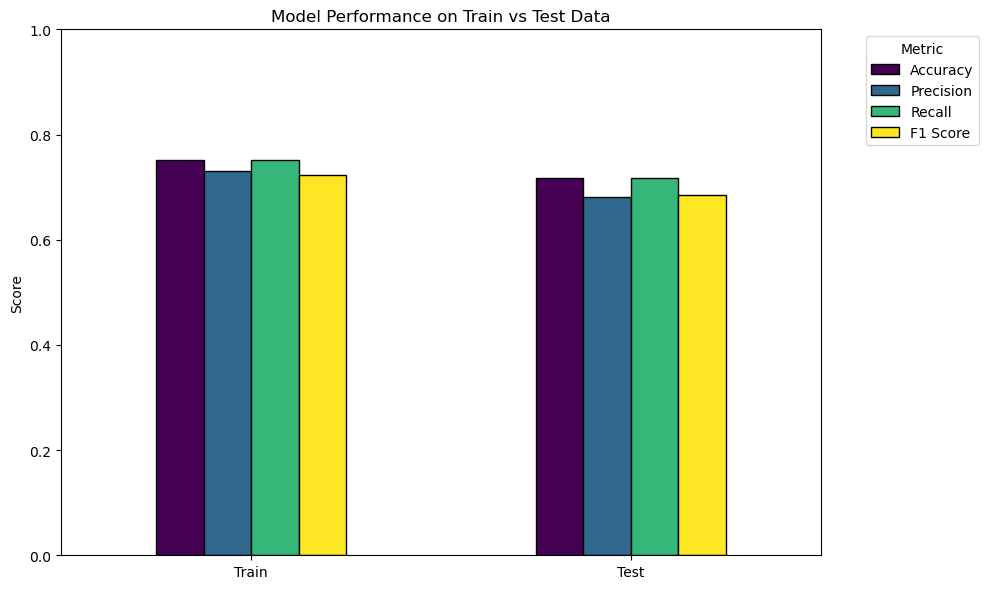

In [33]:
# Metrics as a dictionary
metrics_data = {
    'Accuracy': [accuracy_score(y_train, y_train_pred), accuracy_score(y_test, y_pred)],
    'Precision': [precision_score(y_train, y_train_pred, average='weighted'), precision_score(y_test, y_pred, average='weighted')],
    'Recall': [recall_score(y_train, y_train_pred, average='weighted'), recall_score(y_test, y_pred, average='weighted')],
    'F1 Score': [f1_score(y_train, y_train_pred, average='weighted'), f1_score(y_test, y_pred, average='weighted')]
}

metrics_df = pd.DataFrame(metrics_data, index=['Train', 'Test'])

plt.figure(figsize=(10,6))
metrics_df.plot(kind='bar', rot=0, figsize=(10,6), colormap='viridis', edgecolor='black')
plt.title('Model Performance on Train vs Test Data')
plt.ylabel('Score')
plt.ylim(0, 1)  # since metrics are between 0 and 1
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Explanation:
# This shows how each metric (Accuracy, Precision, Recall, F1) differs between training and testing sets.
# It highlights if the model is overfitting (train much higher than test) or consistently performing across both sets.

#### 2. Feature Importance or Permutation Importance

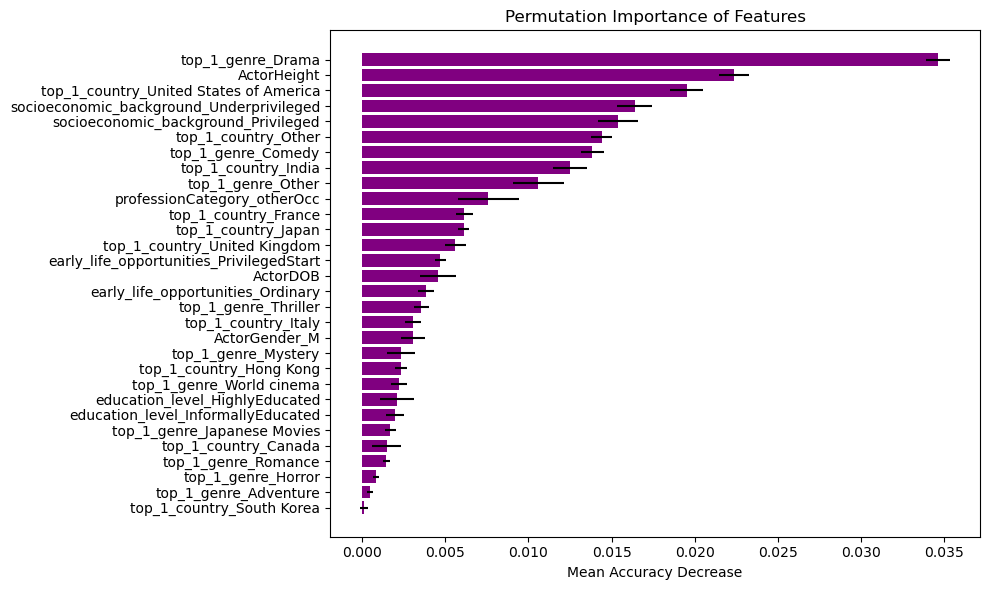

In [34]:
result = permutation_importance(mlp, X_test_scaled, y_test, scoring='accuracy', n_repeats=5, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.figure(figsize=(10,6))
plt.barh(X.columns[sorted_idx], result.importances_mean[sorted_idx], xerr=result.importances_std[sorted_idx], color='purple')
plt.title("Permutation Importance of Features")
plt.xlabel("Mean Accuracy Decrease")
plt.tight_layout()
plt.show()

# Explanation:
# This plot shows which features, when their values are shuffled, result in the largest drop in accuracy.
# It's a good way to see which features are potentially most important for classification.

### Same **MLP** study again, but with **CelebA** now :

In [37]:
dataset_wCA = dataset_SB

features = [
    'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 
    'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 
    'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 
    'High_Cheekbones', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 
    'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 
    'Sideburns', 'Straight_Hair', 'Wavy_Hair'
]

# Add each feature from dataset to dataset_wCA
for feature in features:
    dataset_wCA[feature] = dataset[feature]

In [38]:
# Calculate the percentage of NaN values for each column
nan_percentage = dataset_wCA.isna().mean() * 100

# Display the result
print(nan_percentage)

ActorDOB                     0.000000
ActorGender                  0.000000
socioeconomic_background     0.000000
education_level              0.000000
early_life_opportunities     0.000000
professionCategory           0.000000
Score_PCA_2_scaled           0.000000
ActorHeight                  0.000000
top_1_genre                  0.000000
top_1_country                0.000000
Arched_Eyebrows             96.290208
Attractive                  96.290208
Bags_Under_Eyes             96.290208
Bald                        96.290208
Bangs                       96.290208
Big_Lips                    96.290208
Big_Nose                    96.290208
Black_Hair                  96.290208
Blond_Hair                  96.290208
Brown_Hair                  96.290208
Bushy_Eyebrows              96.290208
Chubby                      96.290208
Double_Chin                 96.290208
Goatee                      96.290208
Gray_Hair                   96.290208
High_Cheekbones             96.290208
Mustache    

In [39]:
data_wCelebA_only = dataset_wCA.dropna()

In [41]:
# Calculate the percentage of NaN values for each column
nan_percentage = data_wCelebA_only.isna().mean() * 100

# Display the result
print(nan_percentage)

ActorDOB                    0.0
ActorGender                 0.0
socioeconomic_background    0.0
education_level             0.0
early_life_opportunities    0.0
professionCategory          0.0
Score_PCA_2_scaled          0.0
ActorHeight                 0.0
top_1_genre                 0.0
top_1_country               0.0
Arched_Eyebrows             0.0
Attractive                  0.0
Bags_Under_Eyes             0.0
Bald                        0.0
Bangs                       0.0
Big_Lips                    0.0
Big_Nose                    0.0
Black_Hair                  0.0
Blond_Hair                  0.0
Brown_Hair                  0.0
Bushy_Eyebrows              0.0
Chubby                      0.0
Double_Chin                 0.0
Goatee                      0.0
Gray_Hair                   0.0
High_Cheekbones             0.0
Mustache                    0.0
Narrow_Eyes                 0.0
No_Beard                    0.0
Oval_Face                   0.0
Pale_Skin                   0.0
Pointy_N

In [43]:
# Separate features (X) and target (y)
y = data_wCelebA_only['Score_PCA_2_scaled'].values

# Scale target from [0,10] to [0,50]
y = y * 5

# Apply log transform (using log1p to avoid log(0))
y = np.log1p(y)

# Convert target to integers (for classification)
y = y.astype(int)

X = data_wCelebA_only.drop(columns=['Score_PCA_2_scaled'])

# Reduce categories for top_1_genre
genre_counts = X['top_1_genre'].value_counts()
top_genres = genre_counts.index[:10]  # top 10 categories
X['top_1_genre'] = X['top_1_genre'].apply(lambda x: x if x in top_genres else 'Other')

# Reduce categories for top_1_country
country_counts = X['top_1_country'].value_counts()
top_countries = country_counts.index[:10]  # top 10 categories
X['top_1_country'] = X['top_1_country'].apply(lambda x: x if x in top_countries else 'Other')

# One-hot encode categorical variables
cat_cols = ['ActorGender', 'socioeconomic_background', 'education_level', 
            'early_life_opportunities', 'top_1_genre', 'top_1_country', 'professionCategory',
            'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips',
            'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Bushy_Eyebrows',
            'Chubby', 'Double_Chin', 'Goatee', 'Gray_Hair', 'High_Cheekbones',
            'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
            'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
            'Straight_Hair', 'Wavy_Hair']

X = pd.get_dummies(X, columns=cat_cols, drop_first=True)

# Ensure numeric columns are numeric
X['ActorDOB'] = pd.to_numeric(X['ActorDOB'], errors='coerce')
X['ActorHeight'] = pd.to_numeric(X['ActorHeight'], errors='coerce')

In [56]:
# Split the data: 80% train, 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train MLP classifier
mlp = MLPClassifier(hidden_layer_sizes=(8, 8), activation='relu', solver='adam', 
                    random_state=42, max_iter=200)
mlp.fit(X_train_scaled, y_train)

# Predictions on test and train sets
y_pred = mlp.predict(X_test_scaled)
y_train_pred = mlp.predict(X_train_scaled)

# Print classification metrics for test set
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Test Precision:", precision_score(y_test, y_pred, average='weighted'))
print("Test Recall:", recall_score(y_test, y_pred, average='weighted'))
print("Test F1 Score:", f1_score(y_test, y_pred, average='weighted'))

# Print classification metrics for train set
print("Train Accuracy:", accuracy_score(y_train, y_train_pred))
print("Train Precision:", precision_score(y_train, y_train_pred, average='weighted'))
print("Train Recall:", recall_score(y_train, y_train_pred, average='weighted'))
print("Train F1 Score:", f1_score(y_train, y_train_pred, average='weighted'))

Test Accuracy: 0.6067796610169491
Test Precision: 0.5714157042298945
Test Recall: 0.6067796610169491
Test F1 Score: 0.5875907995347208
Train Accuracy: 0.6930469191633691
Train Precision: 0.688341843146382
Train Recall: 0.6930469191633691
Train F1 Score: 0.6721610590021244


/opt/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


--> After trying various combinations, this is the best result we could have, trying to minimize overfitting (that is actually sensitive here)

--> The results are actually less good than for the analysis without CelebA, can be due to lack of data, or maybe too much noise in it.

#### 1. Bar Chart Comparing Train vs. Test Scores

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Figure size 1000x600 with 0 Axes>

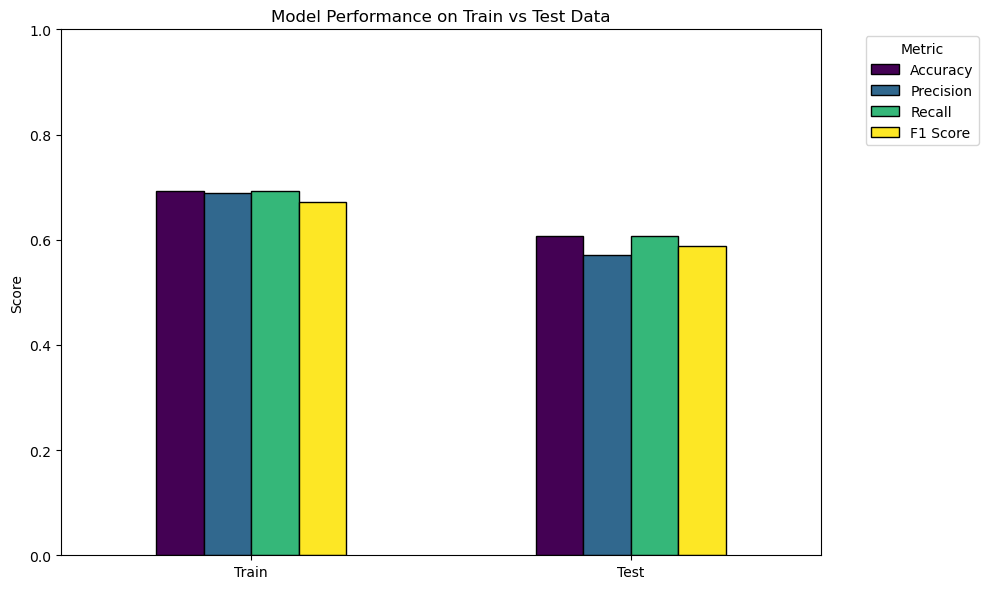

In [57]:
# Metrics as a dictionary
metrics_data = {
    'Accuracy': [accuracy_score(y_train, y_train_pred), accuracy_score(y_test, y_pred)],
    'Precision': [precision_score(y_train, y_train_pred, average='weighted'), precision_score(y_test, y_pred, average='weighted')],
    'Recall': [recall_score(y_train, y_train_pred, average='weighted'), recall_score(y_test, y_pred, average='weighted')],
    'F1 Score': [f1_score(y_train, y_train_pred, average='weighted'), f1_score(y_test, y_pred, average='weighted')]
}

metrics_df = pd.DataFrame(metrics_data, index=['Train', 'Test'])

plt.figure(figsize=(10,6))
metrics_df.plot(kind='bar', rot=0, figsize=(10,6), colormap='viridis', edgecolor='black')
plt.title('Model Performance on Train vs Test Data')
plt.ylabel('Score')
plt.ylim(0, 1)  # since metrics are between 0 and 1
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Explanation:
# This shows how each metric (Accuracy, Precision, Recall, F1) differs between training and testing sets.
# It highlights if the model is overfitting (train much higher than test) or consistently performing across both sets.

#### 2. Feature Importance or Permutation Importance

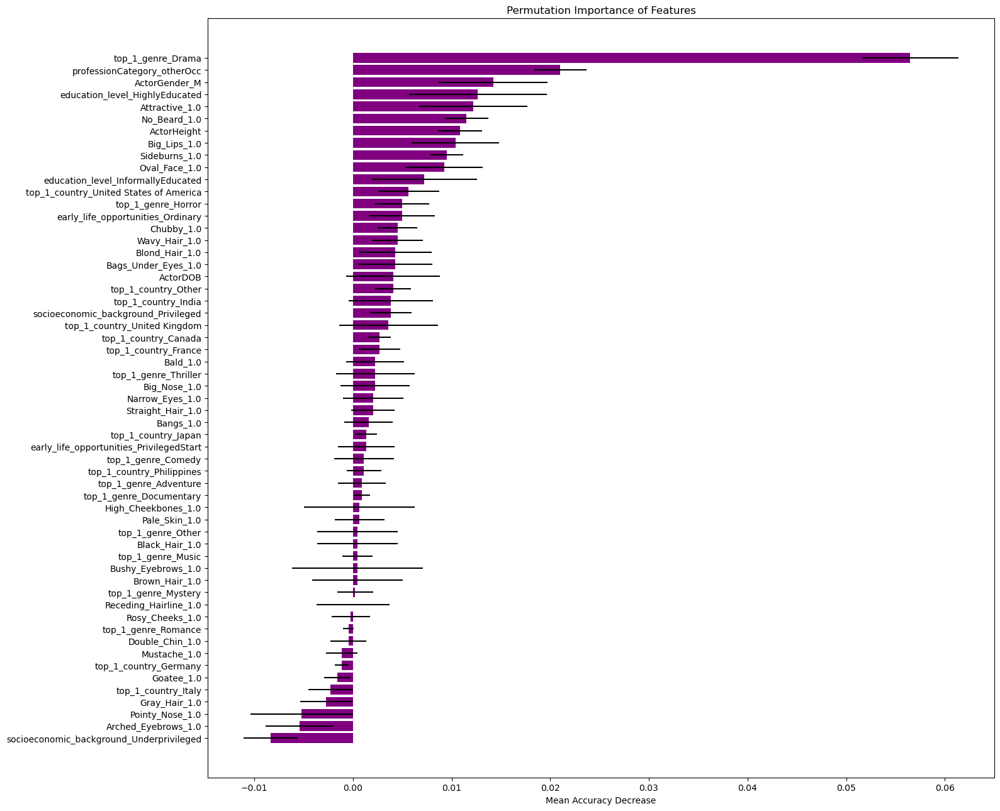

In [59]:
result = permutation_importance(mlp, X_test_scaled, y_test, scoring='accuracy', n_repeats=5, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.figure(figsize=(16,13))
plt.barh(X.columns[sorted_idx], result.importances_mean[sorted_idx], xerr=result.importances_std[sorted_idx], color='purple')
plt.title("Permutation Importance of Features")
plt.xlabel("Mean Accuracy Decrease")
plt.tight_layout()
plt.show()

# Explanation:
# This plot shows which features, when their values are shuffled, result in the largest drop in accuracy.
# It's a good way to see which features are potentially most important for classification.

---
---
## 5. Christian's part

---
---
## 6. Network Analysis

In [11]:
actors=pd.read_pickle('final_actors_19_12_2024_2.pkl')
actors

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Sideburns,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded
0,'Big' Lee,1939,M,[nan],[Junkie in Casino],actor,[23010798],[United States of America],[1973],[5.7],...,NaN,NaN,NaN,ActingOcc,0.0,1,1,0,116.000000,1
1,'Chicken' Holleman,None,None,[nan],[nan],None,[1873017],[United States of America],[1972],[6.0],...,NaN,NaN,NaN,ActingOcc,NaN,2,1,1,88.000000,1
2,'Evil' Ted Smith,None,None,[nan],[Ronnie],"art_department,actor,visual_effects","[3866200, tt7850334, tt16235342]","[United States of America,Japan, nan, nan]","[1991, 2019, 2022]","[4.9, 3.9, 4.3]",...,NaN,NaN,NaN,otherOcc,NaN,2,2,2,91.333333,0
3,'Kecske' Molnár Levente,None,M,[nan],[Ovidiu],None,[31935934],"[France,Romania,Hungary]",[2010],[6.9],...,NaN,NaN,NaN,ActingOcc,0.0,1,1,2,100.000000,1
4,'King Kong' Kashey,1903-11-28,M,[39.0],[Paj Mab's Guard #2],actor,[24051101],[United States of America],[1943],[4.5],...,NaN,NaN,NaN,ActingOcc,0.0,0,2,2,43.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119222,都はるみ,1948-02-22,F,[35.0],[nan],None,[25896239],[Japan],[1983],[6.4],...,NaN,NaN,NaN,ActingOcc,1.0,2,1,2,101.000000,1
119223,關淑怡,1966-08-15,F,"[26.0, 30.0]","[nan, nan]",None,"[26669413, 184987]","[Hong Kong, Hong Kong]","[1992, 1997]","[4.9, 7.7]",...,NaN,NaN,NaN,ActingOcc,1.0,2,2,2,90.000000,1
119224,陳文媛,1979-09-18,F,[23.0],[nan],None,[3059526],"[Thailand,Hong Kong]",[2003],[3.0],...,NaN,NaN,NaN,ActingOcc,1.0,2,0,2,90.000000,1
119225,陳曉東,1975-09-03,M,"[22.0, 36.0]","[nan, nan]",None,"[7055021, 34430625]","[Hong Kong, Singapore]","[1998, 2012]","[6.1, 5.5]",...,NaN,NaN,NaN,ActingOcc,0.0,0,2,2,118.500000,1


In [12]:
# Calculate proportion of actors with scores > 3 and > 4
proportion_above_3 = (actors['Score_PCA_2_scaled'] > 3).mean()
proportion_above_4 = (actors['Score_PCA_2_scaled'] > 4).mean()

print(f"Proportion of actors with score > 3: {proportion_above_3:.2%}")
print(f"Proportion of actors with score > 4: {proportion_above_4:.2%}")


Proportion of actors with score > 3: 0.89%
Proportion of actors with score > 4: 0.47%


In [13]:
actors['Score_PCA_2_scaled'].describe()

count    119227.000000
mean          1.179818
std           0.423699
min           0.000000
25%           1.010348
50%           1.161800
75%           1.299077
max          10.000000
Name: Score_PCA_2_scaled, dtype: float64

In [14]:
# Select the top 10% of actors by score
threshold = actors['Score_PCA_2_scaled'].quantile(0.90)
top_actors_prop = (actors['Score_PCA_2_scaled'] > 4).mean()
top_actors = actors[actors['Score_PCA_2_scaled'] > threshold]
print(f"Proportion of actors with score { threshold}: {top_actors_prop:.2%}")
print(f"Threshold for top 10%: {threshold}")


Proportion of actors with score 1.4289760244476777: 0.47%
Threshold for top 10%: 1.4289760244476777


In [17]:
top_actors

,ActorName,ActorDOB,ActorGender,ActorAgeAtRelease,Characters,primaryProfession,new_id,Countries,YearOfRelease,ratings,...,Sideburns,Straight_Hair,Wavy_Hair,professionCategory,Male,socioeconomic_background_encoded,education_level_encoded,early_life_opportunities_encoded,AvgRuntime,professionCategory_encoded
12,50 Cent,1975-07-06,M,"[33.0, 36.0, 30.0, 34.0, 33.0, 36.0, 36.0, 35....","[nan, nan, Marcus, nan, Spider, nan, Sonny, De...","music_artist,actor,producer","[31508731, 2617126, 29842235, 11288620, 317382...","[United States of America, United States of Am...","[2012, 2005, 2010, 2008, 2011, 2010, 2012, 201...","[4.7, 5.5, 4.5, 6.0, 4.4, 6.0, 5.6, 6.5, 5.4, ...",...,NaN,NaN,NaN,otherOcc,0.0,2,2,2,100.687500,0
34,A. Glauberman,None,None,[nan],[nan],"actress,archive_footage",[77865],"[Soviet Union,Russia,Germany]",[1925],[7.9],...,NaN,NaN,NaN,otherOcc,NaN,2,1,2,70.000000,0
46,A. Krevalid,None,None,[nan],[Fortinbras],None,[4000800],"[Soviet Union,Russia]",[1964],[8.2],...,NaN,NaN,NaN,ActingOcc,NaN,2,1,2,140.000000,1
77,A.K Hangal,1917-02-01,M,"[58.0, 54.0, 74.0, 65.0, 56.0, 56.0, 49.0, nan...","[Chandranath Sinha, Ramnath Sharma, Abdul, nan...",None,"[11518141, 8813317, 10640601, 32036291, 106992...","[India, India, India, India, India, India, Ind...","[1976, 1972, 1991, 1983, 1974, 1974, 1967, 200...","[7.2, 8.1, 5.0, 7.3, 7.3, 7.0, 6.9, 5.2, 7.1, ...",...,NaN,NaN,NaN,ActingOcc,0.0,0,0,0,145.833333,1
90,ANR,None,None,[nan],[nan],None,[1756354],[India],[1957],[9.1],...,NaN,NaN,NaN,ActingOcc,NaN,0,2,2,181.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119190,İdil Fırat,1972-11-05,F,"[38.0, 32.0]","[nan, Mulu]",None,"[31940428, 3146408]","[, Turkey]","[2011, 2004]","[7.5, 8.0]",...,NaN,NaN,NaN,ActingOcc,1.0,2,2,2,118.500000,1
119196,Şener Şen,1941-12-26,M,"[35.0, nan, 34.0, 45.0, 54.0, nan, 35.0, 63.0,...","[nan, Ferman, nan, nan, nan, nan, nan, nan, nan]",None,"[26011655, 26564418, 25527959]","[Turkey, Turkey, Turkey]","[1987, 2005, 2007]","[8.4, 7.8, 7.8]",...,NaN,NaN,NaN,ActingOcc,0.0,2,2,2,141.000000,1
119200,Šaban Bajramović,1936-04-16,M,[60.0],[nan],None,[18279599],[Republic of Macedonia],[1997],[8.0],...,NaN,NaN,NaN,ActingOcc,0.0,0,2,0,126.000000,1
119203,Željko Ivanek,1957-08-15,M,"[55.0, 38.0, 39.0, 47.0, 39.0, 43.0, 49.0, 49....","[Paulo, nan, nan, Dr. Hector, nan, Dr. Cordell...",None,"[33757147, 3450620, 935425, 2899225, 623452, 1...","[United States of America,United Kingdom, Unit...","[2012, 1996, 2005, 1996, 2001, 2006, 2007, 200...","[7.1, 6.1, 7.2, 6.1, 6.8, 6.7, 7.1, 7.9, 6.0, ...",...,NaN,NaN,NaN,ActingOcc,0.0,2,0,1,118.800000,1


<Axes: xlabel='Score_PCA_2_scaled', ylabel='Count'>

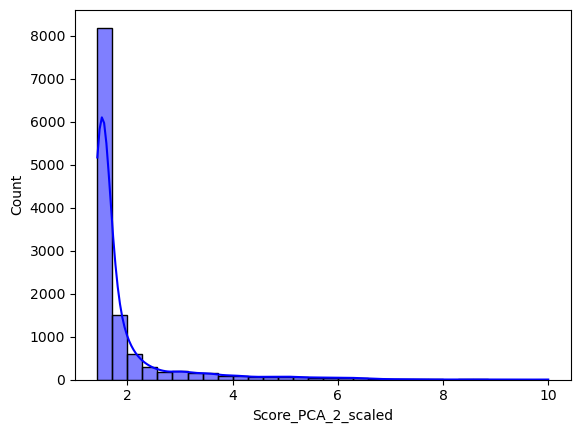

In [16]:
sns.histplot(top_actors['Score_PCA_2_scaled'], bins=30, kde=True, color='blue')

In [18]:
# Explode 'new_id' to ensure each row corresponds to one movie
exploded_actors = top_actors.explode('new_id')

# Optional: Explode 'top_3_genre' and 'top_3_countries' for further analysis
exploded_actors['top_3_genre'] = exploded_actors['top_3_genre'].apply(lambda x: x if isinstance(x, list) else [])
exploded_actors['top_3_countries'] = exploded_actors['top_3_countries'].apply(lambda x: x if isinstance(x, list) else [])


In [19]:
import networkx as nx

# Initialize the graph
G = nx.Graph()

# Group actors by movie (new_id)
movie_groups = exploded_actors.groupby('new_id')['ActorName'].apply(list)

# Add edges based on shared movies
for actors_in_movie in movie_groups:
    for i, actor1 in enumerate(actors_in_movie):
        for actor2 in actors_in_movie[i+1:]:
            if G.has_edge(actor1, actor2):
                G[actor1][actor2]['weight'] += 1  # Increment weight if edge exists
            else:
                G.add_edge(actor1, actor2, weight=1)  # Create a new edge with weight 1


In [20]:
# Add node attributes for genres and countries
for _, row in exploded_actors.iterrows():
    if row['ActorName'] in G:
        G.nodes[row['ActorName']]['genres'] = row['top_3_genre']
        G.nodes[row['ActorName']]['countries'] = row['top_3_countries']


In [21]:
# Inspect all edges in the graph with weights
edges_with_weights = list(G.edges(data=True))
for edge in edges_with_weights[:10]:  # Display the first 10 edges
    print(edge)


('Bridget Fonda', 'Bruce Campbell', {'weight': 2})
('Bridget Fonda', 'Embeth Davidtz', {'weight': 1})
('Bridget Fonda', 'Ted Raimi', {'weight': 3})
('Bridget Fonda', 'Dennis Hopper', {'weight': 1})
('Bridget Fonda', 'Jack Nicholson', {'weight': 1})
('Bridget Fonda', 'Karen Black', {'weight': 1})
('Bridget Fonda', 'Luana Anders', {'weight': 2})
('Bridget Fonda', 'Luke Askew', {'weight': 1})
('Bridget Fonda', 'Peter Fonda', {'weight': 3})
('Bridget Fonda', 'Al Martino', {'weight': 1})


In [22]:
# Find edges where both actors share at least one genre
edges_shared_genres = [
    (actor1, actor2, attrs) for actor1, actor2, attrs in G.edges(data=True)
    if set(G.nodes[actor1]['genres']) & set(G.nodes[actor2]['genres'])  # Intersection of genres
]

print(f"Number of edges with shared genres: {len(edges_shared_genres)}")
for edge in edges_shared_genres[:10]:  # Display first 10 edges
    print(edge)


Number of edges with shared genres: 367138
('Bridget Fonda', 'Bruce Campbell', {'weight': 2})
('Bridget Fonda', 'Embeth Davidtz', {'weight': 1})
('Bridget Fonda', 'Dennis Hopper', {'weight': 1})
('Bridget Fonda', 'Jack Nicholson', {'weight': 1})
('Bridget Fonda', 'Karen Black', {'weight': 1})
('Bridget Fonda', 'Luana Anders', {'weight': 2})
('Bridget Fonda', 'Luke Askew', {'weight': 1})
('Bridget Fonda', 'Peter Fonda', {'weight': 3})
('Bridget Fonda', 'Al Martino', {'weight': 1})
('Bridget Fonda', 'Al Pacino', {'weight': 2})


In [23]:
# Find edges where both actors share at least one country
edges_shared_countries = [
    (actor1, actor2, attrs) for actor1, actor2, attrs in G.edges(data=True)
    if set(G.nodes[actor1]['countries']) & set(G.nodes[actor2]['countries'])  # Intersection of countries
]

print(f"Number of edges with shared countries: {len(edges_shared_countries)}")
for edge in edges_shared_countries[:10]:  # Display first 10 edges
    print(edge)


Number of edges with shared countries: 377816
('Bridget Fonda', 'Bruce Campbell', {'weight': 2})
('Bridget Fonda', 'Embeth Davidtz', {'weight': 1})
('Bridget Fonda', 'Ted Raimi', {'weight': 3})
('Bridget Fonda', 'Dennis Hopper', {'weight': 1})
('Bridget Fonda', 'Jack Nicholson', {'weight': 1})
('Bridget Fonda', 'Karen Black', {'weight': 1})
('Bridget Fonda', 'Luana Anders', {'weight': 2})
('Bridget Fonda', 'Luke Askew', {'weight': 1})
('Bridget Fonda', 'Peter Fonda', {'weight': 3})
('Bridget Fonda', 'Al Martino', {'weight': 1})


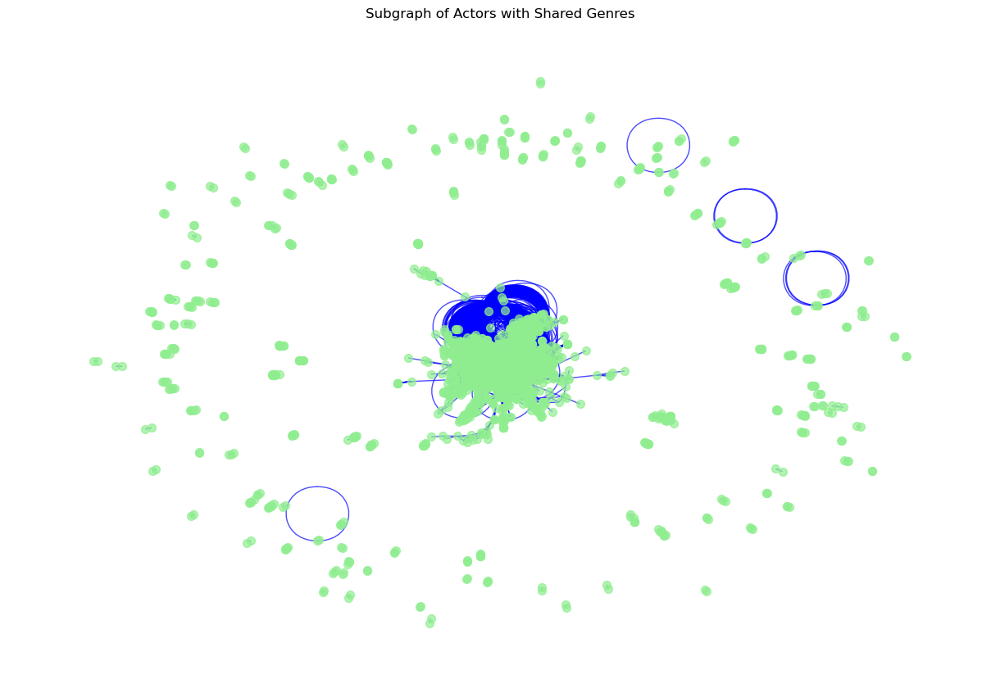

In [24]:
# Create a subgraph for shared genres
shared_genres_subgraph = G.edge_subgraph(
    (actor1, actor2) for actor1, actor2 in G.edges
    if set(G.nodes[actor1]['genres']) & set(G.nodes[actor2]['genres'])
)

# Visualize the subgraph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(shared_genres_subgraph)
nx.draw(
    shared_genres_subgraph, pos, with_labels=False, node_size=50, font_size=8,
    edge_color='blue', node_color='lightgreen', alpha=0.7
)
plt.title("Subgraph of Actors with Shared Genres")
plt.show()


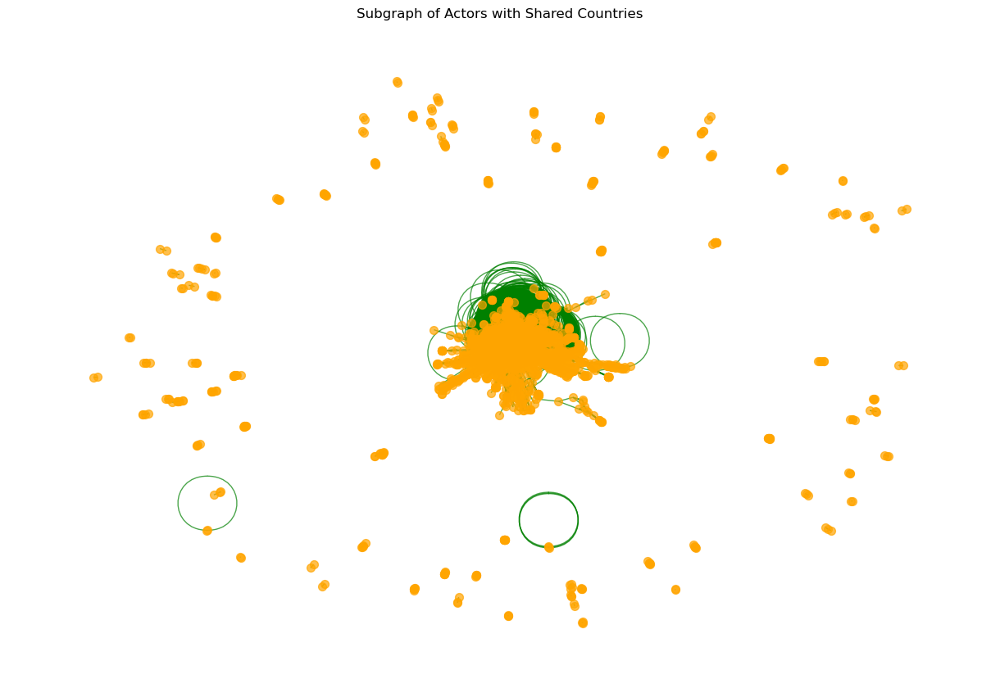

In [25]:
# Create a subgraph for shared countries
shared_countries_subgraph = G.edge_subgraph(
    (actor1, actor2) for actor1, actor2 in G.edges
    if set(G.nodes[actor1]['countries']) & set(G.nodes[actor2]['countries'])
)

# Visualize the subgraph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(shared_countries_subgraph)
nx.draw(
    shared_countries_subgraph, pos, with_labels=False, node_size=50, font_size=8,
    edge_color='green', node_color='orange', alpha=0.7
)
plt.title("Subgraph of Actors with Shared Countries")
plt.show()


In [27]:
# Compute centrality
degree_centrality = nx.degree_centrality(G)

# Get the top 10 actors by degree centrality
top_actors_by_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top actors by degree centrality:", top_actors_by_degree)


Top actors by degree centrality: [('Samuel L. Jackson', 0.058736254145575144), ('Bruce Willis', 0.05000872752661896), ('Steve Buscemi', 0.046692267411415606), ('Michael Caine', 0.04651771687903648), ('Robert De Niro', 0.0462558910804678), ('Donald Sutherland', 0.04599406528189911), ('John Wayne', 0.04494676208762437), ('Christopher Walken', 0.04459766102286612), ('Harry Dean Stanton', 0.04250305463431664), ('Christopher Lee', 0.04163030197242102)]


In [29]:
from networkx.algorithms.community import greedy_modularity_communities

# Detect communities
communities = list(greedy_modularity_communities(G))
print(f"Number of communities: {len(communities)}")


Number of communities: 177


In [30]:
communities

[frozenset({'Susan Egan',
            'Sharon Washington',
            'Dana Delany',
            'Jürgen Prochnow',
            'Haley Joel Osment',
            'Vanna Bonta',
            'Julia Sweeney',
            'David Proval',
            'Gary Gulman',
            'Leonor Watling',
            'Thomas Jane',
            'Javier Torres Zaragoza',
            'Marco Bianco',
            'Lucy Lawless',
            'Brian Blessed',
            'Eric Mabius',
            'Fred Gwynne',
            'Troy Evans',
            'Joe Bucaro',
            'Josh Hutcherson',
            'Kevin Pollak',
            'Elya Baskin',
            'Colin Follenweider',
            'Edward Furlong',
            'Chris Sarandon',
            'Courtney Love',
            'Sid Haig',
            'Michael Chiklis',
            'Earl Boen',
            'Samuel West',
            'Gulielm Radoja',
            'Carrie-Anne Moss',
            'Pete Docter',
            'Julian Rhind-Tutt',
            'Ro

Smallest community size: 1
Largest community size: 4446
Average community size: 64.74


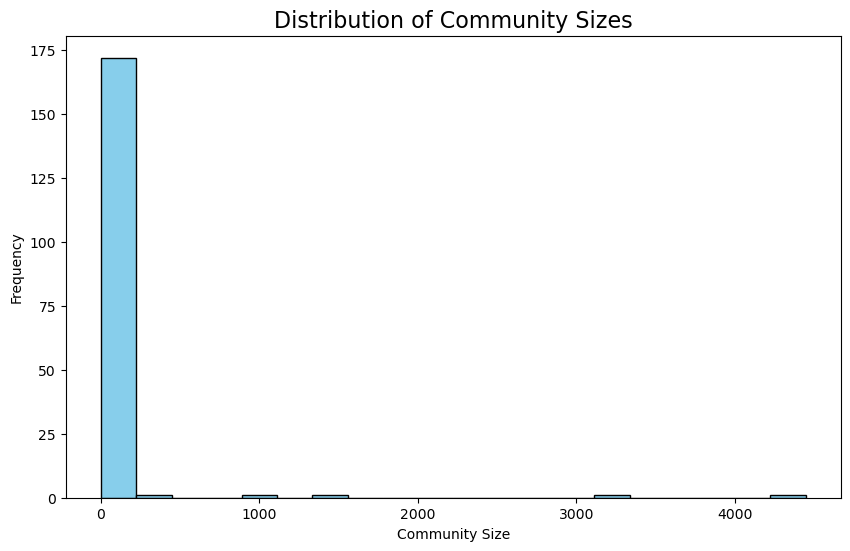

In [31]:
# Calculate community sizes
community_sizes = [len(community) for community in communities]

# Print stats
print(f"Smallest community size: {min(community_sizes)}")
print(f"Largest community size: {max(community_sizes)}")
print(f"Average community size: {sum(community_sizes) / len(community_sizes):.2f}")

# Plot community sizes
plt.figure(figsize=(10, 6))
plt.hist(community_sizes, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Community Sizes', fontsize=16)
plt.xlabel('Community Size')
plt.ylabel('Frequency')
plt.show()


In [32]:
from networkx.algorithms.centrality import degree_centrality

# Compute degree centrality
centrality = degree_centrality(G)

# Find the most central node in each community
most_central_in_communities = {}
for i, community in enumerate(communities):
    central_actor = max(community, key=lambda x: centrality.get(x, 0))
    most_central_in_communities[i] = central_actor

# Print the results
for community_id, actor in most_central_in_communities.items():
    print(f"Community {community_id}: Most central actor is {actor}")


Community 0: Most central actor is Samuel L. Jackson
Community 1: Most central actor is Michael Caine
Community 2: Most central actor is Amitabh Bachchan
Community 3: Most central actor is Julian Glover
Community 4: Most central actor is Daniel Olbrychski
Community 5: Most central actor is Sergi López
Community 6: Most central actor is Cem Yılmaz
Community 7: Most central actor is Leila Hatami
Community 8: Most central actor is Jacoba Rozema
Community 9: Most central actor is S. Shamsuddin
Community 10: Most central actor is Samandar Rzayev
Community 11: Most central actor is Basundhara Bhushal
Community 12: Most central actor is Allie Ryave
Community 13: Most central actor is Mark Fish
Community 14: Most central actor is Prokopenko
Community 15: Most central actor is George Thomas Coker
Community 16: Most central actor is Jim Wallace
Community 17: Most central actor is Anne Le Ny
Community 18: Most central actor is Lorelei Linklater
Community 19: Most central actor is Roger Daltrey
Co

In [34]:
from collections import Counter

In [35]:
# Extract top 10 communities by size
top_10_communities = sorted(communities, key=len, reverse=True)[:10]

# Analyze each top community
for i, community in enumerate(top_10_communities):
    community_actors = list(community)
    community_data = actors[actors['ActorName'].isin(community_actors)]
    avg_score = community_data['Score_PCA_2_scaled'].mean()
    print(f"Community {i + 1}:")
    print(f"  Size: {len(community)}")
    print(f"  Average Score: {avg_score:.2f}")
    print(f"  Top Genres: {Counter(sum(community_data['top_3_genre'].dropna(), [])).most_common(3)}")
    print(f"  Top Countries: {Counter(sum(community_data['top_3_countries'].dropna(), [])).most_common(3)}\n")


Community 1:
  Size: 4446
  Average Score: 1.99
  Top Genres: [('Drama', 3255), ('Comedy', 2209), ('Thriller', 1491)]
  Top Countries: [('United States of America', 3941), ('United Kingdom', 1728), ('Germany', 1114)]

Community 2:
  Size: 3237
  Average Score: 2.12
  Top Genres: [('Drama', 2761), ('Comedy', 1362), ('Black-and-white', 818)]
  Top Countries: [('United States of America', 2733), ('United Kingdom', 1201), ('France', 689)]

Community 3:
  Size: 1496
  Average Score: 1.83
  Top Genres: [('Drama', 1408), ('Action', 625), ('World cinema', 471)]
  Top Countries: [('India', 1356), ('United States of America', 132), ('United Kingdom', 107)]

Community 4:
  Size: 965
  Average Score: 1.59
  Top Genres: [('Drama', 559), ('Japanese Movies', 293), ('Action', 284)]
  Top Countries: [('Japan', 349), ('United States of America', 285), ('United Kingdom', 175)]

Community 5:
  Size: 279
  Average Score: 1.50
  Top Genres: [('Drama', 233), ('Comedy', 159), ('Romance', 69)]
  Top Countries:

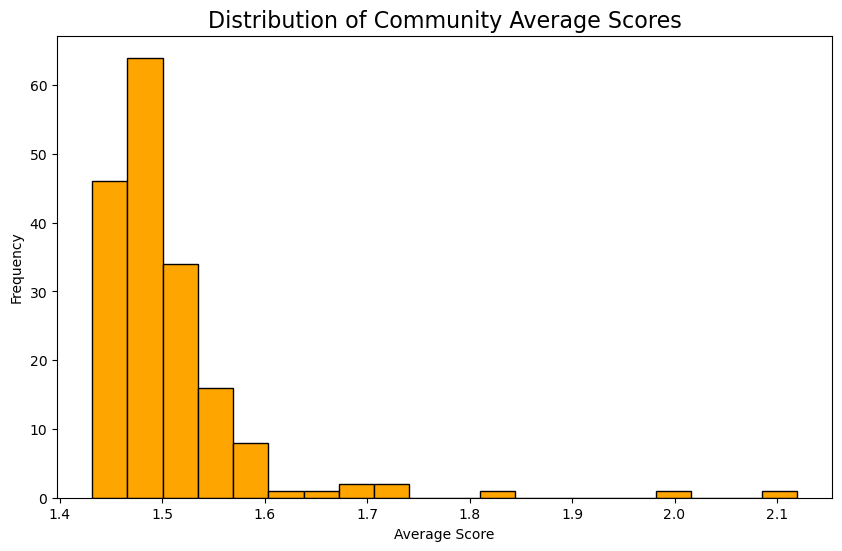

In [36]:
community_success = []
for community in communities:
    community_actors = list(community)
    community_data = actors[actors['ActorName'].isin(community_actors)]
    avg_score = community_data['Score_PCA_2_scaled'].mean()
    community_success.append(avg_score)

# Plot
plt.figure(figsize=(10, 6))
plt.hist(community_success, bins=20, color='orange', edgecolor='black')
plt.title('Distribution of Community Average Scores', fontsize=16)
plt.xlabel('Average Score')
plt.ylabel('Frequency')
plt.show()


In [37]:
top_actors = actors[actors['Score_PCA_2_scaled'] > threshold]['ActorName']
communities_with_top_actors = [community for community in communities if any(actor in top_actors.values for actor in community)]

print(f"Number of communities with top actors: {len(communities_with_top_actors)}")
for i, community in enumerate(communities_with_top_actors[:5]):
    print(f"Community {i + 1}: Size = {len(community)}")


Number of communities with top actors: 177
Community 1: Size = 4446
Community 2: Size = 3237
Community 3: Size = 1496
Community 4: Size = 965
Community 5: Size = 279


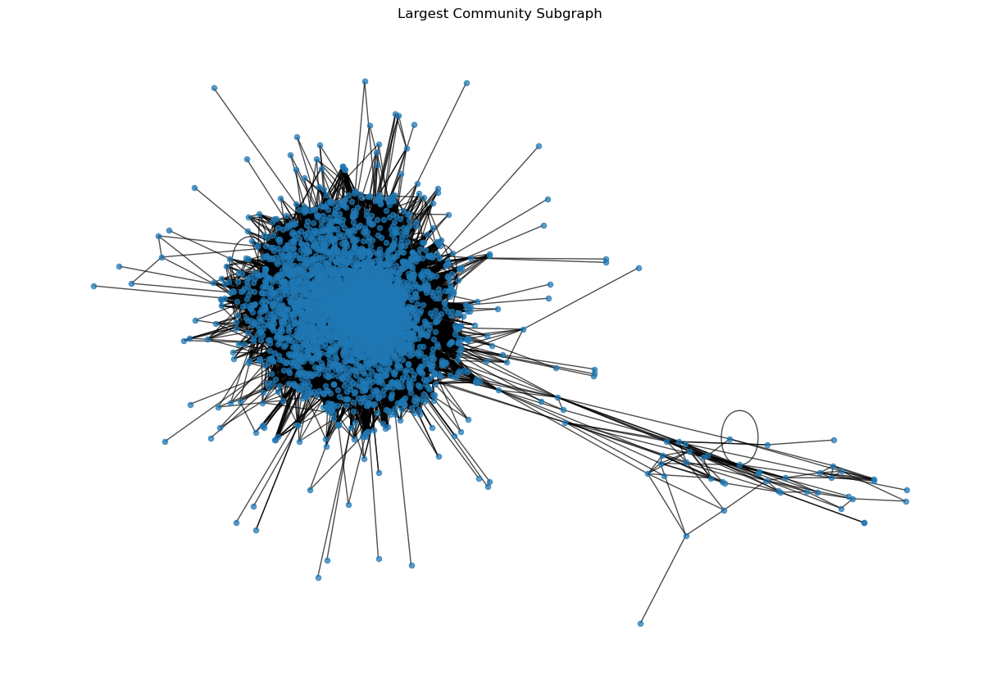

In [38]:
# Choose a community (e.g., the largest one)
largest_community = max(communities, key=len)
subgraph = G.subgraph(largest_community)

plt.figure(figsize=(12, 8))
nx.draw(subgraph, pos=nx.spring_layout(subgraph, seed=42), node_size=20, alpha=0.7)
plt.title("Largest Community Subgraph")
plt.show()


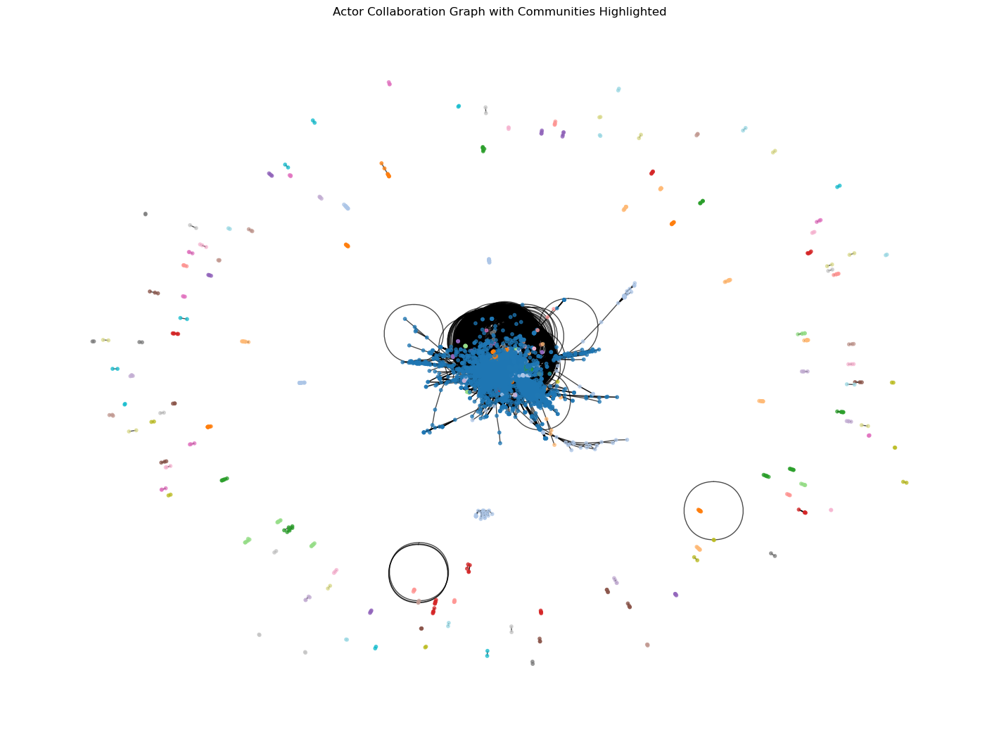

In [39]:
# Assign a color to each community
community_colors = {}
for i, community in enumerate(communities):
    for node in community:
        community_colors[node] = i

# Assign node colors
node_colors = [community_colors[node] for node in G.nodes()]

# Visualize
plt.figure(figsize=(14, 10))
nx.draw(G, pos=nx.spring_layout(G, seed=42), node_color=node_colors, cmap='tab20', node_size=10, alpha=0.7)
plt.title('Actor Collaboration Graph with Communities Highlighted')
plt.show()


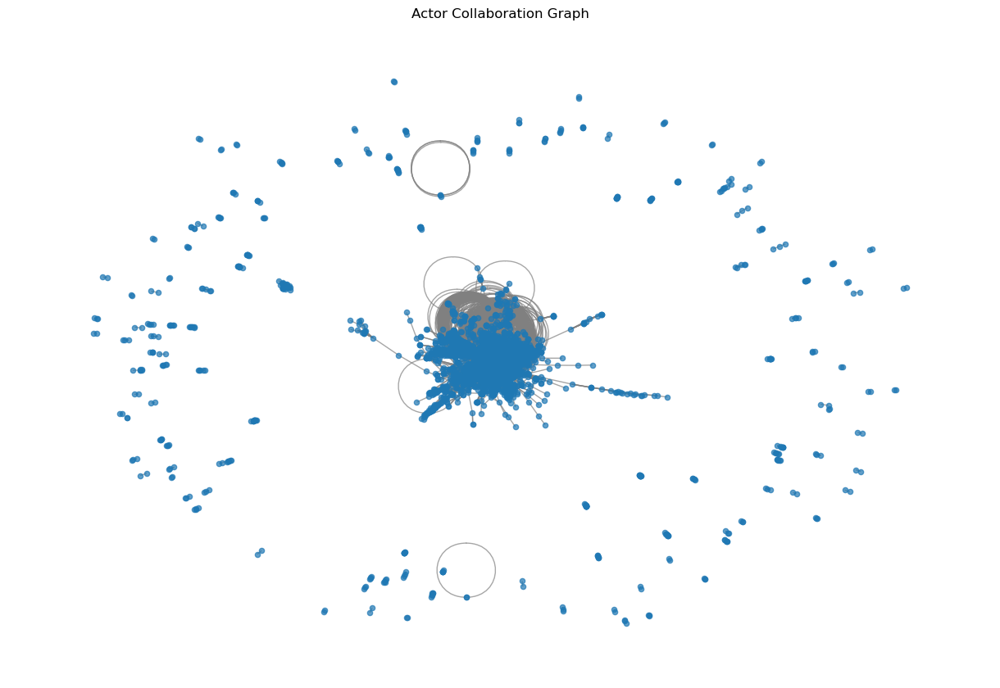

In [41]:
import matplotlib.pyplot as plt

# Visualize the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)  # Use spring layout for better visualization
nx.draw(G, pos, node_size=20, with_labels=False, alpha=0.7, edge_color="gray")
plt.title("Actor Collaboration Graph")
plt.show()


In [42]:
# Flatten genres and countries for all nodes
all_genres = [genre for node in G.nodes(data=True) for genre in node[1].get('genres', [])]
all_countries = [country for node in G.nodes(data=True) for country in node[1].get('countries', [])]

# Count unique genres and countries
from collections import Counter
print("Top genres:", Counter(all_genres).most_common(10))
print("Top countries:", Counter(all_countries).most_common(10))


Top genres: [('Drama', 8882), ('Comedy', 4571), ('Action', 2778), ('Thriller', 2328), ('Romance', 1871), ('World cinema', 1228), ('Adventure', 1114), ('Crime', 1042), ('Romance Film', 951), ('Black-and-white', 883)]
Top countries: [('United States of America', 7371), ('United Kingdom', 3251), ('France', 1769), ('Germany', 1521), ('India', 1427), ('Canada', 1026), ('Italy', 671), ('Japan', 636), ('Australia', 431), ('Spain', 267)]


In [43]:
from networkx.algorithms.community import louvain_communities

# Detect communities using Louvain
communities_louv = louvain_communities(G)
print(f"Number of communities: {len(communities_louv)}")


Number of communities: 171


In [44]:
from igraph import Graph
from igraph import VertexClustering

# Convert NetworkX graph to igraph
ig = Graph.TupleList(G.edges(), directed=False)

# Run community detection using Louvain
clusters = ig.community_multilevel()
print(f"Number of communities: {len(clusters)}")


Number of communities: 173


---
# taking the largest community only

In [53]:
# Filter the actors DataFrame for the largest community
largest_community_actors = actors[actors['ActorName'].isin(largest_community)].copy()


In [54]:
# Explode 'new_id', 'top_3_genre', and 'top_3_countries' if needed
largest_community_actors = largest_community_actors.explode('new_id')
largest_community_actors['top_3_genre'] = largest_community_actors['top_3_genre'].apply(lambda x: x if isinstance(x, list) else [])
largest_community_actors['top_3_countries'] = largest_community_actors['top_3_countries'].apply(lambda x: x if isinstance(x, list) else [])


In [55]:
# Initialize the graph
G_new = nx.Graph()

# Group actors by movie (new_id)
movie_groups_new = largest_community_actors.groupby('new_id')['ActorName'].apply(list)

# Add edges based on shared movies
for actors_in_movie in movie_groups_new:
    for i, actor1 in enumerate(actors_in_movie):
        for actor2 in actors_in_movie[i + 1:]:
            if G_new.has_edge(actor1, actor2):
                G_new[actor1][actor2]['weight'] += 1
            else:
                G_new.add_edge(actor1, actor2, weight=1)

# Add node attributes for genres and countries
for _, row in largest_community_actors.iterrows():
    if row['ActorName'] in G_new:
        G_new.nodes[row['ActorName']]['genres'] = row['top_3_genre']
        G_new.nodes[row['ActorName']]['countries'] = row['top_3_countries']


In [56]:
from networkx.algorithms.community import greedy_modularity_communities

# Detect communities
communities_new = list(greedy_modularity_communities(G_new))
print(f"Number of communities in largest community: {len(communities_new)}")

# Calculate community sizes
community_sizes_new = [len(community) for community in communities_new]
print(f"Smallest community size: {min(community_sizes_new)}")
print(f"Largest community size: {max(community_sizes_new)}")
print(f"Average community size: {sum(community_sizes_new) / len(community_sizes_new):.2f}")


Number of communities in largest community: 17
Smallest community size: 2
Largest community size: 2233
Average community size: 261.53


In [57]:
degree_centrality_new = nx.degree_centrality(G_new)
top_actors_by_degree_new = sorted(degree_centrality_new.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top actors by degree centrality in the largest community:", top_actors_by_degree_new)


Top actors by degree centrality in the largest community: [('Samuel L. Jackson', 0.14015748031496061), ('Bruce Willis', 0.11743532058492688), ('Steve Buscemi', 0.1093363329583802), ('Christopher Walken', 0.09493813273340831), ('Robert De Niro', 0.09358830146231721), ('Nicolas Cage', 0.09313835770528683), ('Matt Damon', 0.09201349831271091), ('Robert Downey Jr.', 0.09156355455568053), ('Morgan Freeman', 0.09043869516310461), ('Willem Dafoe', 0.09043869516310461)]


In [58]:
edges_shared_genres_new = [
    (actor1, actor2, attrs) for actor1, actor2, attrs in G_new.edges(data=True)
    if set(G_new.nodes[actor1]['genres']) & set(G_new.nodes[actor2]['genres'])
]

edges_shared_countries_new = [
    (actor1, actor2, attrs) for actor1, actor2, attrs in G_new.edges(data=True)
    if set(G_new.nodes[actor1]['countries']) & set(G_new.nodes[actor2]['countries'])
]

print(f"Number of edges with shared genres in largest community: {len(edges_shared_genres_new)}")
print(f"Number of edges with shared countries in largest community: {len(edges_shared_countries_new)}")


Number of edges with shared genres in largest community: 164281
Number of edges with shared countries in largest community: 169508


In [78]:
# List of top central actors
top_central_actors = [actor for actor, _ in top_actors_by_degree_new]

# Find the community for each top central actor
top_central_actor_communities = {actor: node_community_map[actor] + 1 for actor in top_central_actors}

# Group by community
from collections import Counter
community_counts = Counter(top_central_actor_communities.values())

# Print the community distribution
print("Community distribution of top central actors:")
for community, count in community_counts.items():
    print(f"Community {community}: {count} actor(s)")

# Optional: Save to a DataFrame for further analysis
import pandas as pd
central_actors_df = pd.DataFrame({
    "Actor": top_central_actors,
    "Community": [top_central_actor_communities[actor] for actor in top_central_actors]
})
central_actors_df


Community distribution of top central actors:
Community 1: 6 actor(s)
Community 2: 3 actor(s)
Community 3: 1 actor(s)


,Actor,Community
0,Samuel L. Jackson,1
1,Bruce Willis,1
2,Steve Buscemi,1
3,Christopher Walken,1
4,Robert De Niro,1
5,Nicolas Cage,1
6,Matt Damon,2
7,Robert Downey Jr.,3
8,Morgan Freeman,2
9,Willem Dafoe,2


Upon examining the distribution of top central actors within the largest community, we discovered an intriguing pattern. Out of the 10 most central actors, six belonged to Community 1, making it the dominant cluster in terms of collaborative influence. This suggests that Community 1 functions as the primary hub for actor collaborations, where frequent interactions and strong connections drive collective success.

Community 2 followed, with three top central actors. While smaller than Community 1, this group still holds significant collaborative power, indicating that it is another important cluster contributing to the overall network's success. Its presence highlights that influential collaborations are not entirely concentrated in a single group but are distributed across multiple clusters.

Interestingly, only one top central actor was found in Community 3. This lone actor’s prominence suggests they might play a unique bridging role, connecting their community to others. Community 3 itself could represent a more isolated or specialized collaboration network.

These findings underline the importance of collaborative density in achieving success. Actors in Community 1 appear to benefit from their position in a highly interconnected group, which likely provides opportunities for visibility and repeated collaborations. Meanwhile, the presence of central actors in smaller communities points to alternative paths to success, such as serving as a connector or standing out in a niche.

In [80]:
# Analyze top communities
for i, community in enumerate(sorted(communities_new, key=len, reverse=True)):
    community_actors = list(community)
    community_data = largest_community_actors[largest_community_actors['ActorName'].isin(community_actors)]
    avg_score = community_data['Score_PCA_2_scaled'].mean()
    print(f"Community {i + 1}:")
    print(f"  Size: {len(community)}")
    print(f"  Average Score: {avg_score:.2f}")
    print(f"  Top Genres: {Counter(sum(community_data['top_3_genre'].dropna(), [])).most_common(3)}")
    print(f"  Top Countries: {Counter(sum(community_data['top_3_countries'].dropna(), [])).most_common(3)}\n")


Community 1:
  Size: 2233
  Average Score: 2.64
  Top Genres: [('Drama', 33273), ('Comedy', 27598), ('Thriller', 15207)]
  Top Countries: [('United States of America', 38390), ('United Kingdom', 18954), ('Germany', 14913)]

Community 2:
  Size: 1638
  Average Score: 2.62
  Top Genres: [('Drama', 13943), ('Thriller', 6758), ('Action', 5706)]
  Top Countries: [('United States of America', 14290), ('United Kingdom', 10910), ('Germany', 4756)]

Community 3:
  Size: 394
  Average Score: 2.51
  Top Genres: [('Drama', 1962), ('Thriller', 1173), ('Comedy', 928)]
  Top Countries: [('United States of America', 2309), ('United Kingdom', 994), ('Germany', 583)]

Community 4:
  Size: 38
  Average Score: 1.67
  Top Genres: [('Adventure', 75), ('Animation', 74), ('Comedy', 53)]
  Top Countries: [('United States of America', 96), ('Australia', 19), ('Japan', 11)]

Community 5:
  Size: 34
  Average Score: 1.65
  Top Genres: [('Drama', 112), ('Comedy', 66), ('Thriller', 48)]
  Top Countries: [('United S

As we delved into the communities within the largest collaboration network, several interesting patterns emerged. The largest community, Community 1, stood out with 2,233 actors and an average score of 2.64. It was heavily dominated by genres such as drama, comedy, and thriller, with the United States, the United Kingdom, and Germany being the primary countries represented. This community's size and high average score suggest it is a central hub of the global entertainment industry, featuring diverse actors collaborating across numerous genres.

Community 2, while smaller at 1,638 actors, displayed similar characteristics, with drama, thriller, and action as its top genres. Its slightly lower average score (2.62) indicates a highly active but marginally less influential network compared to Community 1. The predominance of the United States, the United Kingdom, and Germany reinforces the transatlantic nature of collaborations in this cluster.

As we moved to smaller communities, the patterns shifted. For instance, Community 3 (394 actors) maintained drama as the dominant genre but showed a significant drop in average score to 2.51. This community seems to be less central yet remains relevant due to its alignment with popular genres like thriller and comedy.

The smallest communities, such as Communities 16 and 17, contained just two or three actors each and had average scores below 1.6. These clusters represented niche genres like stop motion, animated musical, or biography, often tied to specific production regions such as Japan or South Korea. Their lower scores and small sizes suggest that these actors operate in specialized or localized networks with limited global reach.

Interestingly, while drama was the most consistent genre across all communities, its presence diminished in smaller clusters, which began to reflect more niche genres and focused collaborations. Additionally, the dominance of the United States as a primary country across all communities indicates its pivotal role in shaping global actor collaborations.

| Community | Size | Average Score | Top Genres                          | Top Countries                              |
|-----------|------|---------------|-------------------------------------|-------------------------------------------|
| 1         | 2233 | 2.64          | Drama (33,273), Comedy (27,598), Thriller (15,207) | USA (38,390), UK (18,954), Germany (14,913) |
| 2         | 1638 | 2.62          | Drama (13,943), Thriller (6,758), Action (5,706)  | USA (14,290), UK (10,910), Germany (4,756) |
| 3         | 394  | 2.51          | Drama (1,962), Thriller (1,173), Comedy (928)     | USA (2,309), UK (994), Germany (583)       |
| 4         | 38   | 1.67          | Adventure (75), Animation (74), Comedy (53)      | USA (96), Australia (19), Japan (11)       |
| 5         | 34   | 1.65          | Drama (112), Comedy (66), Thriller (48)          | USA (119), UK (31), Czech Republic (23)    |
| 6         | 30   | 2.72          | Drama (171), Thriller (122), Action (69)         | USA (182), UK (84), France (81)            |
| 7         | 18   | 1.81          | Drama (128), Comedy (74), Thriller (44)          | USA (142), Canada (117), France (61)       |
| 8         | 16   | 1.67          | Drama (57), Comedy (45), Action (17)             | USA (64), South Korea (17), Japan (17)     |
| 9         | 13   | 1.67          | Romance (25), Drama (24), Comedy (13)            | USA (31)                                   |
| 10        | 6    | 1.43          | Comedy (6), Fantasy Comedy (6), Black Comedy (6) | USA (6)                                    |
| 11        | 5    | 1.54          | Crime (9), Thriller (8), Action (8)              | France (11), USA (3)                       |
| 12        | 5    | 1.48          | Airplanes (7), Romance (7), Action/Adventure (4) | USA (7)                                    |
| 13        | 4    | 1.46          | Ensemble Film (4), Comedy (4), Teen (4)          | USA (4)                                    |
| 14        | 4    | 1.55          | Drama (7), Comedy (5), Indie (5)                 | USA (9)                                    |
| 15        | 3    | 1.56          | Romance (4), Indie (4), Romantic Drama (2)       | USA (4)                                    |
| 16        | 3    | 1.52          | Stop Motion (4), Animated Musical (4), Family (4)| USA (4)                                    |
| 17        | 2    | 1.48          | Drama (4), Thriller (4), Biography (4)           | USA (4), UK (4)                            |


In [81]:
import pandas as pd

# Example DataFrame
data = {
    "Community": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
    "Size": [2233, 1638, 394, 38, 34, 30, 18, 16, 13, 6, 5, 5, 4, 4, 3, 3, 2],
    "Average Score": [2.64, 2.62, 2.51, 1.67, 1.65, 2.72, 1.81, 1.67, 1.67, 1.43, 1.54, 1.48, 1.46, 1.55, 1.56, 1.52, 1.48],
    "Top Genres": [
        "Drama (33,273), Comedy (27,598), Thriller (15,207)",
        "Drama (13,943), Thriller (6,758), Action (5,706)",
        "Drama (1,962), Thriller (1,173), Comedy (928)",
        "Adventure (75), Animation (74), Comedy (53)",
        "Drama (112), Comedy (66), Thriller (48)",
        "Drama (171), Thriller (122), Action (69)",
        "Drama (128), Comedy (74), Thriller (44)",
        "Drama (57), Comedy (45), Action (17)",
        "Romance (25), Drama (24), Comedy (13)",
        "Comedy (6), Fantasy Comedy (6), Black Comedy (6)",
        "Crime (9), Thriller (8), Action (8)",
        "Airplanes (7), Romance (7), Action/Adventure (4)",
        "Ensemble Film (4), Comedy (4), Teen (4)",
        "Drama (7), Comedy (5), Indie (5)",
        "Romance (4), Indie (4), Romantic Drama (2)",
        "Stop Motion (4), Animated Musical (4), Family (4)",
        "Drama (4), Thriller (4), Biography (4)",
    ],
    "Top Countries": [
        "USA (38,390), UK (18,954), Germany (14,913)",
        "USA (14,290), UK (10,910), Germany (4,756)",
        "USA (2,309), UK (994), Germany (583)",
        "USA (96), Australia (19), Japan (11)",
        "USA (119), UK (31), Czech Republic (23)",
        "USA (182), UK (84), France (81)",
        "USA (142), Canada (117), France (61)",
        "USA (64), South Korea (17), Japan (17)",
        "USA (31)",
        "USA (6)",
        "France (11), USA (3)",
        "USA (7)",
        "USA (4)",
        "USA (9)",
        "USA (4)",
        "USA (4)",
        "USA (4), UK (4)",
    ],
}

community_stats_df = pd.DataFrame(data)

# Save as HTML
community_stats_df.to_html("community_statistics.html", index=False)


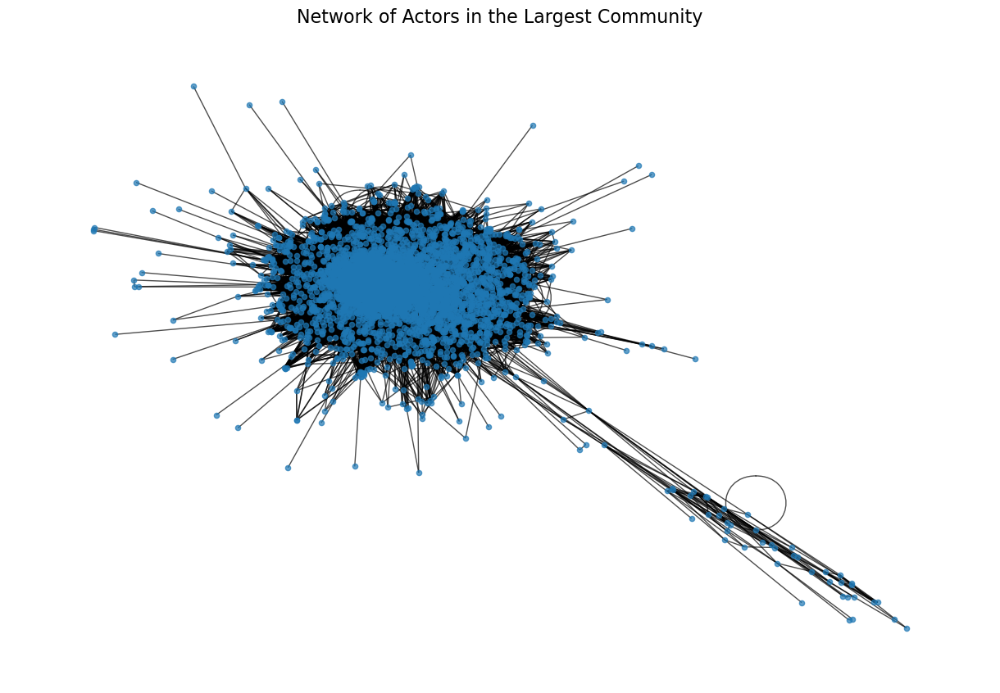

In [60]:
plt.figure(figsize=(12, 8))
nx.draw(G_new, pos=nx.spring_layout(G_new, seed=42), node_size=20, alpha=0.7)
plt.title("Network of Actors in the Largest Community", fontsize=16)
plt.show()


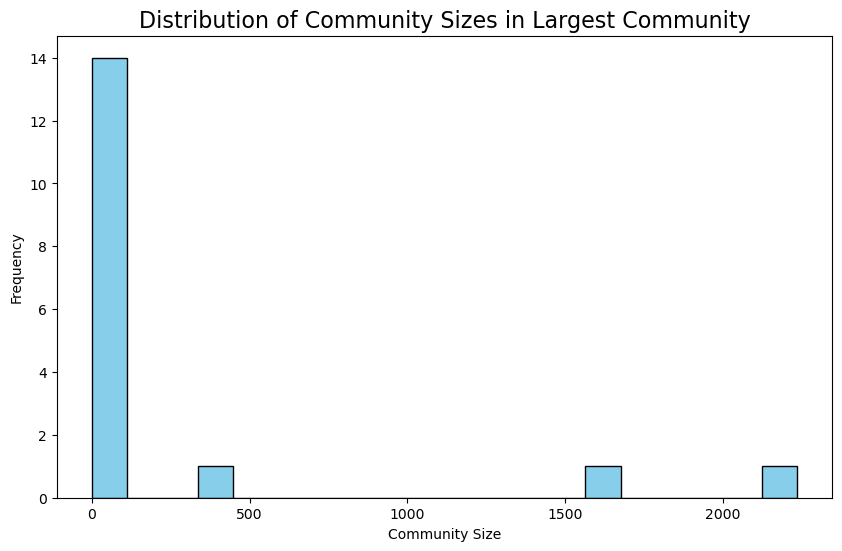

In [61]:
plt.figure(figsize=(10, 6))
plt.hist(community_sizes_new, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Community Sizes in Largest Community', fontsize=16)
plt.xlabel('Community Size')
plt.ylabel('Frequency')
plt.show()


In [63]:
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.colors as mcolors

# Detect communities
communities_new = list(greedy_modularity_communities(G_new))
print(f"Number of communities: {len(communities_new)}")

# Assign a community ID to each node
node_community_map = {}
for i, community in enumerate(communities_new):
    for node in community:
        node_community_map[node] = i

# Assign community IDs as a node attribute
nx.set_node_attributes(G_new, node_community_map, 'community')


Number of communities: 17


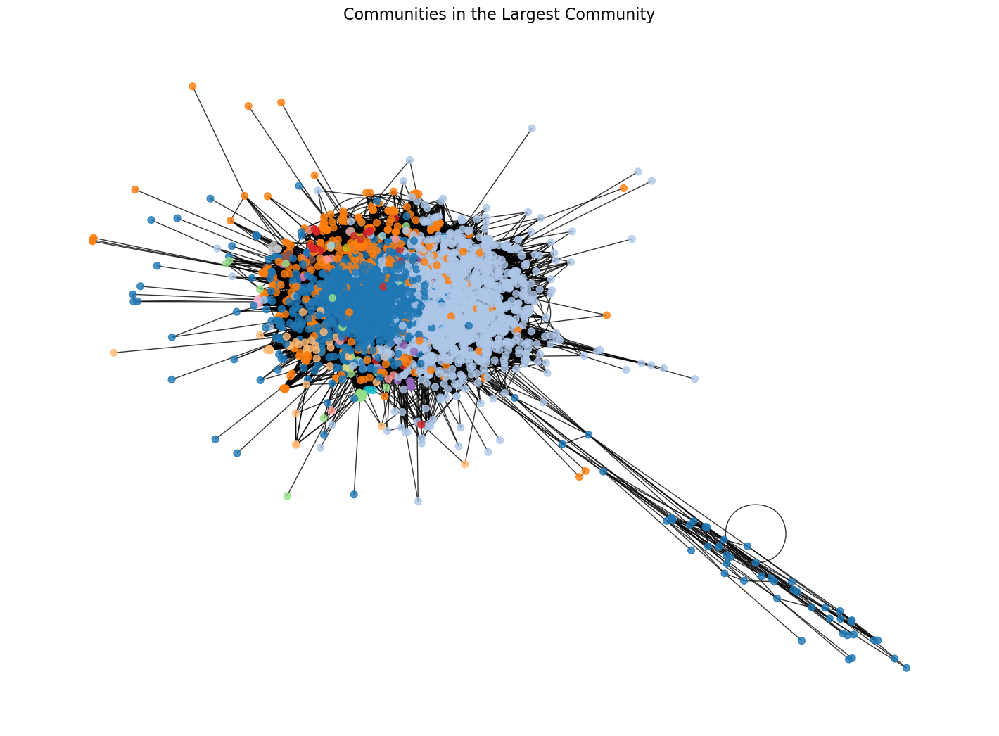

In [65]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Generate a colormap with enough distinct colors for all communities
colors = plt.cm.tab20(np.linspace(0, 1, len(communities_new)))

# Create a color map for nodes
node_colors = [colors[node_community_map[node]] for node in G_new.nodes]

# Draw the graph
plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G_new, seed=42)
nx.draw(G_new, pos, node_color=node_colors, with_labels=False, node_size=50, alpha=0.8)
plt.title("Communities in the Largest Community", fontsize=16)
plt.show()


In [66]:
# Compute statistics
clustering_coefficient = nx.average_clustering(G_new)
density = nx.density(G_new)
degree_distribution = [d for _, d in G_new.degree()]

print(f"Clustering Coefficient: {clustering_coefficient:.4f}")
print(f"Density: {density:.4f}")
print(f"Average Degree: {sum(degree_distribution)/len(degree_distribution):.2f}")


Clustering Coefficient: 0.3431
Density: 0.0176
Average Degree: 78.43


As we delved into the overall structure of the largest community's collaboration network, a few key statistics shed light on its nature. The clustering coefficient of the network was calculated to be 0.3431, indicating a moderate tendency for actors to form tightly connected groups. This means that while many actors tend to collaborate in localized clusters, the network isn’t overly cliquish. There’s enough openness in the structure to allow for connections between different groups.

Interestingly, the density of the network was found to be quite low at 0.0176, signifying a sparse network where only a small fraction of all possible collaborations exists. However, this low density is balanced by a high average degree of 78.43, which reveals that actors, on average, have worked with around 78 other co-stars. This highlights a robust environment where collaboration breadth plays a significant role, even if the network isn’t densely interconnected overall.

What does this tell us about success in this network? Actors seem to thrive by forming connections within their groups while maintaining a breadth of collaborations across the network. The moderately clustered structure suggests that actors benefit from working in groups, perhaps enhancing visibility and mutual support. Yet, success may also come from building diverse connections beyond their immediate circles, showcasing the importance of networking in this industry.

These findings provide a fascinating glimpse into the balance between localized and broad collaborations in the world of acting. The network's structure encourages actors to maintain a mix of close-knit teamwork and expansive professional relationships to maximize their opportunities.

In [67]:
# Compute centralities
degree_centrality = nx.degree_centrality(G_new)
closeness_centrality = nx.closeness_centrality(G_new)
betweenness_centrality = nx.betweenness_centrality(G_new)

# Print top 5 nodes by centralities
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

print("Top 5 Nodes by Degree Centrality:", top_degree)
print("Top 5 Nodes by Closeness Centrality:", top_closeness)
print("Top 5 Nodes by Betweenness Centrality:", top_betweenness)


Top 5 Nodes by Degree Centrality: [('Samuel L. Jackson', 0.14015748031496061), ('Bruce Willis', 0.11743532058492688), ('Steve Buscemi', 0.1093363329583802), ('Christopher Walken', 0.09493813273340831), ('Robert De Niro', 0.09358830146231721)]
Top 5 Nodes by Closeness Centrality: [('Samuel L. Jackson', 0.5157210813319411), ('Bruce Willis', 0.5052284610138668), ('Steve Buscemi', 0.4996627697841727), ('Matt Damon', 0.49831838565022424), ('Willem Dafoe', 0.4981508461279839)]
Top 5 Nodes by Betweenness Centrality: [('Samuel L. Jackson', 0.014421362479618968), ('Joel Torre', 0.010849537136326087), ('Chris Cooper', 0.010126755996130207), ('Bruce Willis', 0.0076610047910376485), ('Morgan Freeman', 0.006603978669748582)]


Centrality Analysis: Unveiling the Key Players
As we analyzed the centralities of nodes in the largest collaboration network, a clear picture began to emerge of the actors who hold the most influence and connectivity within the network. Centrality metrics provide a way to measure an actor's prominence, influence, and strategic position within the collaboration ecosystem.

Degree Centrality:
The top-ranked actor by degree centrality was Samuel L. Jackson, with a centrality value of 0.1401. This means that he is directly connected to about 14% of all actors in the largest community, making him a prolific collaborator and a key player in fostering connections. Following him were Bruce Willis (0.1174) and Steve Buscemi (0.1093), both known for their extensive filmographies and participation in ensemble casts. Actors like Christopher Walken and Robert De Niro rounded out the top five, further emphasizing the importance of their collaborative roles.

Closeness Centrality:
When considering closeness centrality, which measures how quickly an actor can connect to others in the network, Samuel L. Jackson once again emerged as the leader, with a value of 0.5157. This indicates that he is well-positioned to reach any actor in the network with minimal steps. Bruce Willis and Steve Buscemi followed closely, reflecting their ability to act as intermediaries. Interestingly, Matt Damon and Willem Dafoe joined the top five here, suggesting that their collaborations span diverse and accessible parts of the network.

Betweenness Centrality:
Betweenness centrality provides a measure of how often an actor serves as a bridge between other actors. Unsurprisingly, Samuel L. Jackson led this metric as well, with a value of 0.0144, highlighting his role as a key connector. However, the rankings introduced some new faces, such as Joel Torre and Chris Cooper, who appeared alongside more familiar names like Bruce Willis and Morgan Freeman. This suggests that these actors may play strategic roles in connecting otherwise disconnected parts of the network.

In [68]:
from collections import Counter

# Analyze each community
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    size = subgraph.number_of_nodes()
    avg_clustering = nx.average_clustering(subgraph)
    density = nx.density(subgraph)
    avg_degree = sum(dict(subgraph.degree()).values()) / size
    central_actor = max(dict(nx.degree_centrality(subgraph)).items(), key=lambda x: x[1])[0]
    
    print(f"Community {i + 1}:")
    print(f"  Size: {size}")
    print(f"  Average Clustering Coefficient: {avg_clustering:.4f}")
    print(f"  Density: {density:.4f}")
    print(f"  Average Degree: {avg_degree:.2f}")
    print(f"  Most Central Actor: {central_actor}\n")


Community 1:
  Size: 2233
  Average Clustering Coefficient: 0.2427
  Density: 0.0382
  Average Degree: 85.19
  Most Central Actor: Samuel L. Jackson

Community 2:
  Size: 1638
  Average Clustering Coefficient: 0.4533
  Density: 0.0204
  Average Degree: 33.47
  Most Central Actor: Cate Blanchett

Community 3:
  Size: 394
  Average Clustering Coefficient: 0.7048
  Density: 0.0327
  Average Degree: 12.83
  Most Central Actor: Harvey Keitel

Community 4:
  Size: 38
  Average Clustering Coefficient: 0.7794
  Density: 0.2262
  Average Degree: 8.37
  Most Central Actor: Teddy Newton

Community 5:
  Size: 34
  Average Clustering Coefficient: 0.8315
  Density: 0.2781
  Average Degree: 9.18
  Most Central Actor: Paul F. Tompkins

Community 6:
  Size: 30
  Average Clustering Coefficient: 0.7430
  Density: 0.1678
  Average Degree: 4.87
  Most Central Actor: Castulo Guerra

Community 7:
  Size: 18
  Average Clustering Coefficient: 0.3921
  Density: 0.1699
  Average Degree: 2.89
  Most Central Actor

As we delved deeper into the structure of the individual communities within the largest collaboration network, distinct characteristics began to emerge. Community 1, the largest group with 2,233 actors, showed an average clustering coefficient of 0.2427. This indicates a modest level of interconnectedness among its members. Despite its size, the density was relatively low at 0.0382, suggesting a sparse network. However, the average degree was high at 85.19, reflecting that actors in this community often collaborate with a wide range of co-stars. Samuel L. Jackson emerged as the most central actor, highlighting his influential role in this sprawling collaboration hub.

Moving to Community 2, which includes 1,638 actors, the clustering coefficient increased significantly to 0.4533, signaling tighter connections among its members. The density, however, remained lower at 0.0204, while the average degree dropped to 33.47, indicating fewer but more cohesive collaborations. Here, Cate Blanchett was the most central figure, suggesting her pivotal position within this group.

Smaller communities revealed even more distinct traits. Community 3, with 394 actors, boasted a high clustering coefficient of 0.7048, demonstrating a tightly knit group with frequent collaborations. Despite its smaller size, the density remained moderate at 0.0327, and Harvey Keitel stood out as the most central actor.

The smallest communities provided a fascinating contrast. Groups like Community 9 (13 actors) and Community 10 (6 actors) were fully connected, with clustering coefficients and densities of 1.0000. These communities operated as complete subgraphs, where every actor was directly connected to every other actor. Central figures in these groups, such as Harold Herthum and Madison Lanc, likely played central roles in niche or specialized collaboration networks.

Interestingly, as the communities decreased in size, their clustering coefficients generally increased. This reflects the natural tendency of smaller groups to form complete or near-complete networks. For example, Community 16 and Community 17, with just 3 and 2 members respectively, were fully connected but lacked broader influence due to their limited size.

In [70]:
from collections import Counter

# Analyze each community
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    size = subgraph.number_of_nodes()
    avg_clustering = nx.average_clustering(subgraph)
    density = nx.density(subgraph)
    avg_degree = sum(dict(subgraph.degree()).values()) / size
    central_actor = max(dict(nx.degree_centrality(subgraph)).items(), key=lambda x: x[1])[0]

    # Get the score of the most central actor
    central_actor_score = largest_community_actors.loc[
        largest_community_actors['ActorName'] == central_actor, 'Score_PCA_2_scaled'
    ].values[0] if central_actor in largest_community_actors['ActorName'].values else None

    print(f"Community {i + 1}:")
    print(f"  Size: {size}")
    print(f"  Average Clustering Coefficient: {avg_clustering:.4f}")
    print(f"  Density: {density:.4f}")
    print(f"  Average Degree: {avg_degree:.2f}")
    print(f"  Most Central Actor: {central_actor} (Score: {central_actor_score:.4f})\n")


Community 1:
  Size: 2233
  Average Clustering Coefficient: 0.2427
  Density: 0.0382
  Average Degree: 85.19
  Most Central Actor: Samuel L. Jackson (Score: 8.5807)

Community 2:
  Size: 1638
  Average Clustering Coefficient: 0.4533
  Density: 0.0204
  Average Degree: 33.47
  Most Central Actor: Cate Blanchett (Score: 7.2029)

Community 3:
  Size: 394
  Average Clustering Coefficient: 0.7048
  Density: 0.0327
  Average Degree: 12.83
  Most Central Actor: Harvey Keitel (Score: 6.2418)

Community 4:
  Size: 38
  Average Clustering Coefficient: 0.7794
  Density: 0.2262
  Average Degree: 8.37
  Most Central Actor: Teddy Newton (Score: 2.0987)

Community 5:
  Size: 34
  Average Clustering Coefficient: 0.8315
  Density: 0.2781
  Average Degree: 9.18
  Most Central Actor: Paul F. Tompkins (Score: 1.5654)

Community 6:
  Size: 30
  Average Clustering Coefficient: 0.7430
  Density: 0.1678
  Average Degree: 4.87
  Most Central Actor: Castulo Guerra (Score: 1.7546)

Community 7:
  Size: 18
  Aver

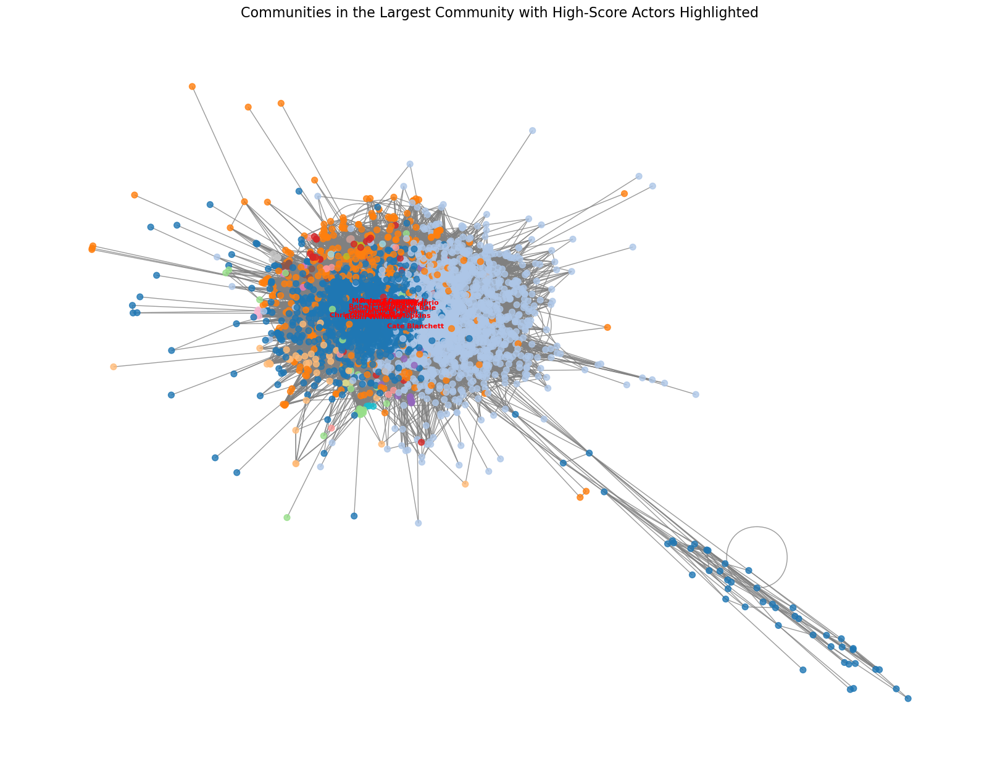

Actors with scores > 7 and their communities:
Anthony Hopkins: Community 2
Brad Pitt: Community 2
Cate Blanchett: Community 2
Christian Bale: Community 2
Christopher Walken: Community 1
Gary Oldman: Community 2
Leonardo DiCaprio: Community 1
Morgan Freeman: Community 2
Nicolas Cage: Community 1
Robert De Niro: Community 1
Robert Downey Jr.: Community 3
Robin Williams: Community 1
Samuel L. Jackson: Community 1
Tom Hanks: Community 1


In [71]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Generate a colormap with enough distinct colors for all communities
colors = plt.cm.tab20(np.linspace(0, 1, len(communities_new)))

# Create a color map for nodes
node_colors = [colors[node_community_map[node]] for node in G_new.nodes]

# Identify actors with scores > 7
high_score_actors = largest_community_actors[largest_community_actors['Score_PCA_2_scaled'] > 7]
high_score_actor_names = high_score_actors['ActorName'].tolist()

# Assign sizes: Larger size for high-score actors
node_sizes = [200 if node in high_score_actor_names else 50 for node in G_new.nodes]

# Draw the graph
plt.figure(figsize=(16, 12))
pos = nx.spring_layout(G_new, seed=42)
nx.draw(
    G_new,
    pos,
    node_color=node_colors,
    node_size=node_sizes,
    alpha=0.8,
    with_labels=False,
    edge_color='gray'
)

# Highlight high-score actors with labels
for node in G_new.nodes:
    if node in high_score_actor_names:
        x, y = pos[node]
        plt.text(
            x, y,
            node,
            fontsize=8,
            fontweight='bold',
            color='red',
            horizontalalignment='center',
            verticalalignment='center'
        )

plt.title("Communities in the Largest Community with High-Score Actors Highlighted", fontsize=16)
plt.show()

# Get high-score actors and their community
high_score_actor_communities = {
    actor: node_community_map[actor]
    for actor in high_score_actor_names if actor in node_community_map
}

# Print the list
print("Actors with scores > 7 and their communities:")
for actor, community in high_score_actor_communities.items():
    print(f"{actor}: Community {community + 1}")


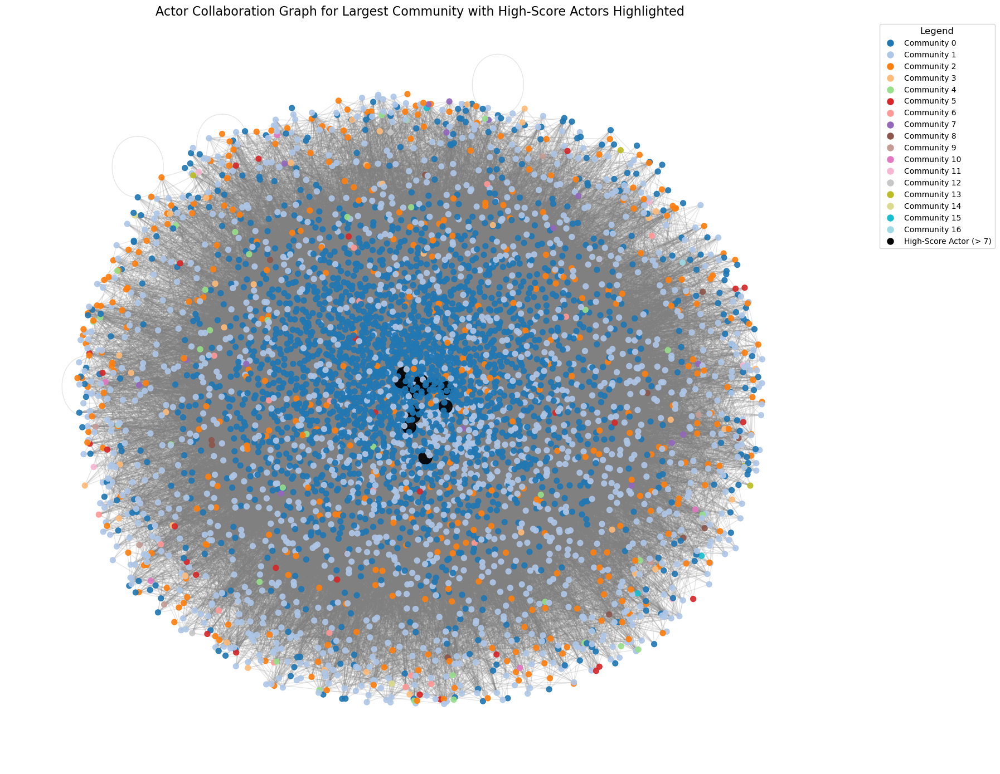

In [74]:
# Create a color map for nodes
node_colors = [colors[node_community_map[node]] for node in G_new.nodes]

# Update node colors for high-score actors (set to black)
node_colors = ['black' if node in high_score_actor_names else node_colors[i] for i, node in enumerate(G_new.nodes)]

# Assign sizes: Larger size for high-score actors
node_sizes = [300 if node in high_score_actor_names else 50 for node in G_new.nodes]

# Create a layout for better separation of communities
pos = nx.spring_layout(G_new, seed=42, k=0.5)  # Adjust k for spacing between communities

# Draw edges with light transparency
plt.figure(figsize=(18, 14))
nx.draw_networkx_edges(G_new, pos, alpha=0.2, edge_color="gray")

# Draw nodes with updated colors and sizes
nx.draw_networkx_nodes(G_new, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)

# Create a legend for community colors
from matplotlib.lines import Line2D

# Generate legend handles
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i], markersize=10, label=f'Community {i}')
    for i in range(len(communities_new))
]

# Add high-score actor legend
legend_elements.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=10, label='High-Score Actor (> 7)'))

# Place the legend outside the plot
plt.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.05, 1),  # Place legend outside the plot
    title="Legend",
    fontsize=10,
    title_fontsize=12
)

# Add a title
plt.title("Actor Collaboration Graph for Largest Community with High-Score Actors Highlighted", fontsize=16)
plt.axis('off')
plt.tight_layout()  # Adjust layout to make room for the legend
plt.show()


In [76]:
import pandas as pd

# Get high-score actors, their community, and their scores
high_score_actor_communities = {
    actor: {
        "Community": node_community_map[actor],
        "Score": largest_community_actors.loc[
            largest_community_actors['ActorName'] == actor, 'Score_PCA_2_scaled'
        ].values[0]
    }
    for actor in high_score_actor_names if actor in node_community_map
}

# Create a DataFrame
high_score_actor_df = pd.DataFrame([
    {"Actor": actor, "Community": info["Community"] + 1, "Score": info["Score"]}
    for actor, info in high_score_actor_communities.items()
])

# Save the DataFrame as a CSV file
high_score_actor_df.to_csv("high_score_actors_with_communities.csv", index=False)

# Display the DataFrame
print(high_score_actor_df)


                 Actor  Community     Score
0      Anthony Hopkins          2  7.573914
1            Brad Pitt          2  7.574717
2       Cate Blanchett          2  7.202896
3       Christian Bale          2  7.651851
4   Christopher Walken          1  7.742485
5          Gary Oldman          2  7.732999
6    Leonardo DiCaprio          1  7.513608
7       Morgan Freeman          2  8.775623
8         Nicolas Cage          1  7.418517
9       Robert De Niro          1  8.549034
10   Robert Downey Jr.          3  8.297680
11      Robin Williams          1  7.341405
12   Samuel L. Jackson          1  8.580670
13           Tom Hanks          1  8.160130


In [77]:
high_score_actor_df

,Actor,Community,Score
0,Anthony Hopkins,2,7.573914
1,Brad Pitt,2,7.574717
2,Cate Blanchett,2,7.202896
3,Christian Bale,2,7.651851
4,Christopher Walken,1,7.742485
5,Gary Oldman,2,7.732999
6,Leonardo DiCaprio,1,7.513608
7,Morgan Freeman,2,8.775623
8,Nicolas Cage,1,7.418517
9,Robert De Niro,1,8.549034


In [84]:
!pip install plotly

   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
    --------------------------------------- 0.3/19.1 MB ? eta -:--:--
   - -------------------------------------- 0.8/19.1 MB 1.9 MB/s eta 0:00:10
   -- ------------------------------------- 1.0/19.1 MB 1.6 MB/s eta 0:00:12
   -- ------------------------------------- 1.3/19.1 MB 1.8 MB/s eta 0:00:11
   --- ------------------------------------ 1.8/19.1 MB 1.8 MB/s eta 0:00:10
   ---- ----------------------------------- 2.1/19.1 MB 1.7 MB/s eta 0:00:10
   ---- ----------------------------------- 2.1/19.1 MB 1.7 MB/s eta 0:00:10
   ---- ----------------------------------- 2.4/19.1 MB 1.5 MB/s eta 0:00:11
   ----- ---------------------------------- 2.6/19.1 MB 1.5 MB/s eta 0:00:11
   ------ --------------------------------- 2.9/19.1 MB 1.4 MB/s eta 0:00:12
   ------ --------------------------------- 3.1/19.1 MB 1.4 MB/s eta 0:00:12
   ------- -------------------------------- 3.4/19.1 MB 1.3 MB/s eta 0:00:12
   ------- --

In [87]:
import plotly.express as px
import pandas as pd

# Prepare data for degree distribution per community
degree_data = []
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    degrees = [d for _, d in subgraph.degree()]
    degree_data.extend([{"Community": f"Community {i + 1}", "Degree": degree} for degree in degrees])

degree_df = pd.DataFrame(degree_data)

# Create interactive plot
fig = px.histogram(degree_df, x="Degree", color="Community", marginal="box", nbins=30,
                   title="Degree Distribution Per Community",
                   labels={"Degree": "Degree", "Community": "Community"},
                   template="plotly_dark")
fig.show()


In [89]:
import plotly.graph_objects as go

# Prepare data for dropdown
dropdown_data = []
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    degrees = [d for _, d in subgraph.degree()]
    dropdown_data.append({"Community": f"Community {i + 1}", "Degrees": degrees})

# Create base figure
fig = go.Figure()

# Add a trace for each community
for data in dropdown_data:
    fig.add_trace(
        go.Histogram(
            x=data["Degrees"],
            name=data["Community"],
            nbinsx=20,
            visible=False  # Start with all traces hidden
        )
    )

# Set the first community visible
fig.data[0].visible = True

# Create dropdown menu
dropdown_buttons = [
    dict(
        label=data["Community"],
        method="update",
        args=[
            {"visible": [j == i for j in range(len(dropdown_data))]},  # Only show the selected community
            {"title": f"Degree Distribution: {data['Community']}"}
        ]
    )
    for i, data in enumerate(dropdown_data)
]

# Update layout with dropdown
fig.update_layout(
    updatemenus=[
        dict(
            buttons=dropdown_buttons,
            direction="down",
            showactive=True,
            x=0.5,
            y=1.15,
            xanchor="center",
            yanchor="top"
        )
    ],
    title="Degree Distribution: Community 1",
    xaxis_title="Degree",
    yaxis_title="Count",
    template="plotly_dark"
)

fig.show()


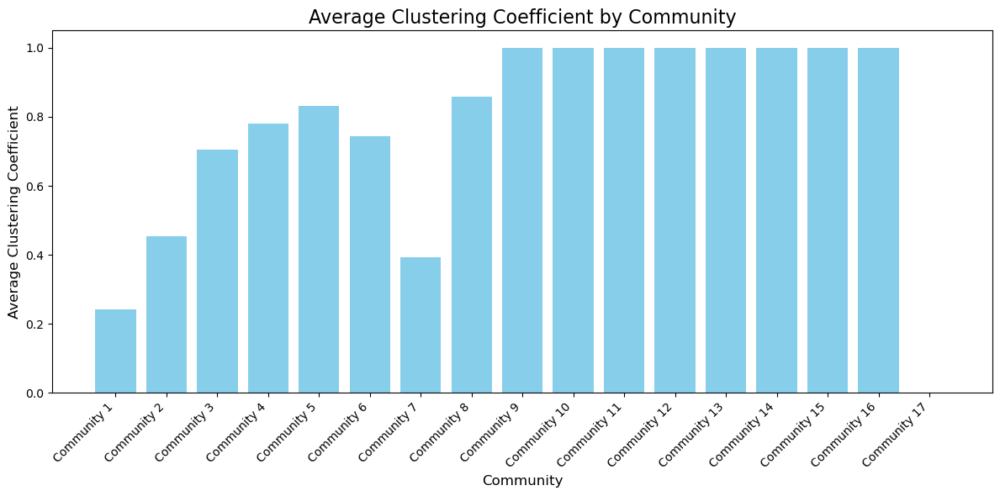

In [91]:
import matplotlib.pyplot as plt

# Prepare clustering coefficient data
clustering_data = []
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    avg_clustering = nx.average_clustering(subgraph)
    clustering_data.append({"Community": f"Community {i + 1}", "Average Clustering Coefficient": avg_clustering})

# Convert to DataFrame for plotting
clustering_df = pd.DataFrame(clustering_data)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(clustering_df["Community"], clustering_df["Average Clustering Coefficient"], color="skyblue")
plt.title("Average Clustering Coefficient by Community", fontsize=16)
plt.xlabel("Community", fontsize=12)
plt.ylabel("Average Clustering Coefficient", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


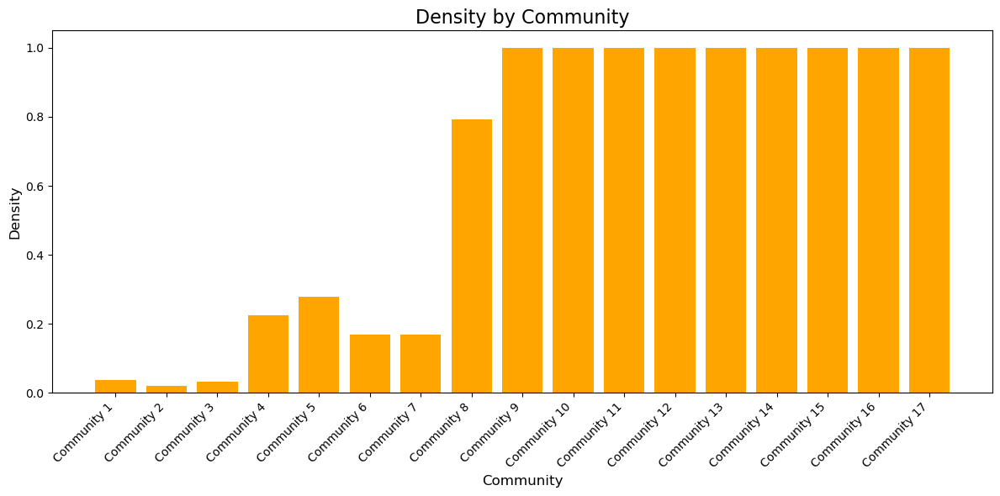

In [92]:
# Prepare density data
density_data = []
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    density = nx.density(subgraph)
    density_data.append({"Community": f"Community {i + 1}", "Density": density})

# Convert to DataFrame for plotting
density_df = pd.DataFrame(density_data)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(density_df["Community"], density_df["Density"], color="orange")
plt.title("Density by Community", fontsize=16)
plt.xlabel("Community", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


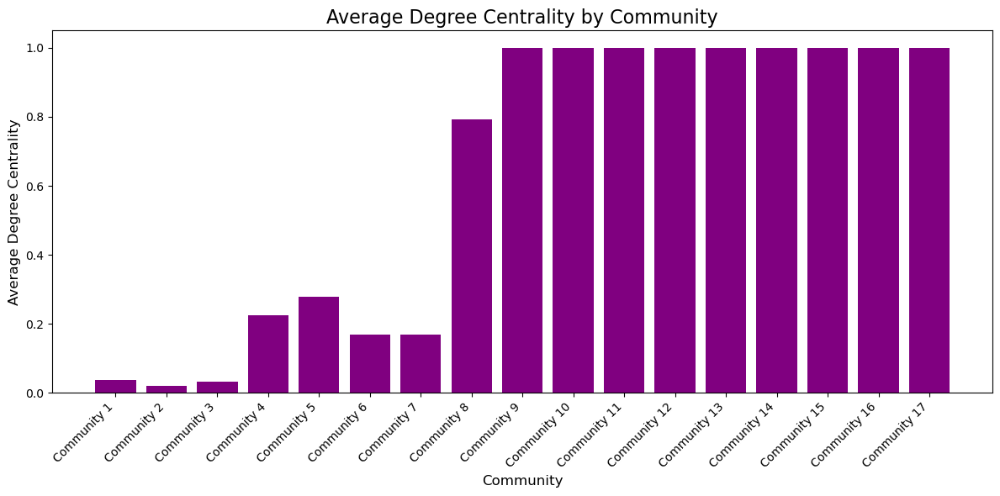

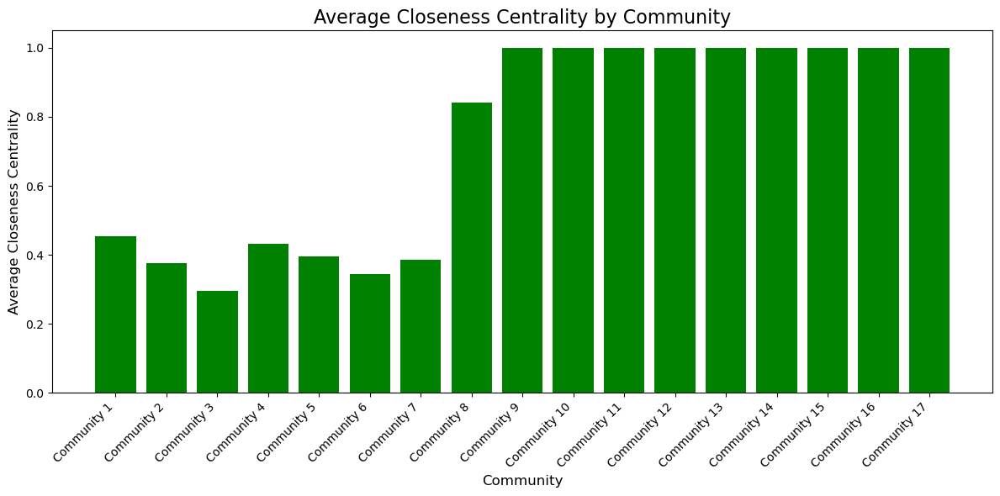

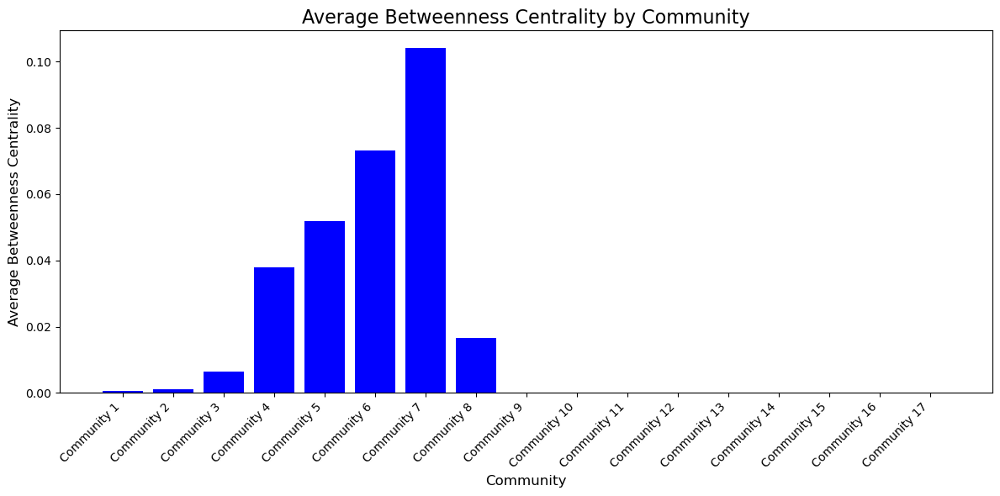

In [93]:
# Prepare centrality data
centrality_data = []
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    degree_centralities = nx.degree_centrality(subgraph).values()
    closeness_centralities = nx.closeness_centrality(subgraph).values()
    betweenness_centralities = nx.betweenness_centrality(subgraph).values()

    centrality_data.append({
        "Community": f"Community {i + 1}",
        "Average Degree Centrality": sum(degree_centralities) / len(degree_centralities),
        "Average Closeness Centrality": sum(closeness_centralities) / len(closeness_centralities),
        "Average Betweenness Centrality": sum(betweenness_centralities) / len(betweenness_centralities)
    })

# Convert to DataFrame for plotting
centrality_df = pd.DataFrame(centrality_data)

# Plot Average Degree Centrality
plt.figure(figsize=(12, 6))
plt.bar(centrality_df["Community"], centrality_df["Average Degree Centrality"], color="purple")
plt.title("Average Degree Centrality by Community", fontsize=16)
plt.xlabel("Community", fontsize=12)
plt.ylabel("Average Degree Centrality", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()

# Plot Average Closeness Centrality
plt.figure(figsize=(12, 6))
plt.bar(centrality_df["Community"], centrality_df["Average Closeness Centrality"], color="green")
plt.title("Average Closeness Centrality by Community", fontsize=16)
plt.xlabel("Community", fontsize=12)
plt.ylabel("Average Closeness Centrality", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()

# Plot Average Betweenness Centrality
plt.figure(figsize=(12, 6))
plt.bar(centrality_df["Community"], centrality_df["Average Betweenness Centrality"], color="blue")
plt.title("Average Betweenness Centrality by Community", fontsize=16)
plt.xlabel("Community", fontsize=12)
plt.ylabel("Average Betweenness Centrality", fontsize=12)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
import plotly.graph_objects as go

# Prepare data for centralities and density
centrality_data = []
density_data = []
for i, community in enumerate(communities_new):
    subgraph = G_new.subgraph(community)
    
    # Calculate centralities
    degree_centralities = nx.degree_centrality(subgraph).values()
    closeness_centralities = nx.closeness_centrality(subgraph).values()
    betweenness_centralities = nx.betweenness_centrality(subgraph).values()
    
    centrality_data.append({
        "Community": f"Community {i + 1}",
        "Average Degree Centrality": sum(degree_centralities) / len(degree_centralities),
        "Average Closeness Centrality": sum(closeness_centralities) / len(closeness_centralities),
        "Average Betweenness Centrality": sum(betweenness_centralities) / len(betweenness_centralities)
    })
    
    # Calculate density
    density_data.append({"Community": f"Community {i + 1}", "Density": nx.density(subgraph)})

# Convert to DataFrames
centrality_df = pd.DataFrame(centrality_data)
density_df = pd.DataFrame(density_data)

# Create base figure
fig = go.Figure()

# Add traces for each metric
# Degree Centrality
fig.add_trace(
    go.Bar(
        x=centrality_df["Community"],
        y=centrality_df["Average Degree Centrality"],
        name="Degree Centrality",
        visible=True
    )
)

# Closeness Centrality
fig.add_trace(
    go.Bar(
        x=centrality_df["Community"],
        y=centrality_df["Average Closeness Centrality"],
        name="Closeness Centrality",
        visible=False
    )
)

# Betweenness Centrality
fig.add_trace(
    go.Bar(
        x=centrality_df["Community"],
        y=centrality_df["Average Betweenness Centrality"],
        name="Betweenness Centrality",
        visible=False
    )
)

# Density
fig.add_trace(
    go.Bar(
        x=density_df["Community"],
        y=density_df["Density"],
        name="Density",
        visible=False
    )
)

# Add dropdown menu
fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(label="Degree Centrality",
                     method="update",
                     args=[{"visible": [True, False, False, False]},
                           {"title": "Average Degree Centrality by Community"}]),
                dict(label="Closeness Centrality",
                     method="update",
                     args=[{"visible": [False, True, False, False]},
                           {"title": "Average Closeness Centrality by Community"}]),
                dict(label="Betweenness Centrality",
                     method="update",
                     args=[{"visible": [False, False, True, False]},
                           {"title": "Average Betweenness Centrality by Community"}]),
                dict(label="Density",
                     method="update",
                     args=[{"visible": [False, False, False, True]},
                           {"title": "Density by Community"}])
            ],
            direction="down",
            showactive=True,
            x=0.5,
            y=1.15,
            xanchor="center",
            yanchor="top"
        )
    ],
    title="Average Centralities and Density by Community",
    xaxis_title="Community",
    yaxis_title="Value",
    template="plotly_dark"
)

# Show the figure
fig.show()


The world of acting is not just about talent; it’s also about strategy, connections, and choosing the right opportunities. Through our analysis, a clear picture emerged of what it takes to rise to the top in this competitive industry.

One of the key lessons is the importance of collaboration. The most successful actors, such as Samuel L. Jackson and Bruce Willis, are not just prolific in their craft—they are prolific collaborators. They have worked with a wide range of co-stars, spanning multiple projects and genres. Their high degree centrality shows the power of building an expansive network. For an aspiring actor, this means seeking out ensemble projects or opportunities to collaborate with a variety of people. Building a reputation as a team player who bridges different networks is critical to long-term success.

When it comes to genres, Drama stands out as the foundation of success. Across all communities, it was the most dominant genre, followed by Comedy and Thriller. Actors in top-performing communities frequently work in these genres, suggesting they offer both visibility and opportunity. For someone starting out, Drama can serve as a gateway to recognition, while diversifying into Comedy or Thriller can help broaden your appeal and reach.

Geography also plays a crucial role. The United States dominates as the epicenter of collaborations, with Hollywood serving as the ultimate stage for aspiring actors. The United Kingdom and Germany also emerged as significant players, offering unique opportunities in both mainstream and niche markets. For an actor looking to make a mark, establishing a foothold in Hollywood is vital, but opportunities in British cinema or European collaborations should not be overlooked.

Communities within the network revealed another vital insight: the power of belonging. Larger, interconnected communities like the one led by Samuel L. Jackson and Bruce Willis provide immense opportunities for growth and visibility. Working with well-connected actors and directors can serve as a stepping stone into these influential networks. Tightly-knit communities, with high clustering coefficients, showed how fostering long-term relationships can lead to recurring roles and collaborations. Acting, after all, is as much about trust and relationships as it is about skill.

Versatility, too, plays a role in an actor's trajectory. While many successful actors have a dominant genre, they often branch out into other areas to demonstrate range. Being versatile makes you a more valuable collaborator and increases your opportunities across different projects. It’s about balancing depth with breadth—establishing yourself in one area while keeping the door open for others.

In essence, success in acting is a blend of strategy and collaboration. It’s about choosing the right genres, focusing on key markets, building meaningful relationships, and positioning yourself within influential communities. By following this roadmap, an aspiring actor can maximize their chances of success, creating a career that’s not only impactful but enduring.